## SISTEMA MTS REGIONALE DI RILEVAZIONE DEI FLUSSI DI TRAFFICO
- Il Sistema regionale di rilevazione del traffico dell’Emilia-Romagna consente il monitoraggio continuo (24 ore su 24) dei flussi di traffico sulle principali tratte stradali.
- È costituito da 281 postazioni dotate di sensori a microonde 
- Le postazioni rilevano i veicoli in transito e li classificano nelle seguenti categorie:
<ul>
  <li>1. MOTOVEICOLI</li>
  <li>2. AUTO E MONOVOLUME</li>
  <li>3. AUTO E MONOVOLUME CON RIMORCHIO</li>
  <li>4. FURGONCINI E CAMIONCINI</li>
    <li>5. CAMION MEDI (fino a 7,5 m)</li>
    <li>6. CAMION GRANDI</li>
    <li>7. AUTOTRENI (autocarri con rimorchio)</li>
    <li>8. AUTOARTICOLATI (trattori con semirimorchio)</li>
    <li>9. AUTOBUS</li>
    <li>10. ALTRI (mezzi speciali, trasporti eccezionali, mezzi agricoli, macchine operatrici...)</li>
</ul>
  
Le categorie (1-4) vengono aggregate e classificate ulteriormente come mezzi leggeri mentre quelle (5-10) come mezzi pesanti 
<h4>In questo notebook viene analizzato il traffico con riferimento al solo anno in corso (Gennaio, Febbraio, Marzo) 2020!</h4>

In [63]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import folium
import geopandas as gpd
from stldecompose import decompose, forecast
from stldecompose.forecast_funcs import (naive, drift, mean, seasonal_naive)

data_post = pd.read_csv('MTS_2020.csv')
data_post.head(2)

,AnnoMese,Postazione,Giorno,N Giorno Settimana,Strada,Transiti - Totale,Transiti - Non Classificato,Transiti - Leggeri,Transiti - Pesanti,Transiti - Diurno,Transiti - Notturno,Transiti - Feriali,Transiti - Festivi
0,2020/01,6,01/01/2020,3,SS 12 tra Fiumalbo e Abetone,4573.0,0.0,4560.0,13.0,3451.0,1122.0,0.0,4573.0
1,2020/01,6,02/01/2020,4,SS 12 tra Fiumalbo e Abetone,3709.0,0.0,3664.0,45.0,3226.0,483.0,3709.0,0.0


In [64]:
data_post.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20853 entries, 0 to 20852
Data columns (total 13 columns):
AnnoMese                       20853 non-null object
Postazione                     20853 non-null int64
Giorno                         20853 non-null object
N Giorno Settimana             20853 non-null int64
Strada                         20853 non-null object
Transiti - Totale              18538 non-null float64
Transiti - Non Classificato    18538 non-null float64
Transiti - Leggeri             18538 non-null float64
Transiti - Pesanti             18538 non-null float64
Transiti - Diurno              18538 non-null float64
Transiti - Notturno            18538 non-null float64
Transiti - Feriali             18538 non-null float64
Transiti - Festivi             18538 non-null float64
dtypes: float64(8), int64(2), object(3)
memory usage: 2.1+ MB


In [65]:
# Dimensioni dataset
print('Righe ', data_post.shape[0])
print('Colonne ',data_post.shape[1])

Righe  20853
Colonne  13


### Aggregazione dati per campo di analisi 

In [66]:
agg_by_Strada = data_post.groupby(by = ['Strada'])
agg_by_nr_postazione = data_post.groupby(by= data_post['Postazione'])
agg_by_AnnoMese = data_post.groupby(by= data_post['AnnoMese'])

### Analisi Traffico Mezzi Leggeri vs Pesanti

#### Visualizzazione trafico transiti leggeri per ogni strada 
<p>Per ragioni di spazio si visualizzano solo le prime tre strade. </p>

Asse viario Modena-Sassuolo tra Modena e Baggiovara


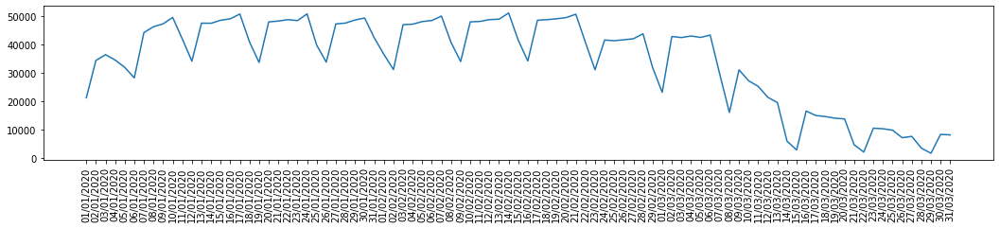

NSA 313 - Prosecuzione tangenziale di Bologna complanare sud alla A 14 nel tratto San Lazzaro/Idice


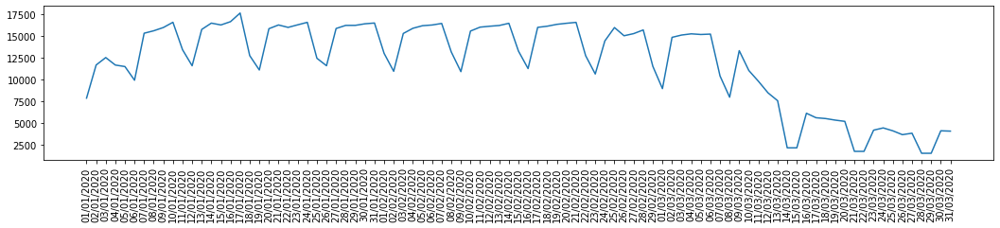

Piazzale Milano (ex SS 9) c/o ponte fiume Po


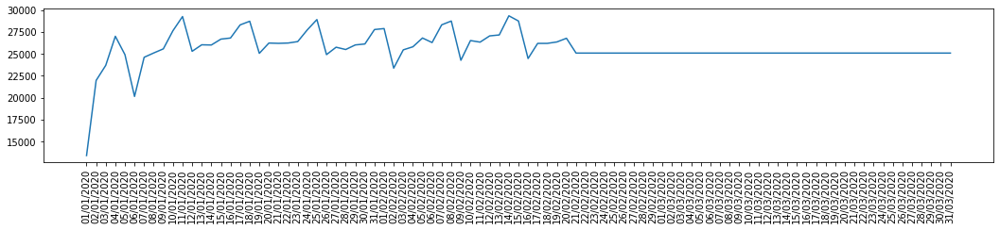

SP 1 da Villafranca di Forlì al confine provinciale


In [67]:
counter = 0
for index, strada in agg_by_Strada:
    print(index)
    counter += 1
    if counter > 3 : break
    strada = strada.fillna(method='ffill')
    strada = strada.set_index(['Giorno'])
    plt.figure(figsize = (18, 3))
    plt.plot(strada['Transiti - Leggeri'])
    plt.xticks(rotation='vertical', fontsize=10)
    
    plt.show()

#### Visualizzazione trafico transiti pesanti per ogni strada 
<p>Per ragioni di spazio si visualizzano solo le prime tre strade. </p>

Asse viario Modena-Sassuolo tra Modena e Baggiovara


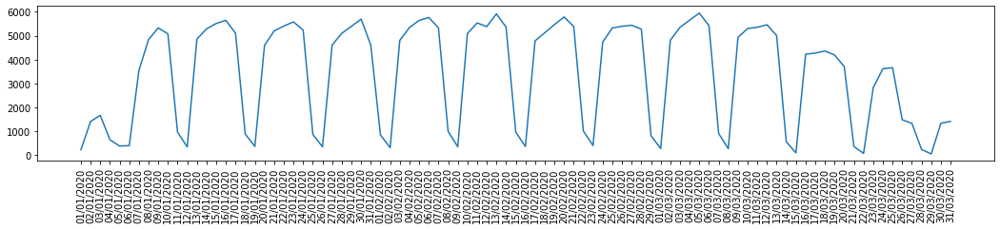

NSA 313 - Prosecuzione tangenziale di Bologna complanare sud alla A 14 nel tratto San Lazzaro/Idice


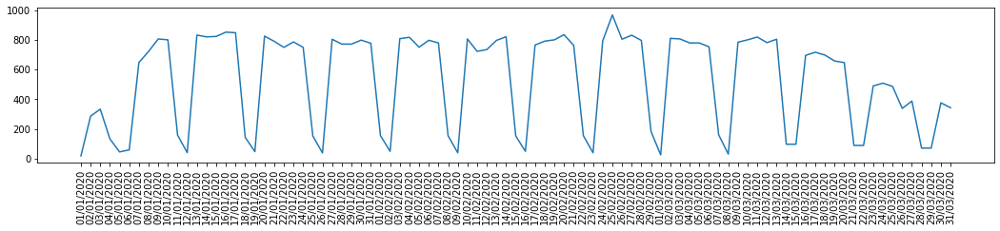

Piazzale Milano (ex SS 9) c/o ponte fiume Po


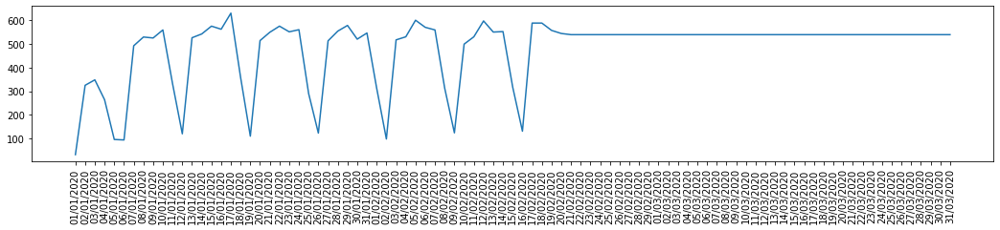

SP 1 da Villafranca di Forlì al confine provinciale


In [68]:
counter = 0
for index, strada in agg_by_Strada:
    print(index)
    counter += 1
    if counter > 3 : break
    strada = strada.fillna(method='ffill')
    strada = strada.set_index(['Giorno'])
    plt.figure(figsize = (18, 3))
    plt.plot(strada['Transiti - Pesanti'])
    plt.xticks(rotation='vertical', fontsize=10)
    
    plt.show()

### Analisi Traffico - Feriali vs. Festivi 

#### Visualizzazione trafico transiti per ogni strada durante i giorni feriali 
<p>Per ragioni di spazio si visualizzano solo le prime tre strade. </p>

Asse viario Modena-Sassuolo tra Modena e Baggiovara


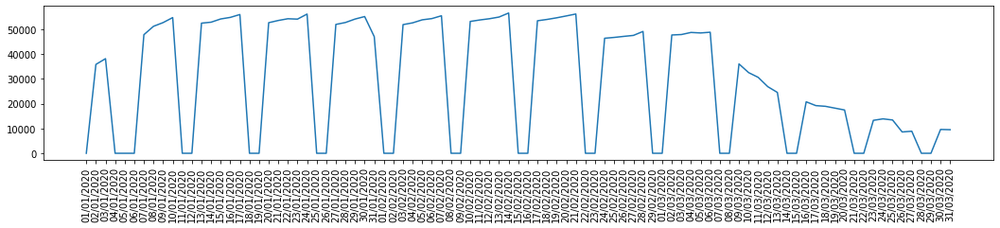

NSA 313 - Prosecuzione tangenziale di Bologna complanare sud alla A 14 nel tratto San Lazzaro/Idice


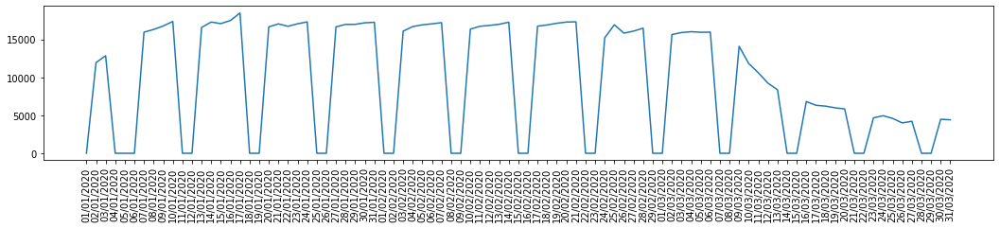

Piazzale Milano (ex SS 9) c/o ponte fiume Po


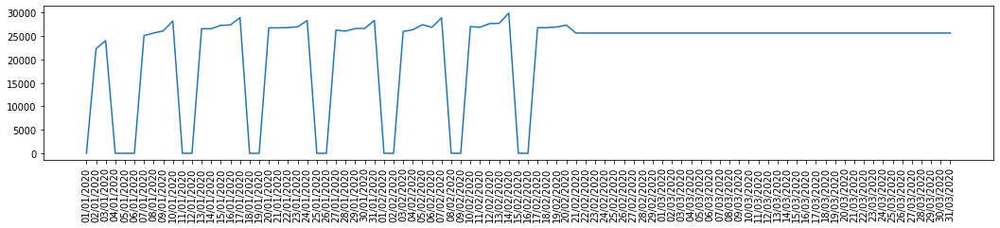

SP 1 da Villafranca di Forlì al confine provinciale


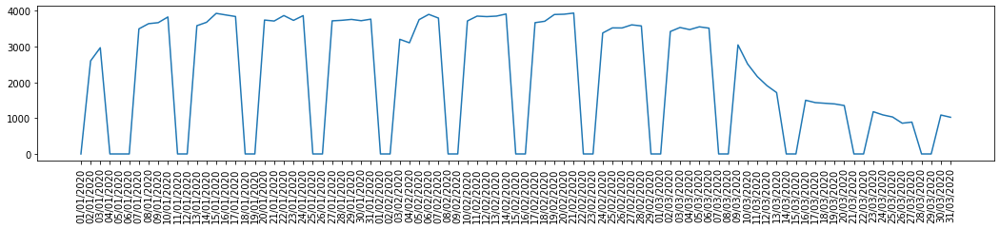

SP 1 fra Crevalcore e Decima


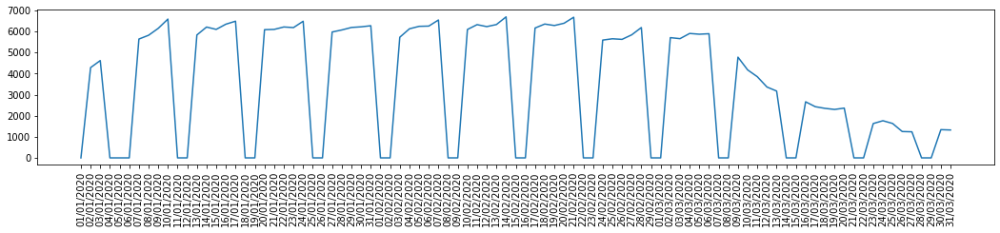

SP 1 tra intersezione SP7 a Piacenza


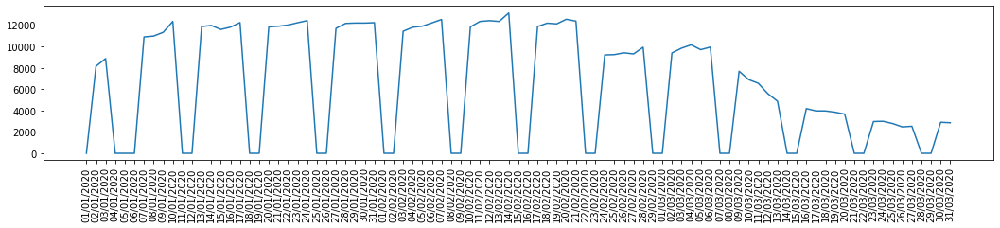

SP 10 da San Secondo Parmense al bivio per Roccabianca centro abitato Pizzo


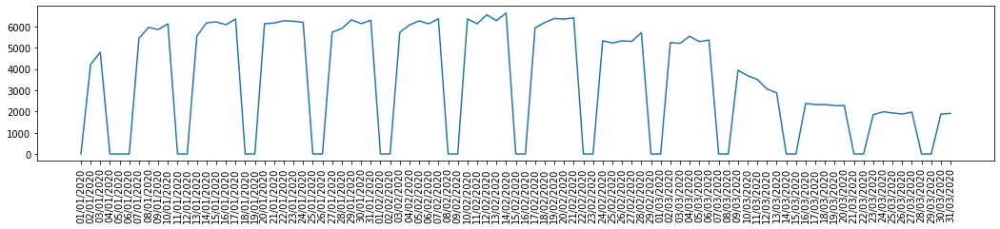

SP 10 dal bivio con SP 89 (San Mauro Pascoli) c/o A 14  al bivio SS 16 (San Mauro Mare)


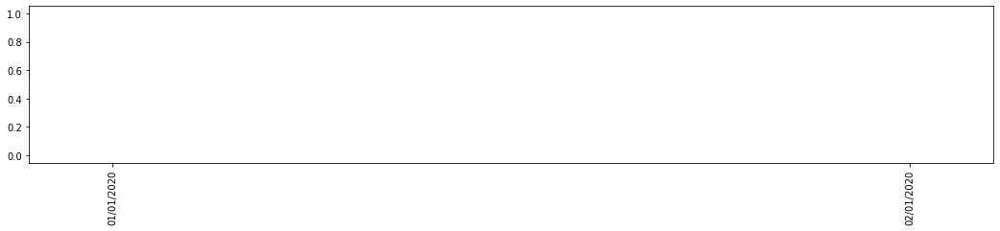

SP 10 nuovo ponte sul Po tra innesto variante Zibello e confine regionale (Lombardia)


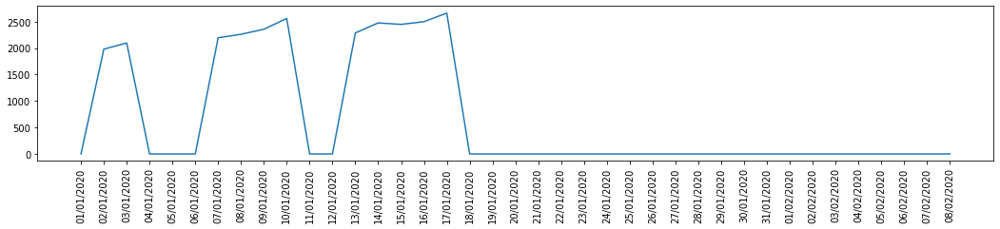

SP 10 tra Parma (Tangenziale) e Viarolo


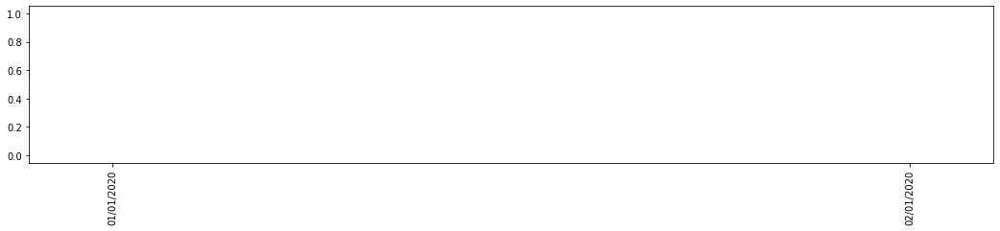

SP 10 tra Polesine e Roccabianca su variante Zibello


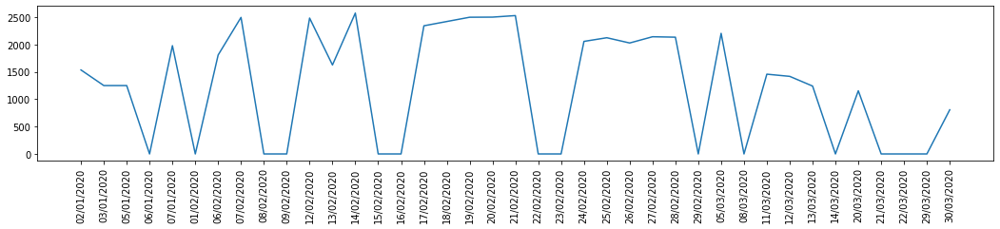

SP 10R fra Caorso e Roncaglia


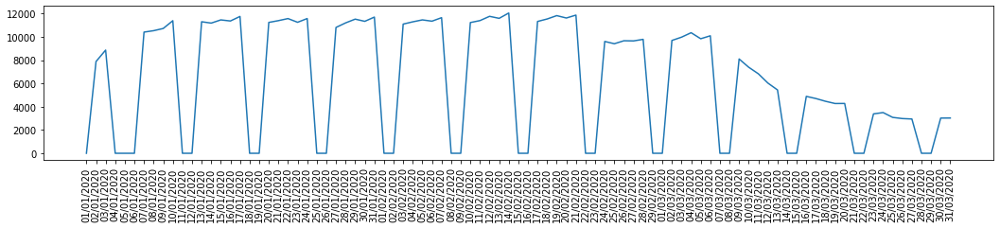

SP 10R fra Castel San Giovanni e Confine regionale (Lombardia)


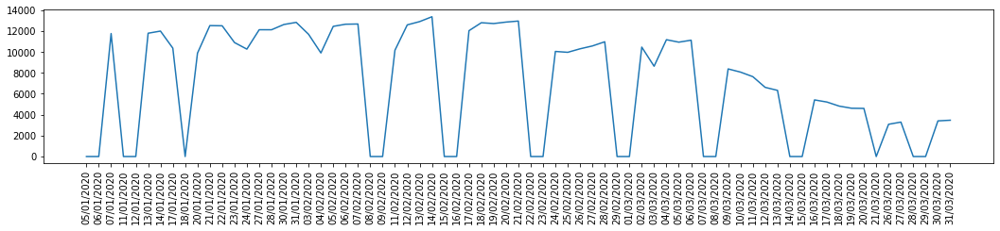

SP 10R fra Castelvetro Piacentino e Monticelli d'Ongina


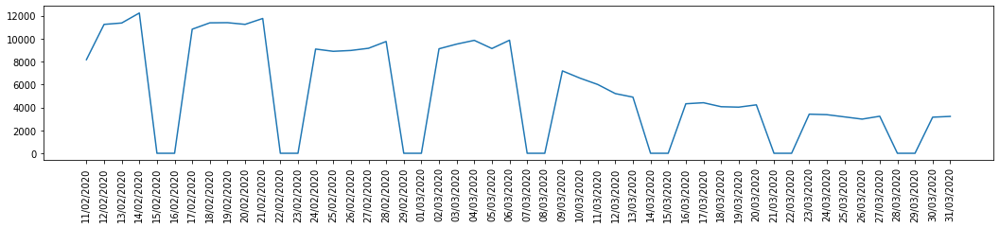

SP 10R fra Castelvetro Piacentino e confine regionale (Lombardia)


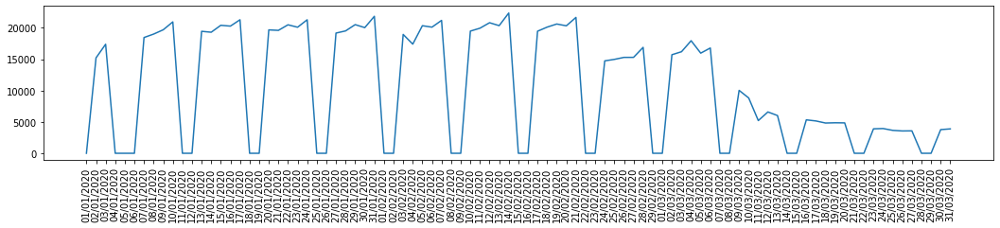

SP 10R tra Castel San Giovanni e Sarmato


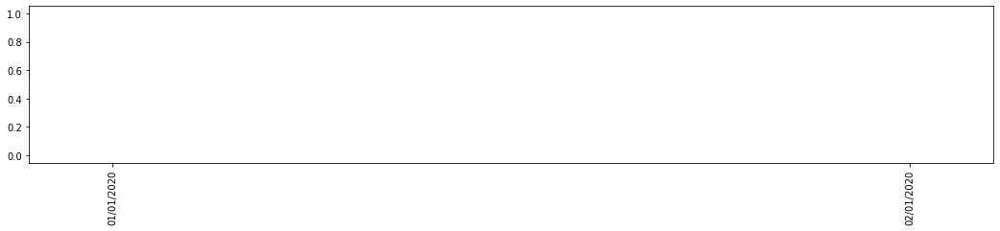

SP 10R tra Piacenza (Casello A 1/A 21) e il bivio SP 10R e SP 587R


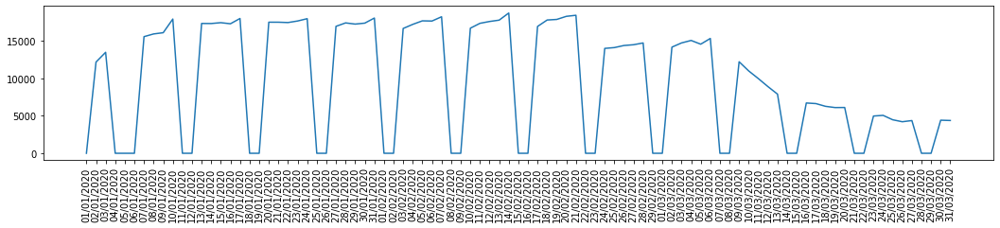

SP 10R tra Piacenza (ponte fiume Trebbia) e San Nicolo'


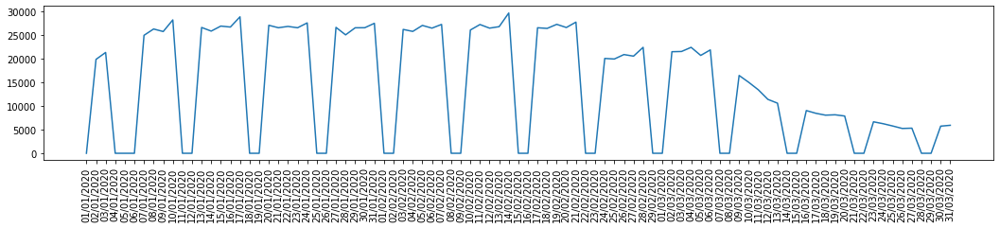

SP 11 da Soragna a Roncole Verdi


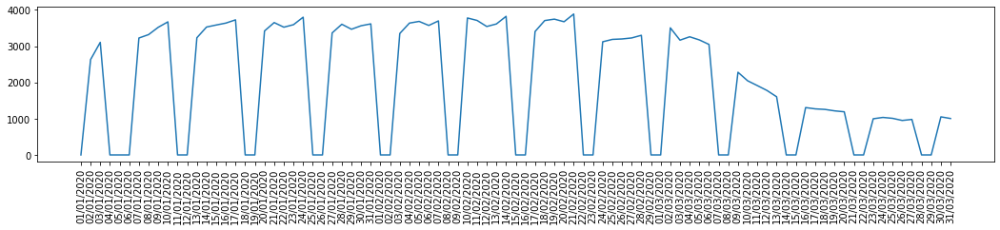

SP 11 fra Borgonovo e Gragnano


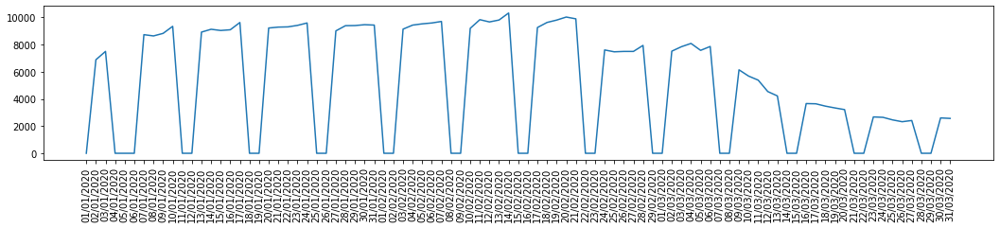

SP 11 fra Pieve di Cento e San Pietro in Casale


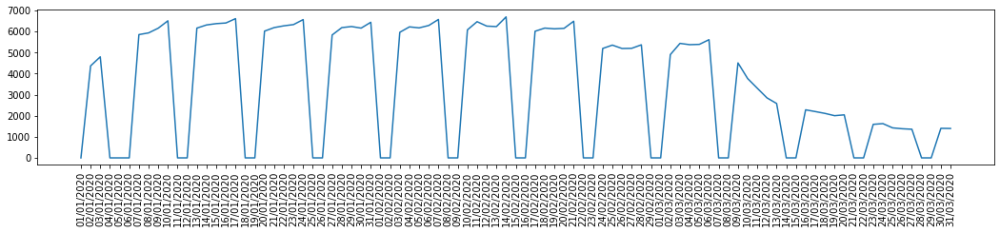

SP 11 tra Fontevivo e Cispadana (tangenziale)


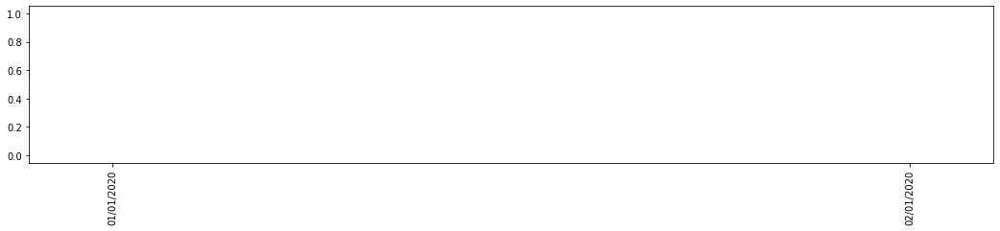

SP 111 fra via Emilia e la variante Asse Val d'Enza


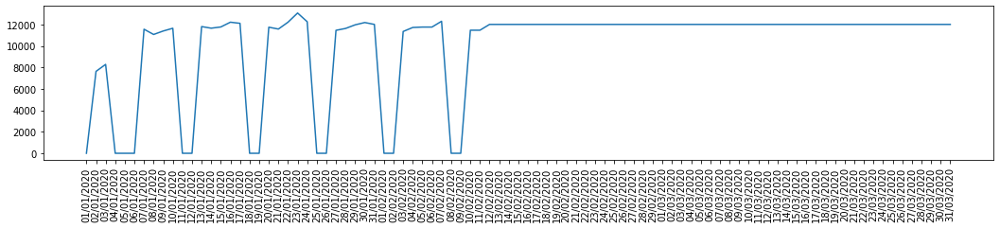

SP 111 sulla variante Asse Val'Enza (dal bivio per Nocetolo al bivio per Castelnovo di Sotto)


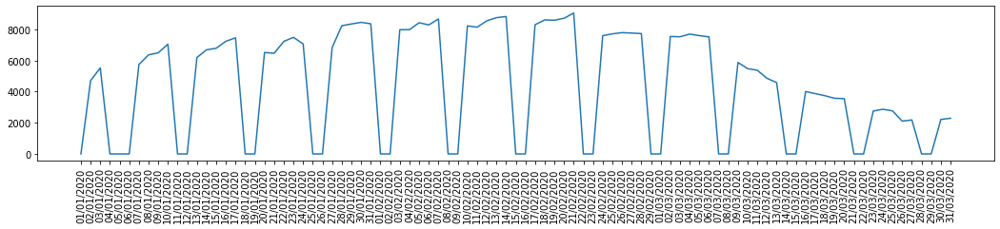

SP 111 tra Boretto e Viadana sul ponte Po


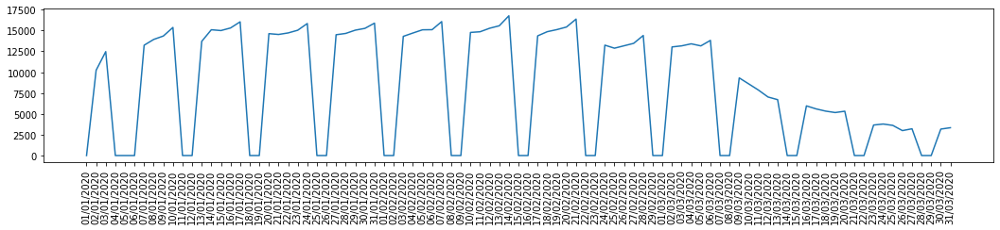

SP 111 tra bivio SP 1 (a nord di Poviglio) e Boretto (innesto variante)


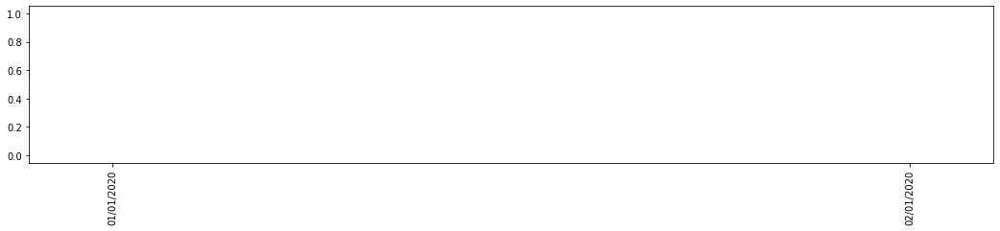

SP 113 sulla variante di San Martino in Rio/Correggio c/o le località Prato/Gazzata


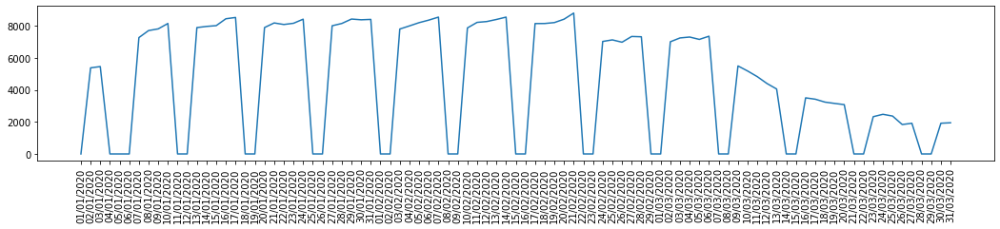

SP 114 dalla rotatoria SP 114/viale Parisoli alla rotatoria SP467


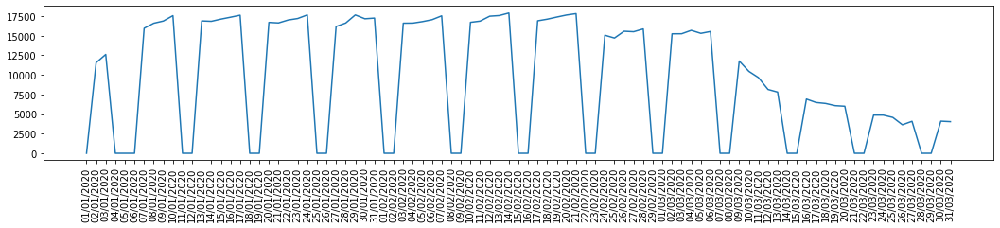

SP 118 tra Casemurate (bivio SP 254R) e il confine provinciale


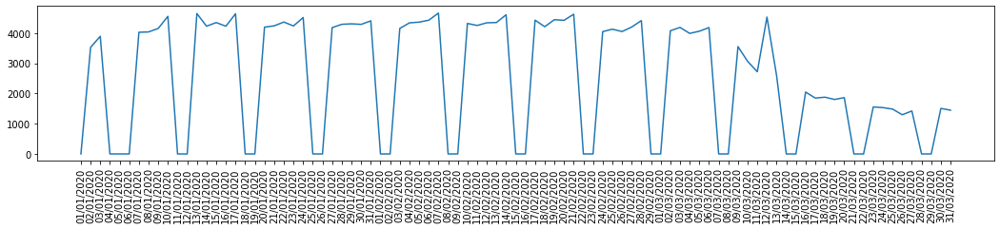

SP 12 da Fidenza (Casello A 1) a Soragna


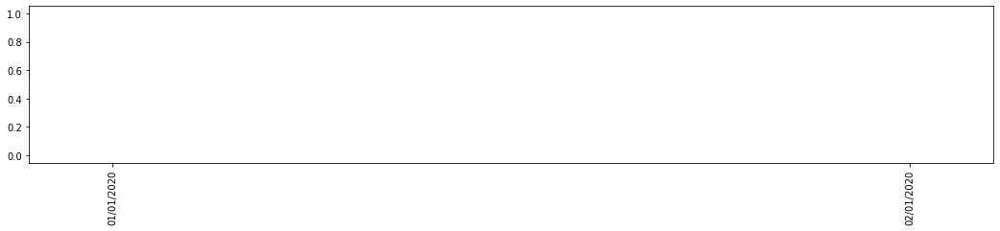

SP 12 fra San Polo d'Enza e Montecchio Emilia (variante a sud abitato)


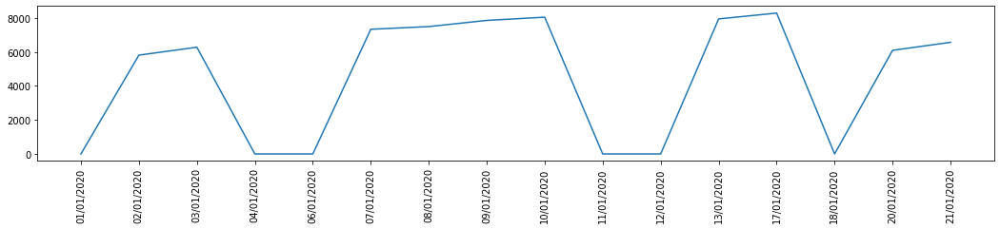

SP 12 fra Sant'Ilario d'Enza (variante a sud) e Montecchio Emilia


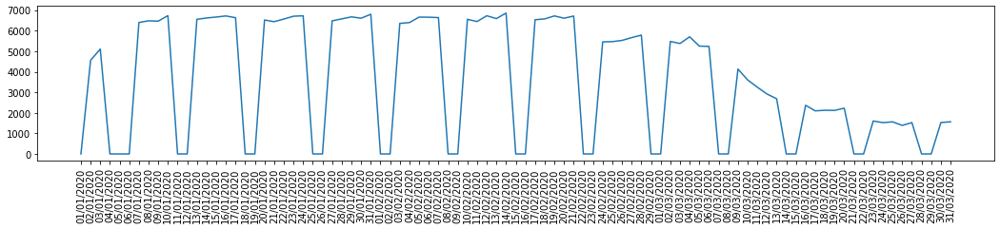

SP 12 fra casello A 1 e Fidenza


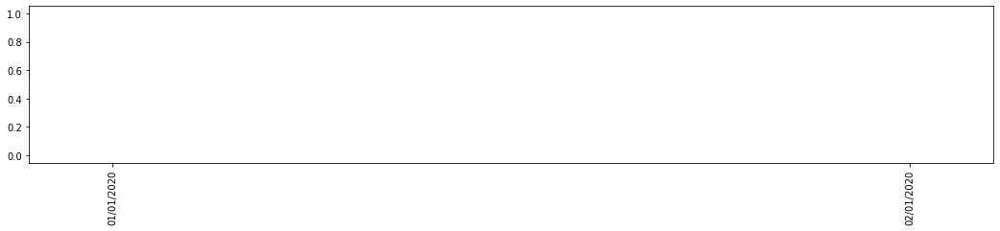

SP 13 in località Santa Maria di Fabriago


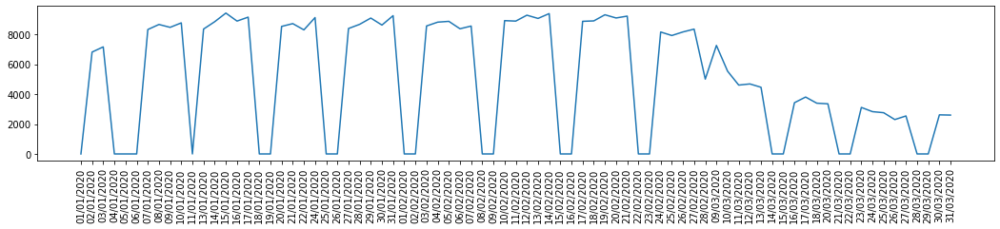

SP 13 tra SS 9 (Santarcangelo di Romagna) e SP 92 (località Camerano)


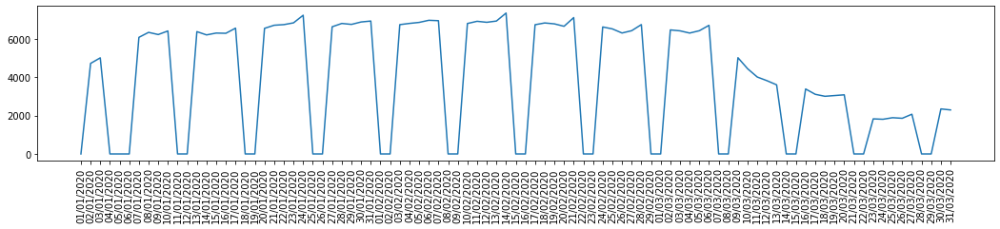

SP 138 tra SPiero in Bagno (E 45) e Bagno di Romagna


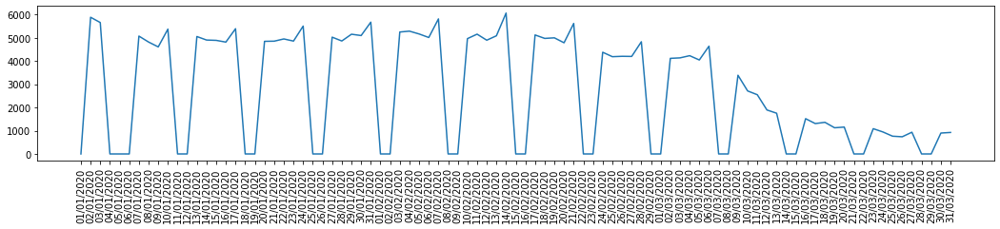

SP 14 fra Lugo (bivio SSPP 41/46) e Fusignano


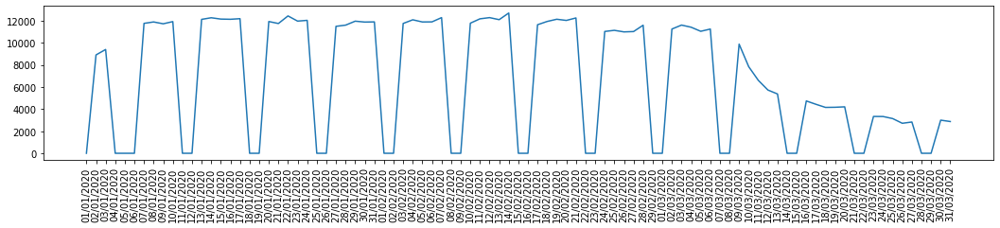

SP 14 tra Colombare (bivio SP 14Ter) e bivio SP 258R


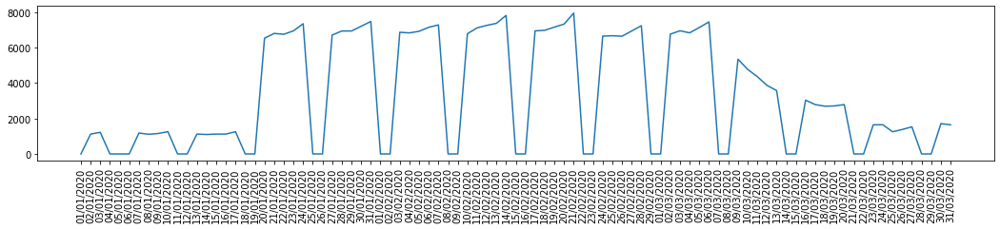

SP 140 da Diegaro (SS 9) a Pievesestina (E 45)


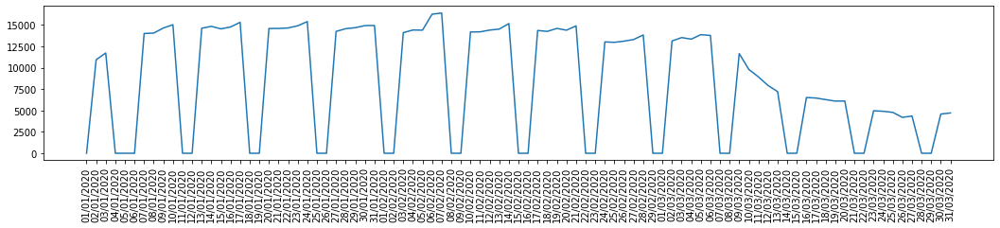

SP 15 fra SS62 e Sala Baganza


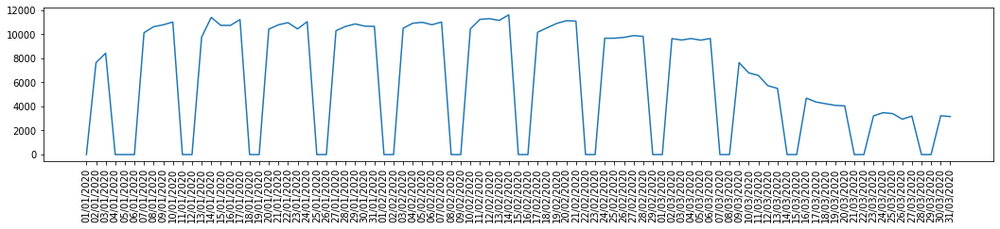

SP 15 tra Sassuolo e Magreta


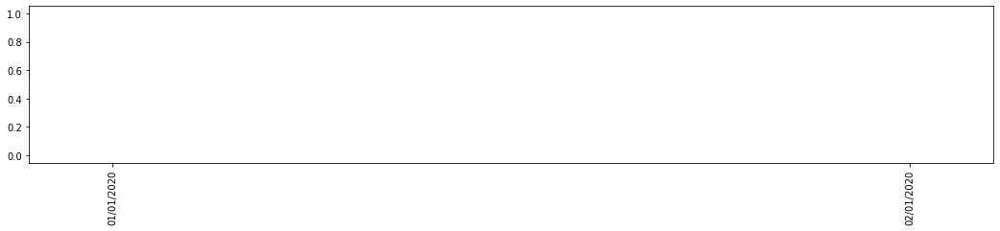

SP 15 tra Tresigallo e Massa Fiscaglia


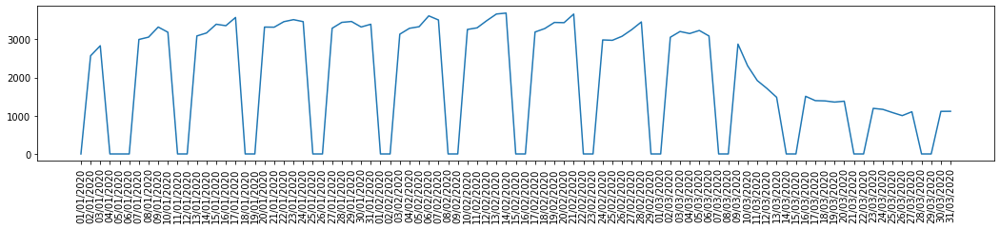

SP 16 dalla località Basilicanova al bivio SP 32 centro abitato Mamiano


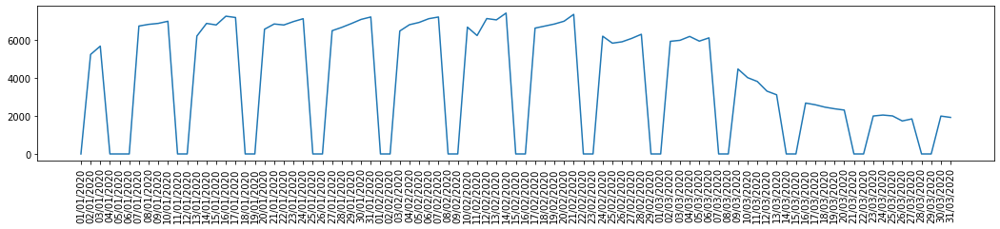

SP 17V tra San Giovanni in Marignano e Morciano di Romagna (variante)


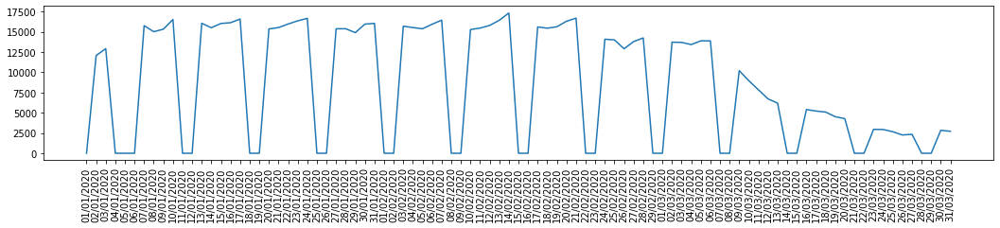

SP 18 da Pilastrello (bivio SP 513R) al bivio per la Pedemontana


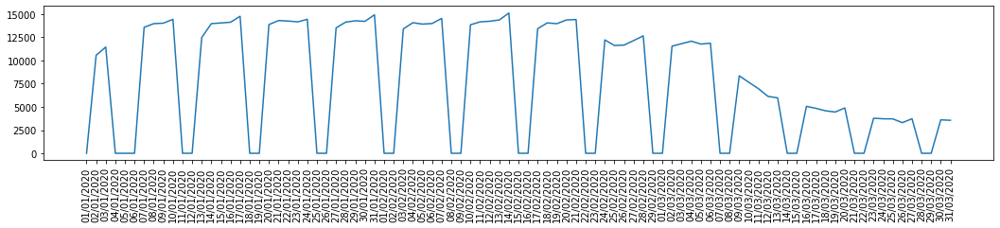

SP 18 da San Clemente al bivio SP 132 (località Osteria Nuova)


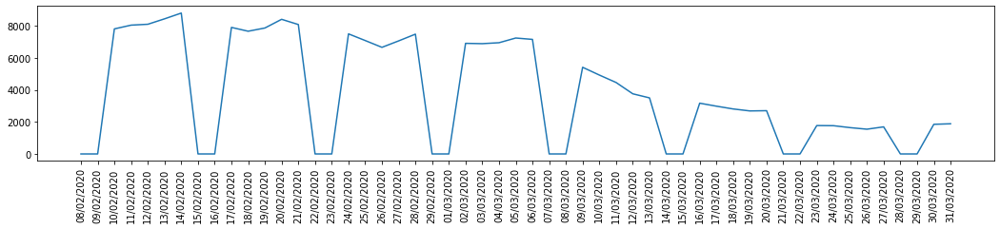

SP 18 tra Bargellino e Calderara di Reno (c/o Variante SP18)


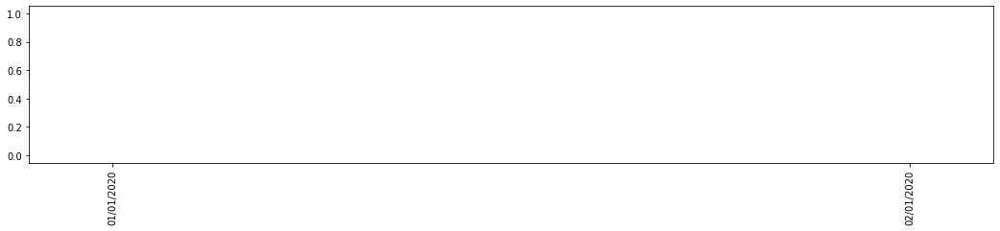

SP 18 tra Bondeno e il confine regionale (Lombardia)


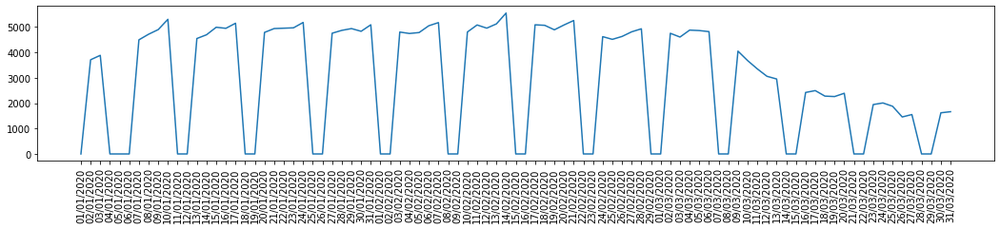

SP 19 fra Colombaia (bivio SP 76) e il Bivio SP 486R al confine provinciale


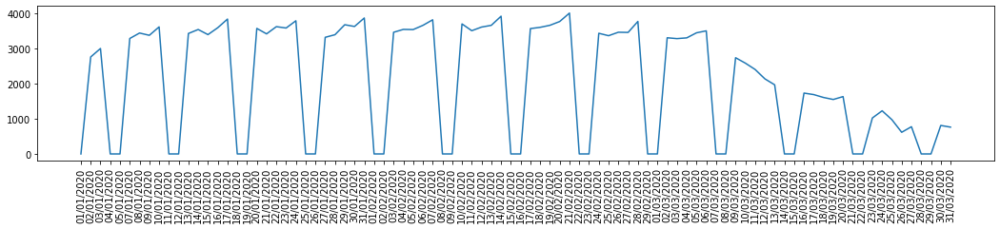

SP 19 tra SP31 e Medicina


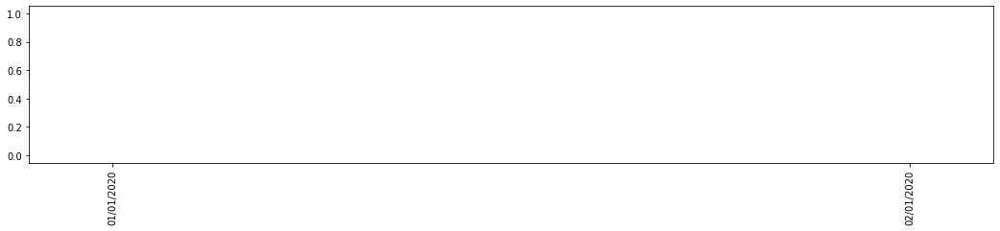

SP 2 fra Reggiolo (bivio SP 2) e località Villarotta (SP 84)


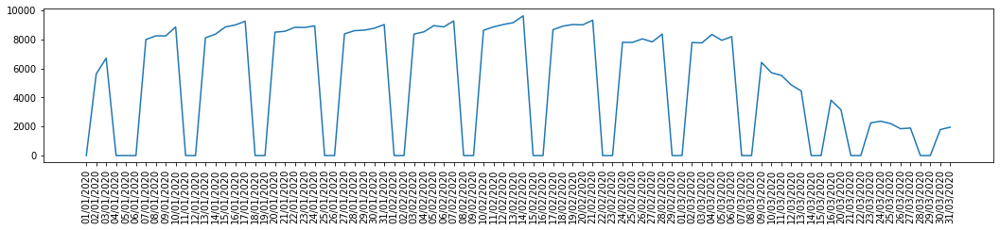

SP 2 fra Reggiolo c/o bivio variante nord e confine regionale


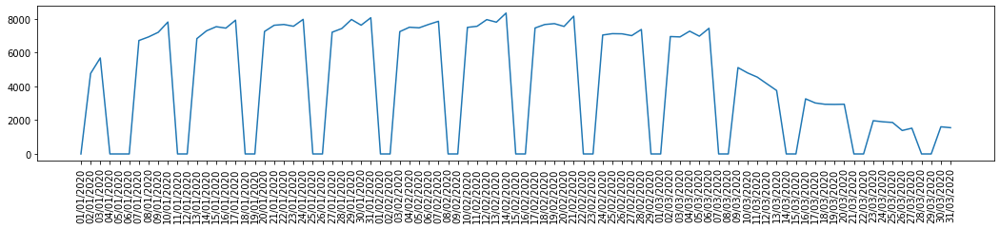

SP 2 in località La Caserma al Confine Provinciale


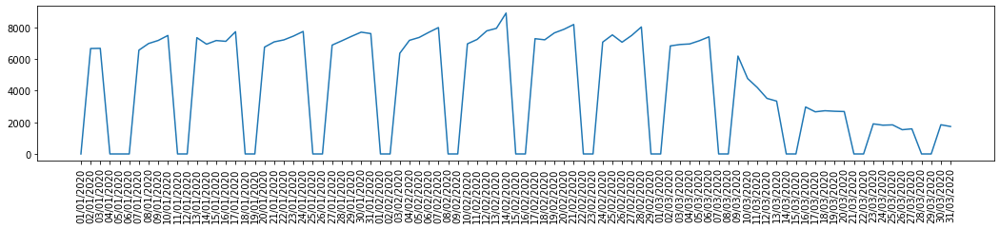

SP 2 tra intersezione SP 14 e Copparo


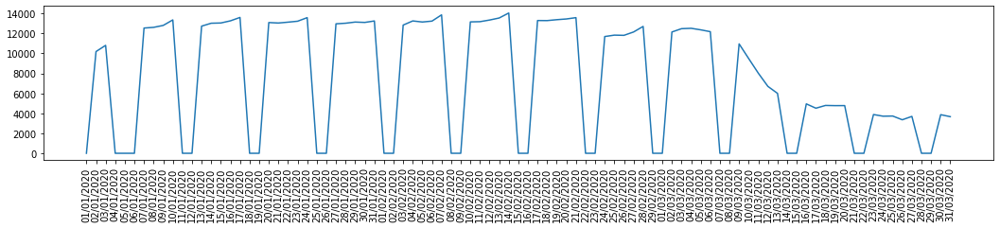

SP 21 da Castel San Pietro al bivio SP 35 (c/o Sassoleone)


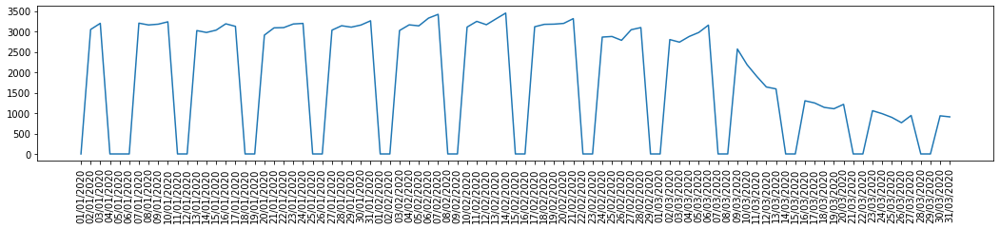

SP 23 tra Quattro Castella e la Variante di Montecavolo (c/o bivio SP 21)


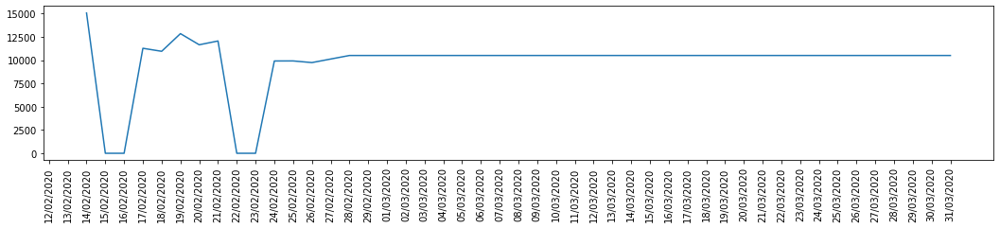

SP 23 tra Rivalta e la variante di Montecavolo


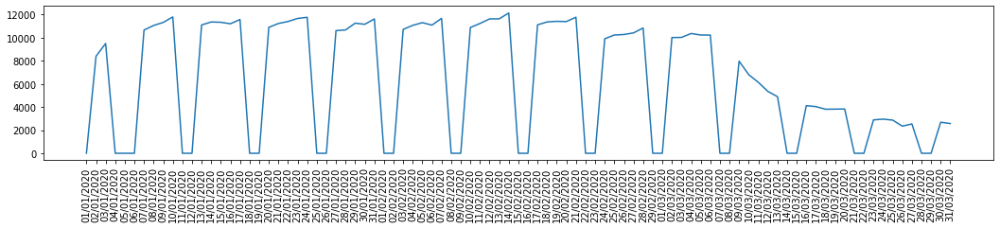

SP 253 tra Sesto Imolese e Medicina


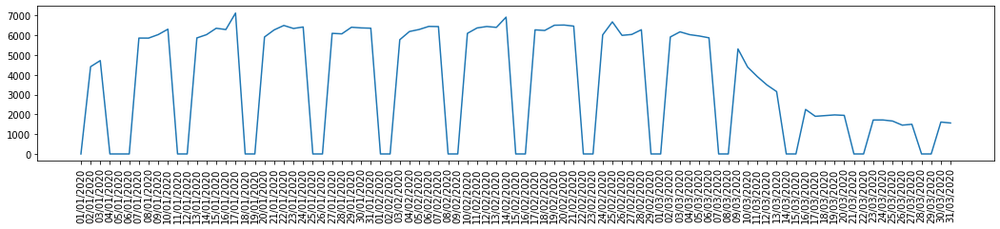

SP 253R dal bivio SP 302R allo svincolo A 14dir a Fornace Zarattini


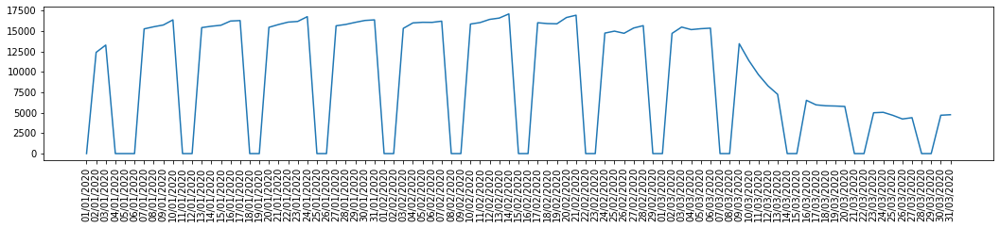

SP 253R fra Bagnacavallo (A14 Dir) e Godo (bivio SP 302R)


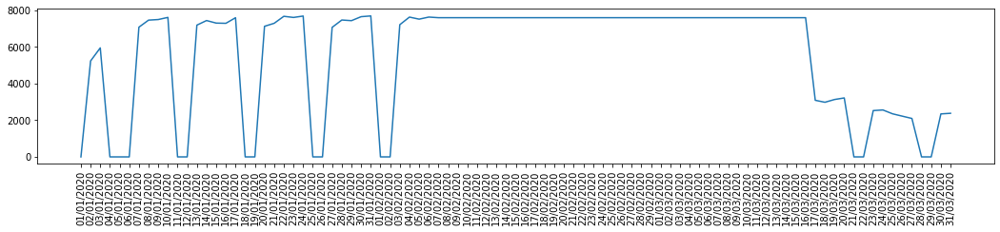

SP 253R tra Lugo (ponte fiume Senio) e Bagnacavallo


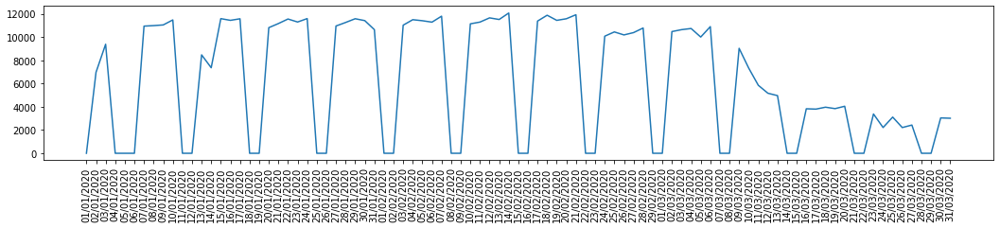

SP 255 da Decima a San Giovanni in Persiceto


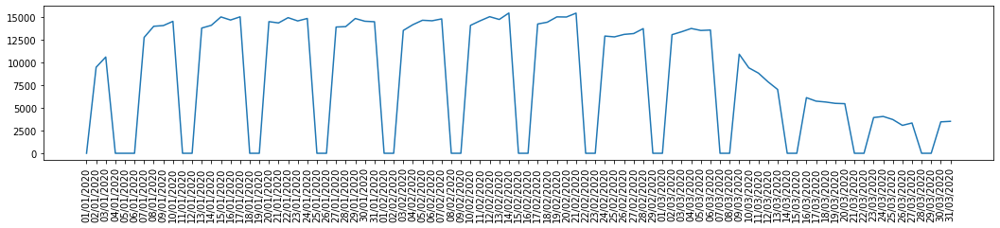

SP 255 fra Nonantola e Sant'Agata Bolognese


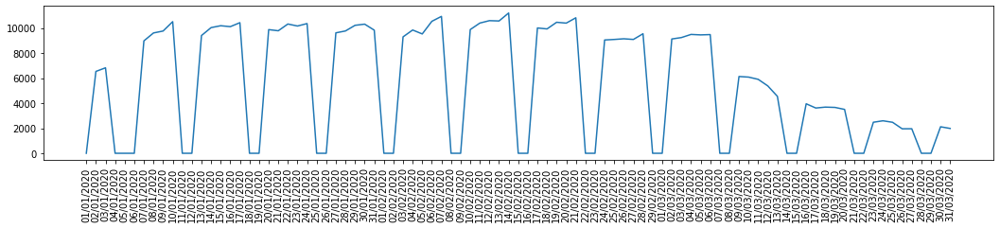

SP 255 tra Modena e Navicello


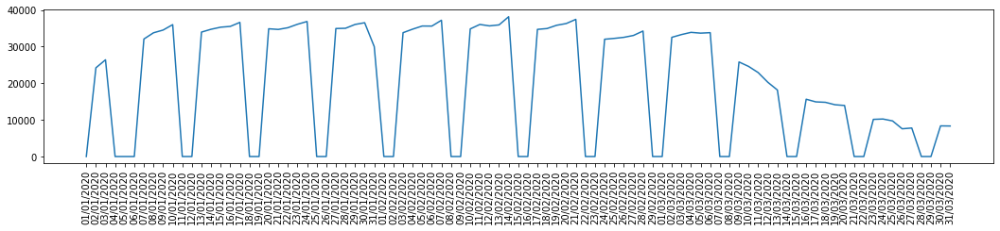

SP 258R tra Rimini e A 14


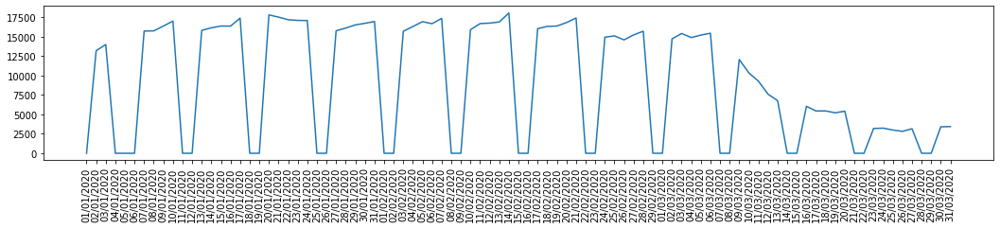

SP 258R tra Villa Verucchio ed ex Confine regionale (località Dogana)


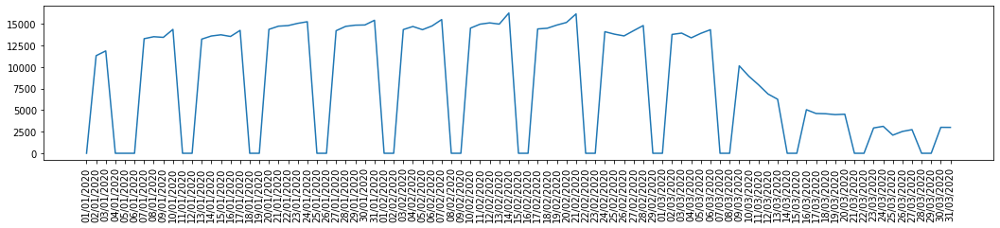

SP 26 da Santa Sofia a San Piero in Bagno


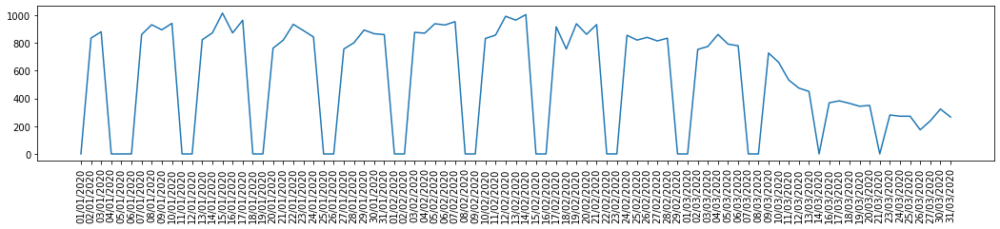

SP 26 tra Gesso e Ponte Rivabella


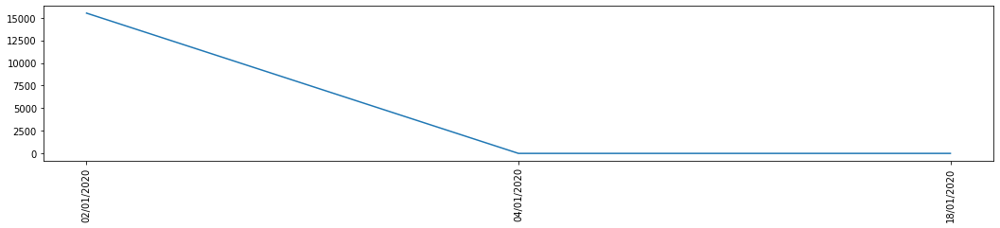

SP 27 tra Ponte Samoggia e Muffa


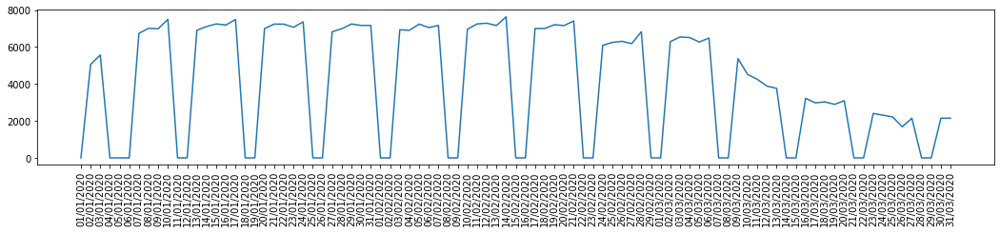

SP 28 fra Fornovo di Taro e Varano de Melegari centro abitato Viazzano


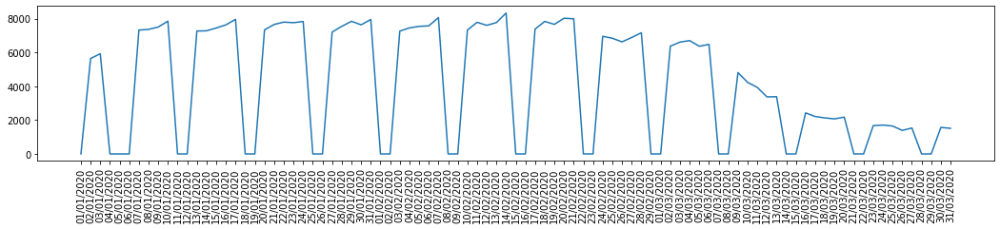

SP 28 in località Molinazzo (Comune di Gossolengo)


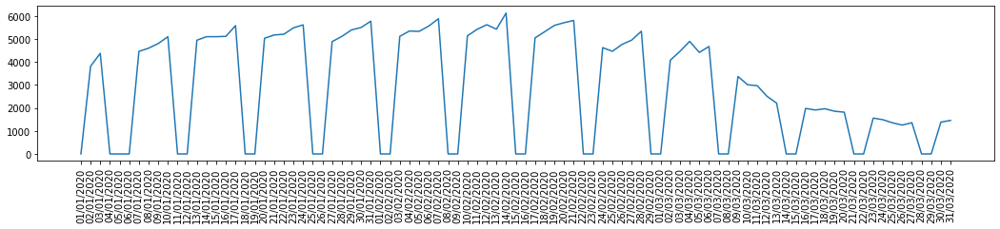

SP 28 tra Piacenza (Tangenziale Sud) e Gossolengo


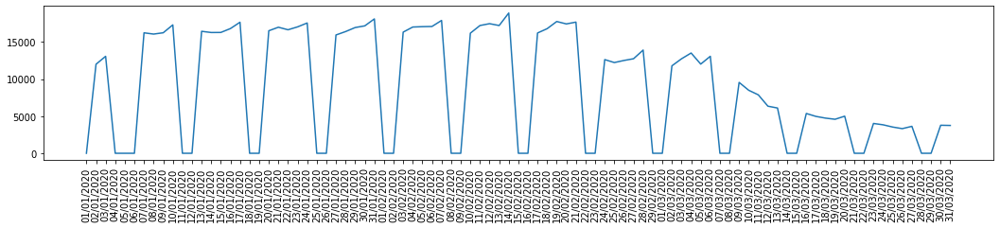

SP 28 tra Reggio Emilia (Tangenziale) e Cavriago


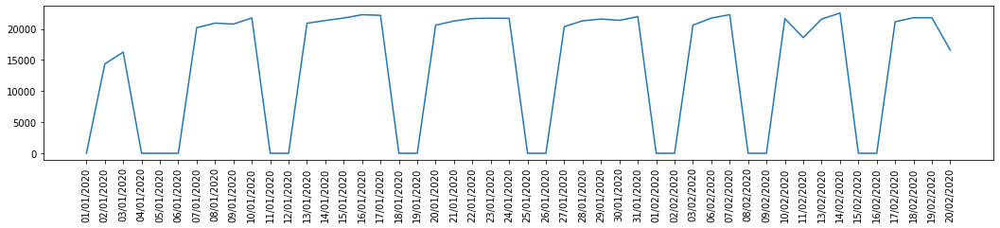

SP 3 sulla variante tra Bagnolo in Piano e il casello A 1 di Reggio Emilia


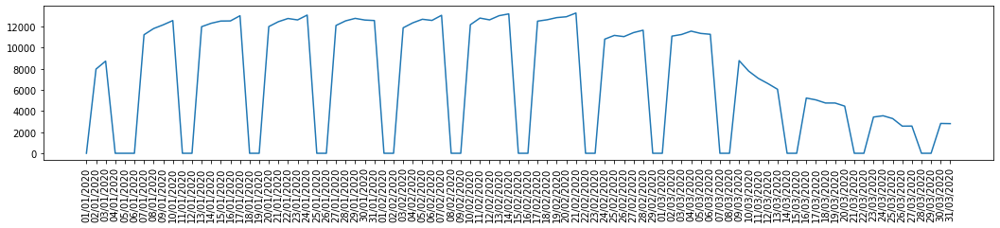

SP 3 tra San Lorenzo in Noceto e Predappio


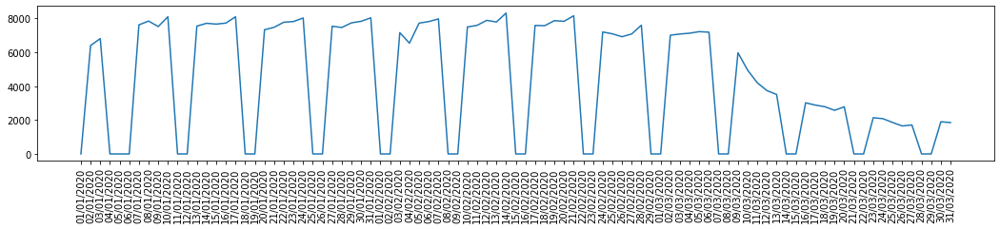

SP 3 tra via Monda e via Caminate


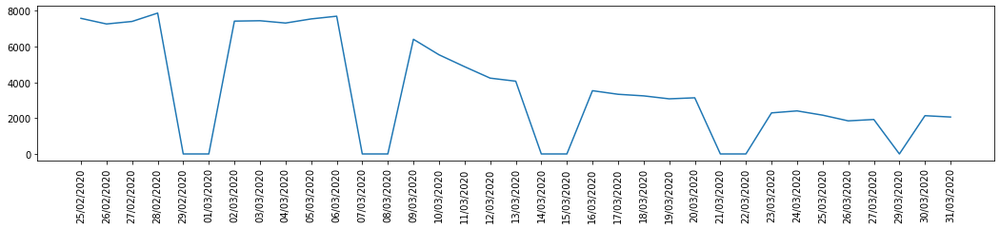

SP 30 tra Campagnola Emilia e il confine provinciale


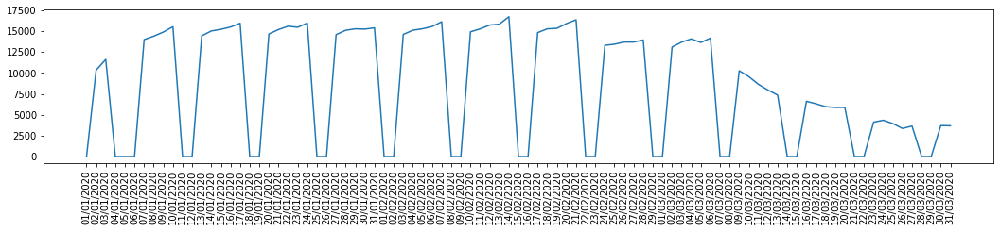

SP 302R tra Brisighella e Marradi


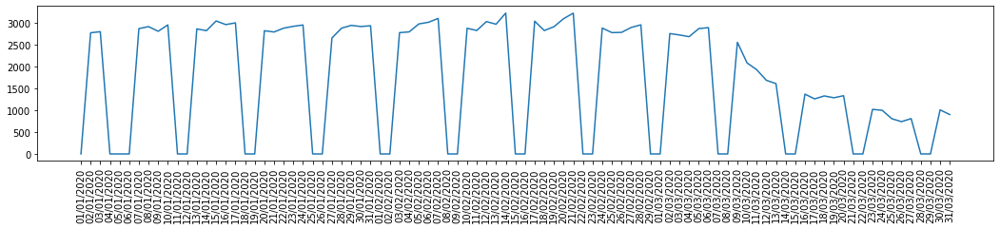

SP 302R tra Faenza (bivio SP 66) e Brisighella


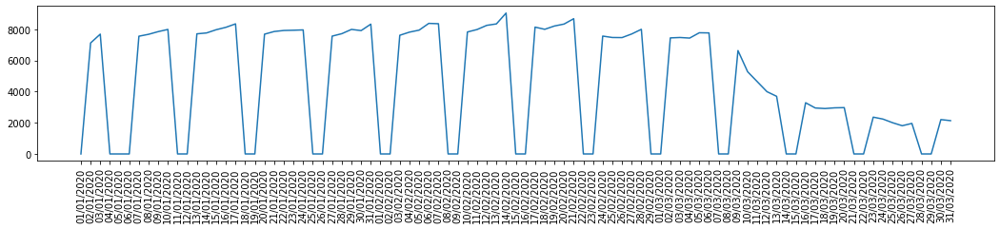

SP 302R tra Faenza e il bivio SP 4 (a sud di Russi)


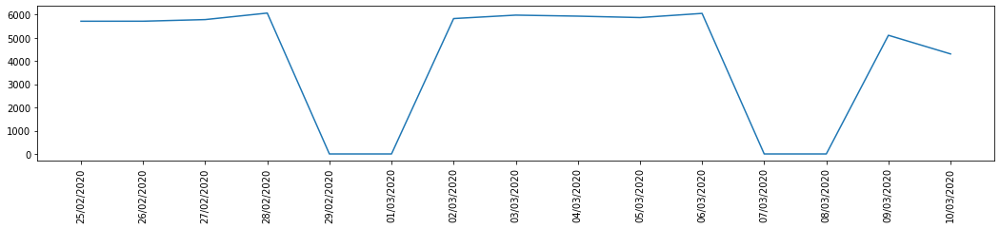

SP 306R fra Casola Valsenio e bivio SP 65 c/o località Isola


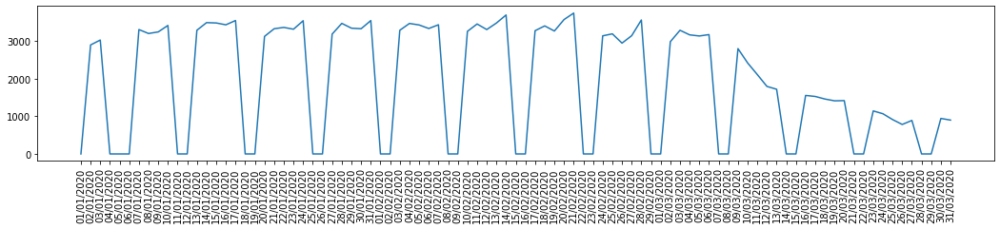

SP 306R fra Castel Bolognese e Riolo Terme


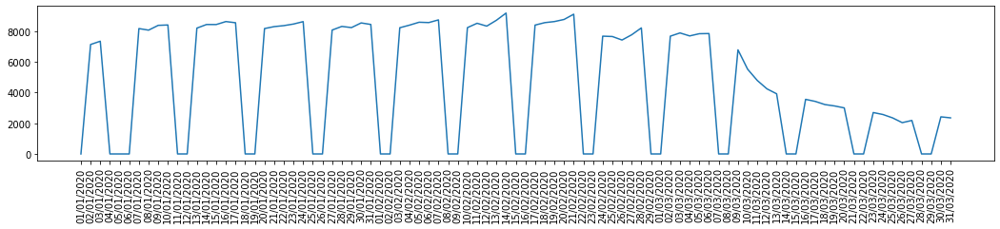

SP 31 dal bivio SP 28 per Castenaso a Ponte Rizzoli


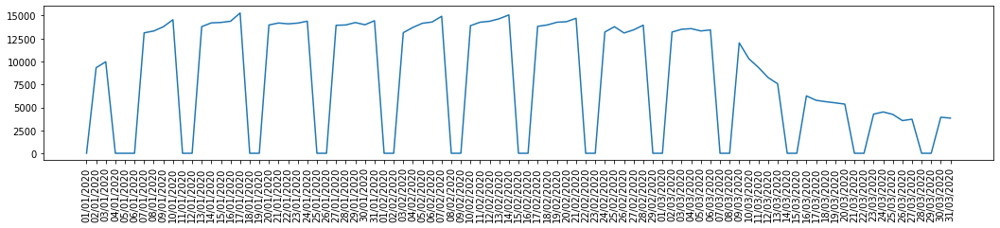

SP 31 fra bivio SP 12 in località Castelnuovo Fogliani e il confine provinciale


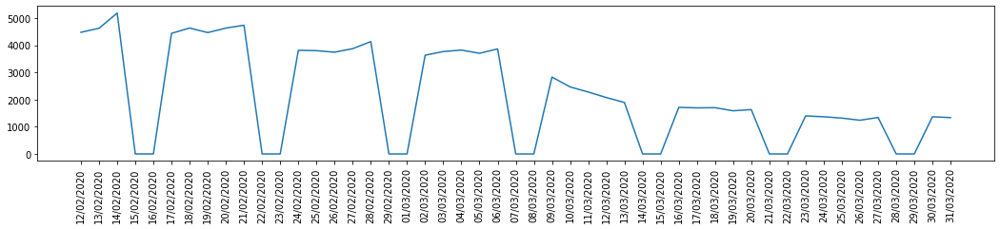

SP 31 tra Viadotto A 14 e Coriano


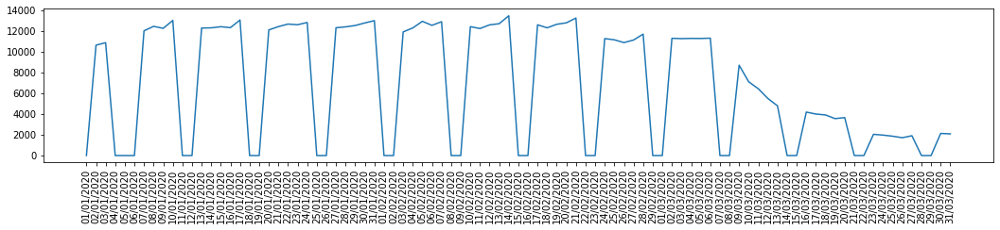

SP 32 dal bivio SP 16 (per Langhirano) al bivio SP 665R


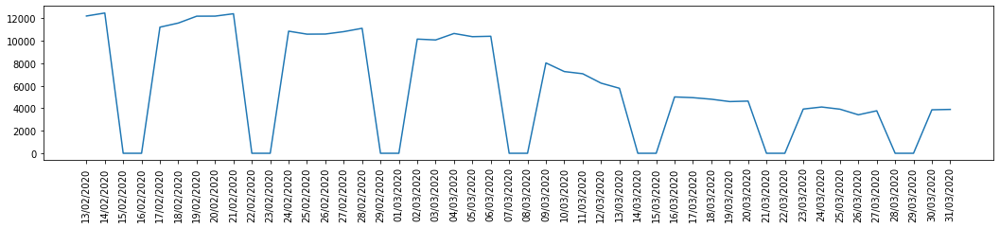

SP 324 da Silla alla intersezione SP 623


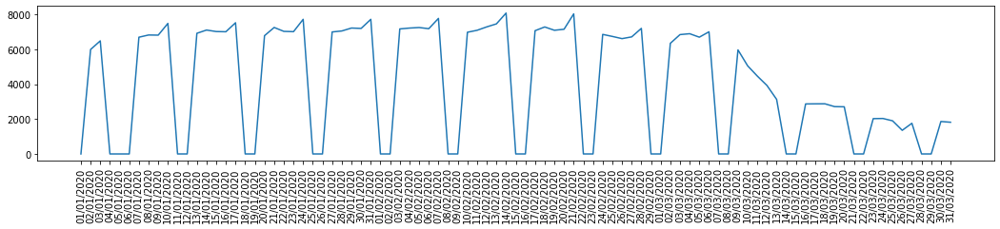

SP 325 tra Casello A 1 (Sasso Marconi) e Vado


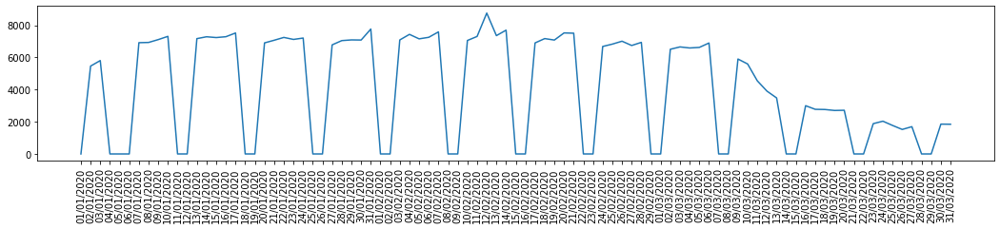

SP 33 in località Gatteo


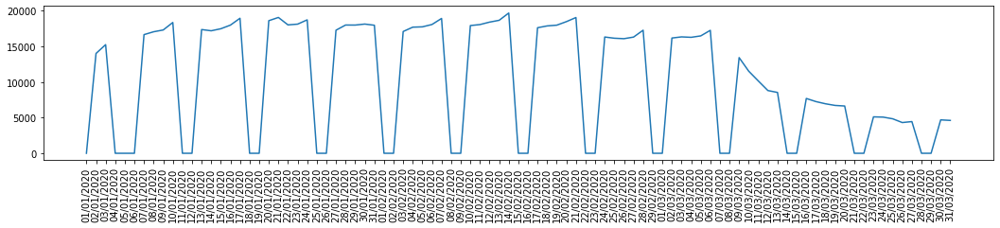

SP 34 da Colorno al bivio SP 60 (al confine provinciale)


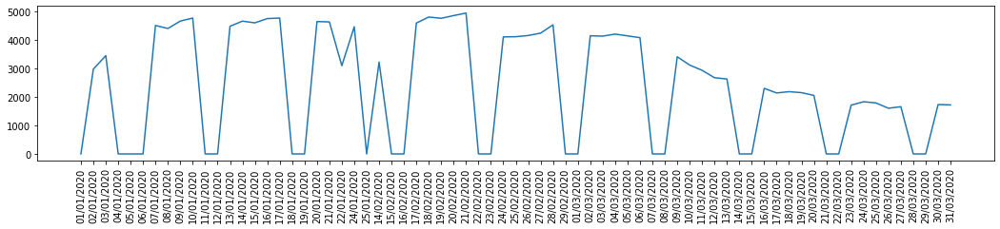

SP 343R tra Colorno e Casalmaggiore


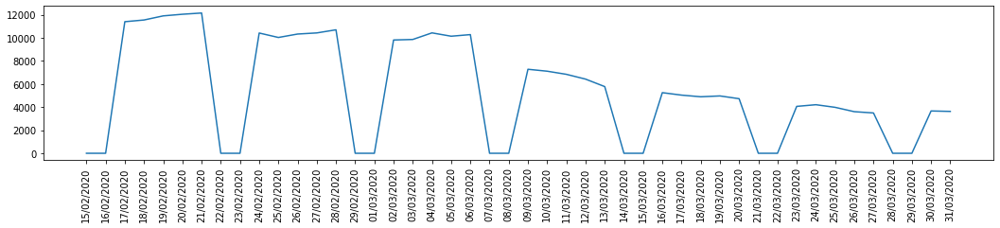

SP 343R tra Parma e San Polo


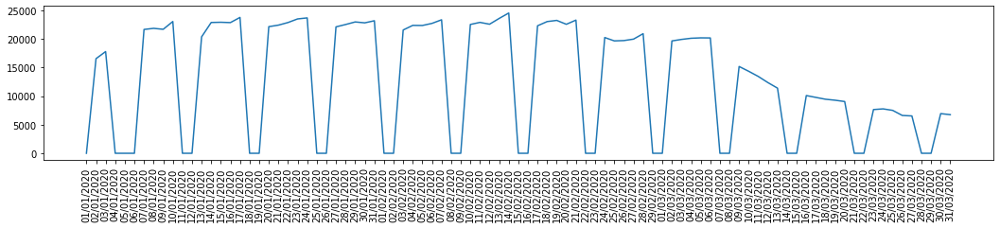

SP 35 sul Ponte Po


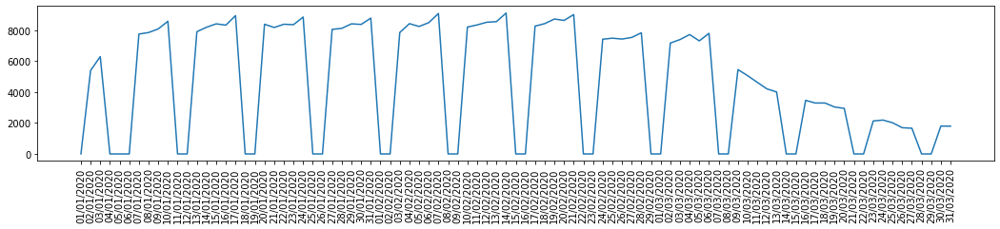

SP 35 tra bivio SP 50 (località Cella) e Sant'Andrea in Casale


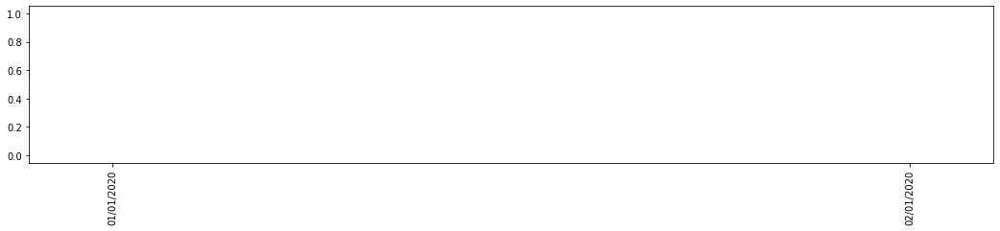

SP 357R da Fornovo di Taro al bivio SP 93 per Fidenza


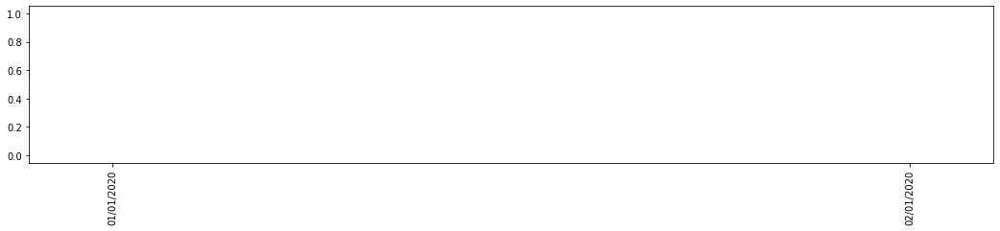

SP 357R tra SS 9 e Noceto


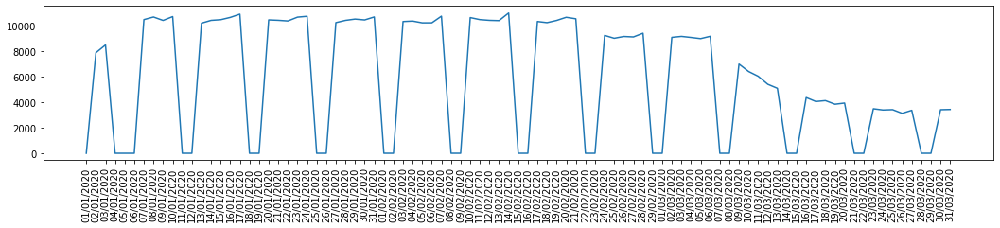

SP 359R tra Fidenza e Salsomaggiore Terme


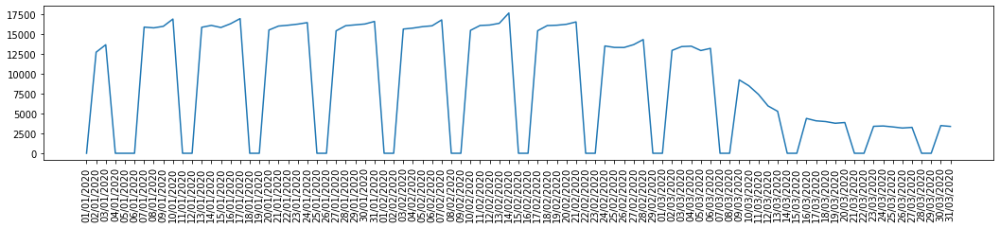

SP 37 da Sasso Marconi alla intersezione SP 58


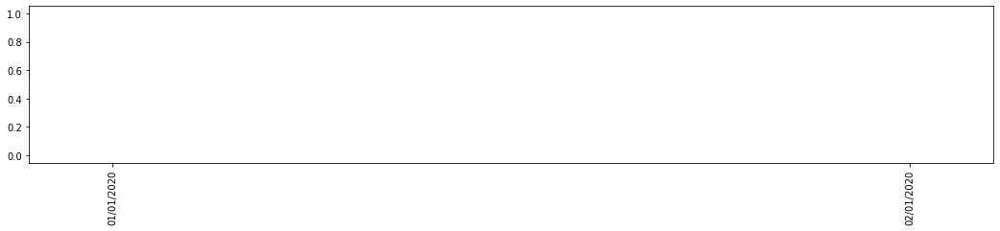

SP 37 fra Albinea e Scandiano (bivio SP 7)


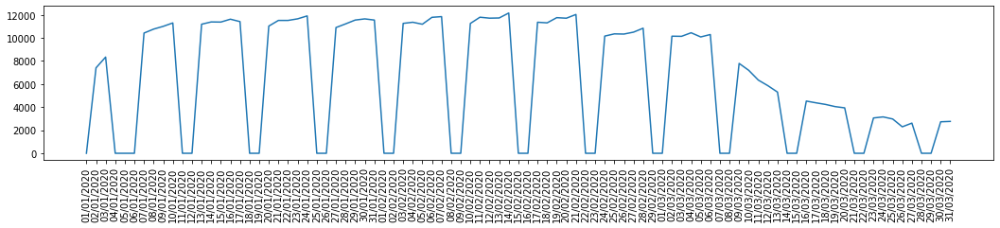

SP 37Bis dalla località Selbagnone al bivio SP 72 (Meldola)


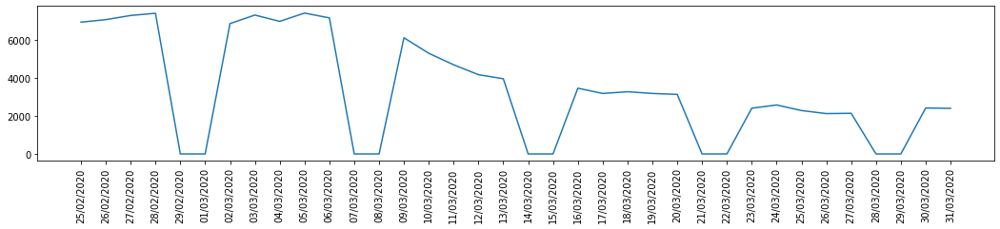

SP 3_2 tra Budrio e bivio SP 29 per Medicina


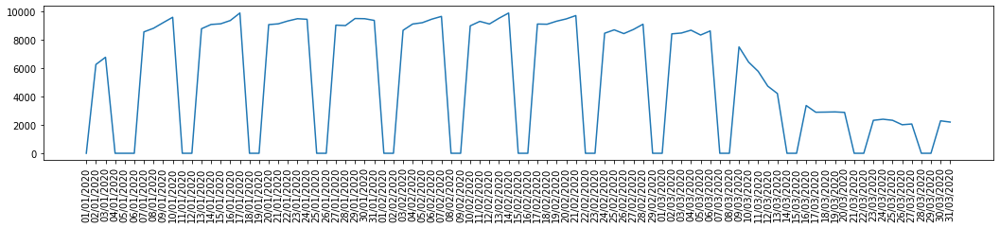

SP 3_2 tra intersezione SP 5 e ponte torrente Idice


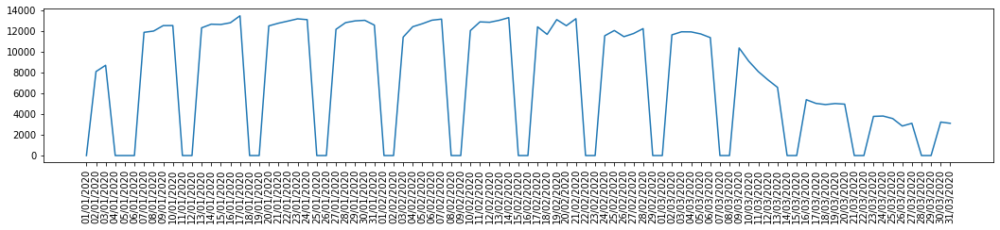

SP 4 tra Galeata e Santa Sofia


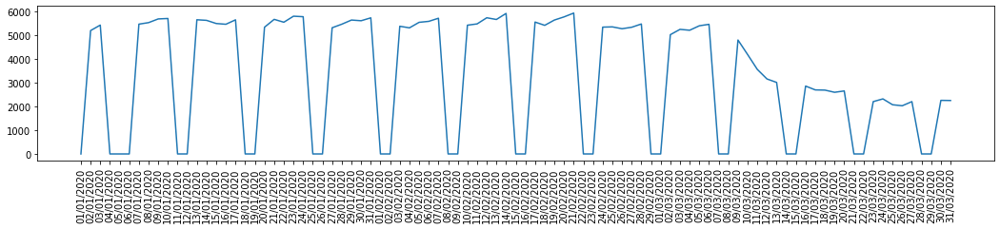

SP 4 tra Ronco (SS9) e bivio SP 72 (Para)


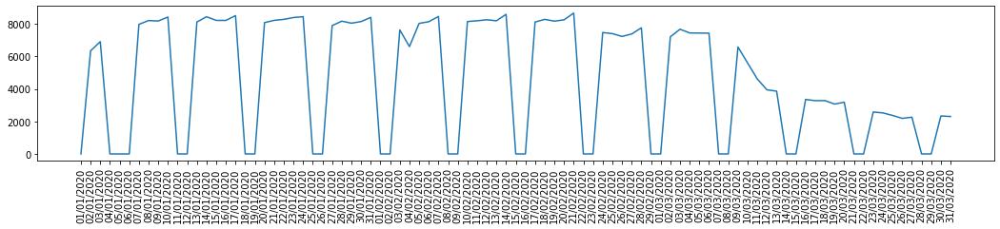

SP 4 tra San Giorgio di Piano e Intersezione SP 11 c/o San Pietro in Casale


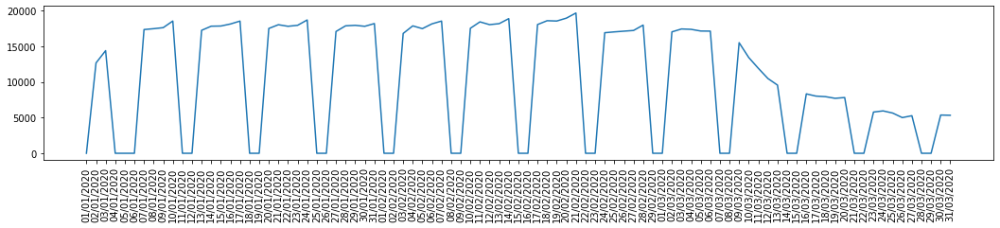

SP 4 tra San Pietro in Casale e San Vincenzo/San Venanzio


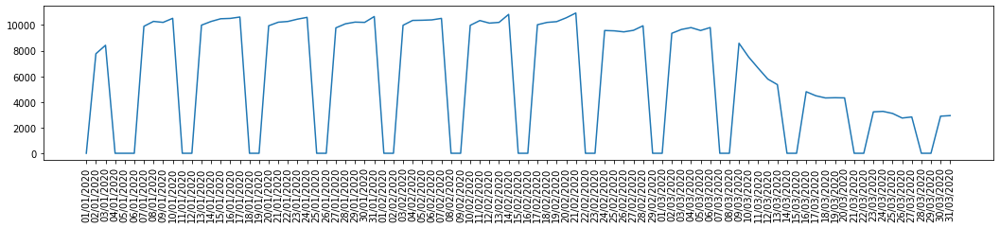

SP 41 tra Rimini (viadotto A 14) e bivio SP 49 (località Ospedaletto)


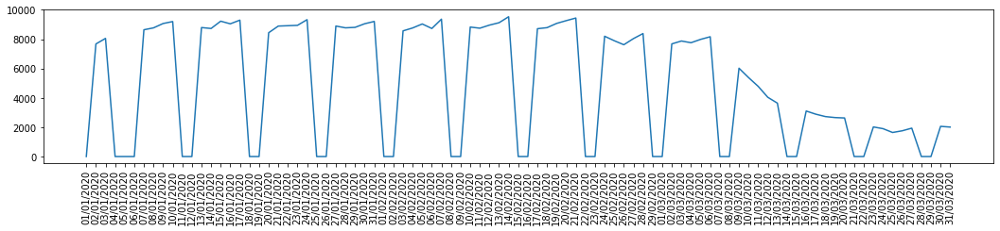

SP 412R fra Pianello Val Tidone e Borgonovo Val Tidone


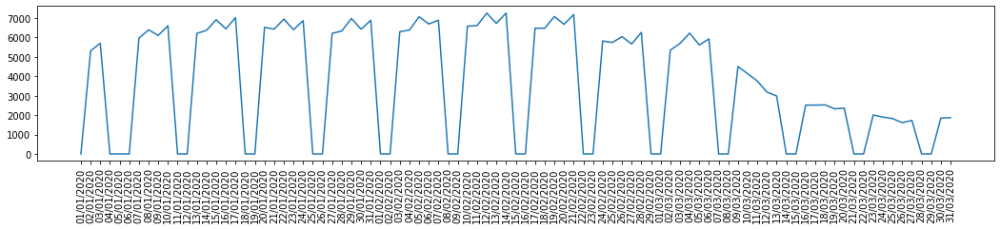

SP 412R tra Castel San Giovanni (Casello A 21) e ponte fiume Po


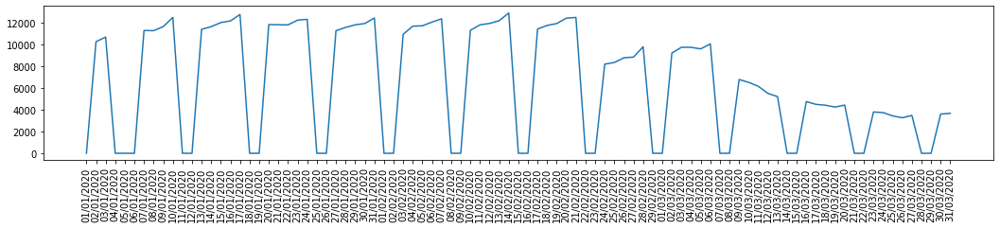

SP 413 tra Modena e Ganaceto


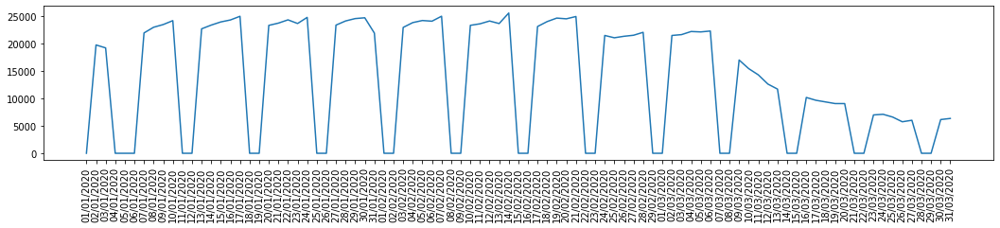

SP 42 fra Novellara e San Giacomo (SP 62R)


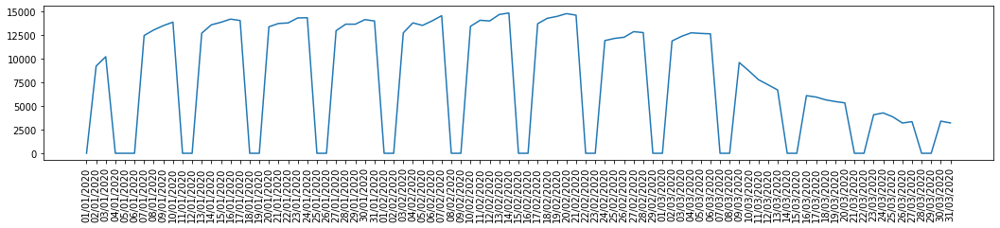

SP 42 fra Pieve di Cento e Castello d'Argile


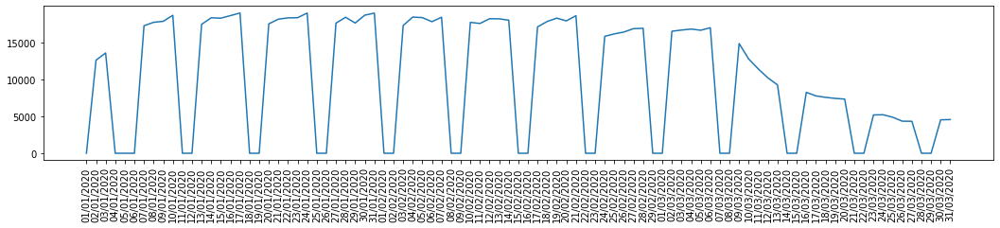

SP 42 fra Podenzano e bivio SP 6/ponte fiume Nure in località San Giorgio Piacentino


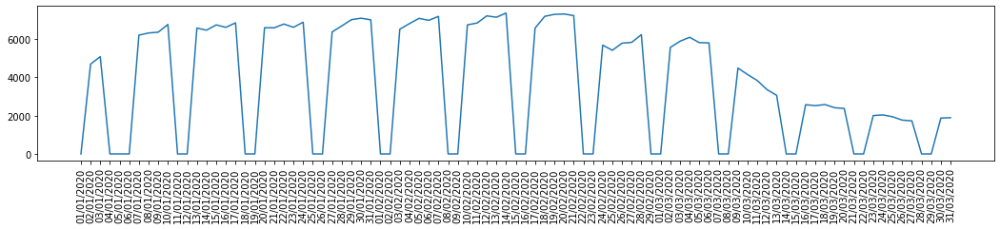

SP 43 tra Trecasali (bivio SP 8) e Torrile


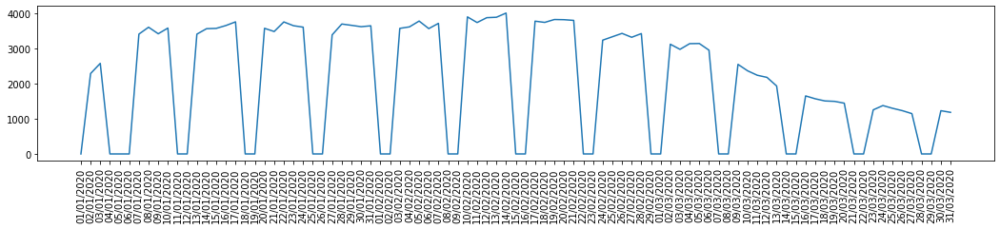

SP 462R dal bivio SP 10R in località Monticelli a Cortemaggiore


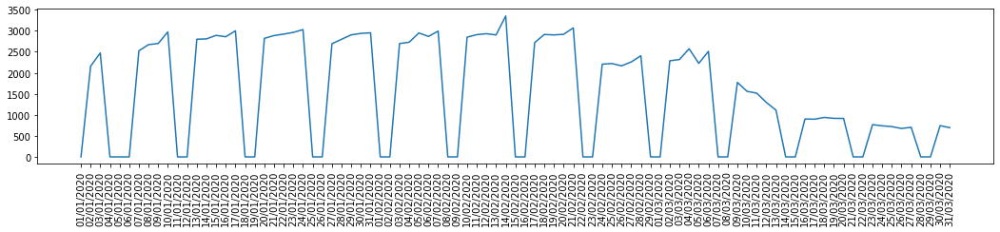

SP 462R fra Fiorenzuola d'Arda e Cortemaggiore


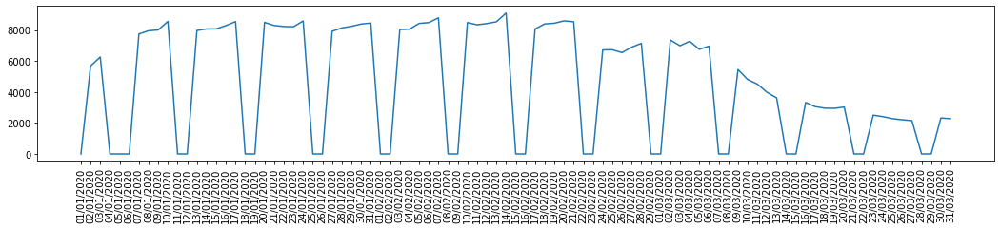

SP 467 fra SP 3 e SS 12


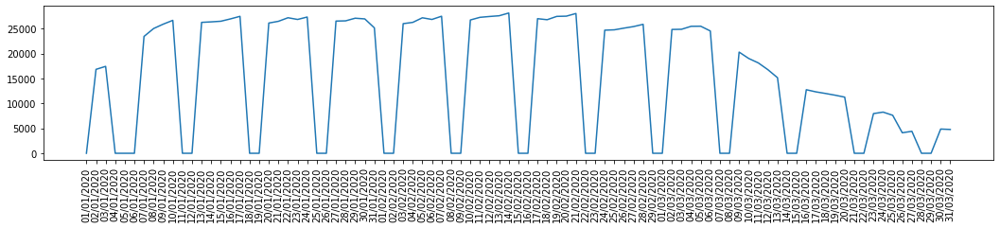

SP 467 tra SP 486 e confine provinciale


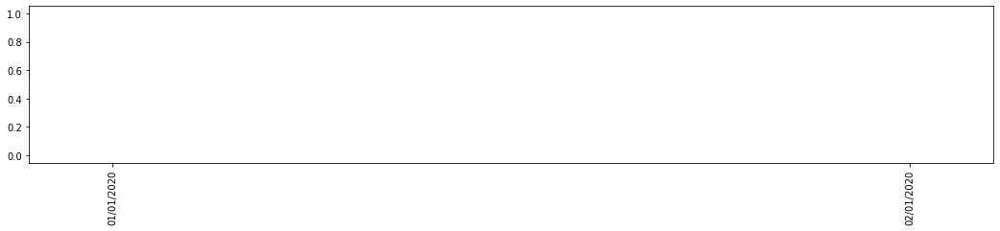

SP 467R tra Fogliano e località Pratissolo (c/o Scandiano)


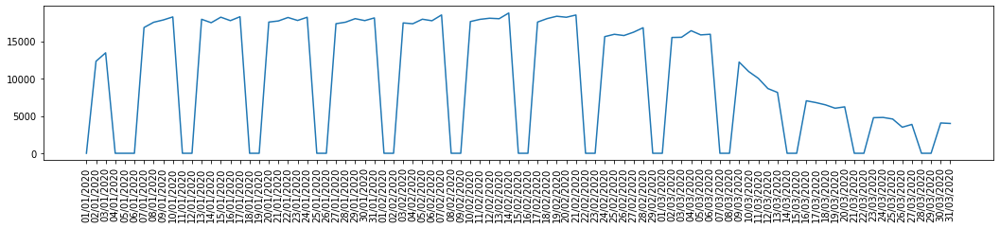

SP 468 tra Casumaro e Reno Centese


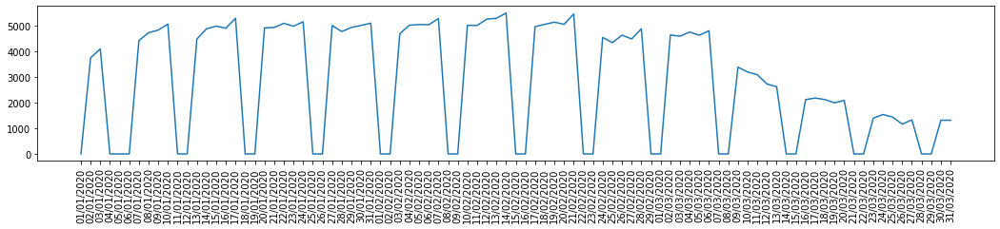

SP 468R tra Correggio e il confine provinciale


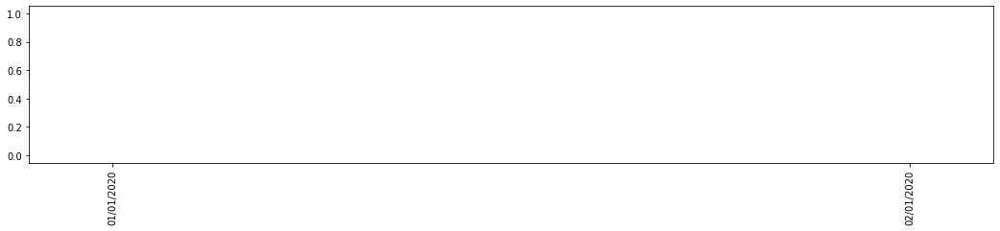

SP 486 tra Modena e Baggiovara


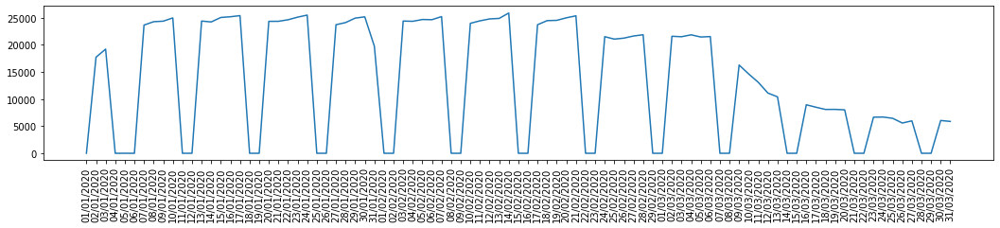

SP 486R fra Sassuolo e Castellarano


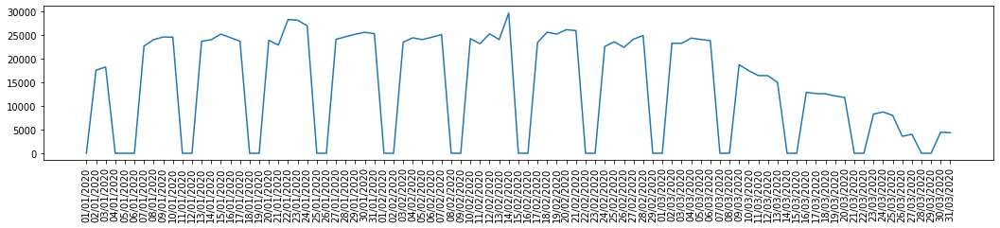

SP 49 da Santarcangelo di Romagna alla località Posta (bivio SP 258R)


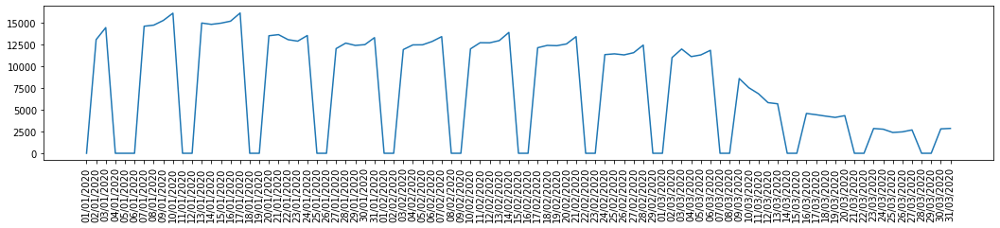

SP 5 dall'intersezione SP 3 a intersezione per Ca' de Fabbri


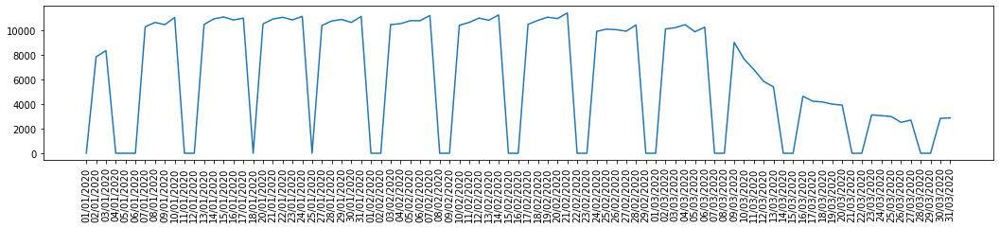

SP 5 fra Reggiolo e intersezione SP 45 per Fabbrico


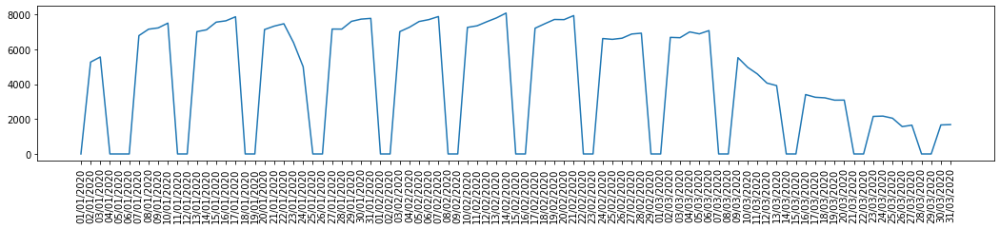

SP 5 fra Russi e San Pancrazio


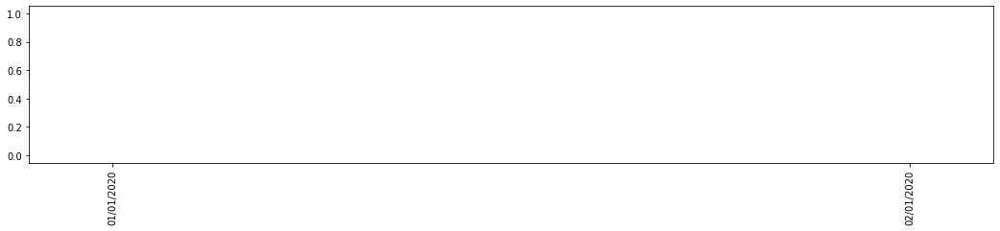

SP 51 fra Sassuolo (bivio SP 467R) e Rubiera


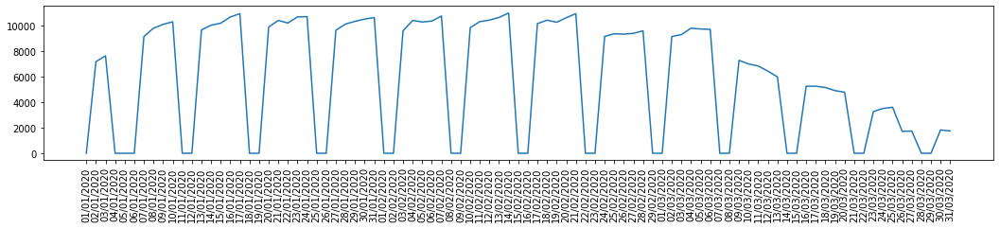

SP 513R a nord di Vetto


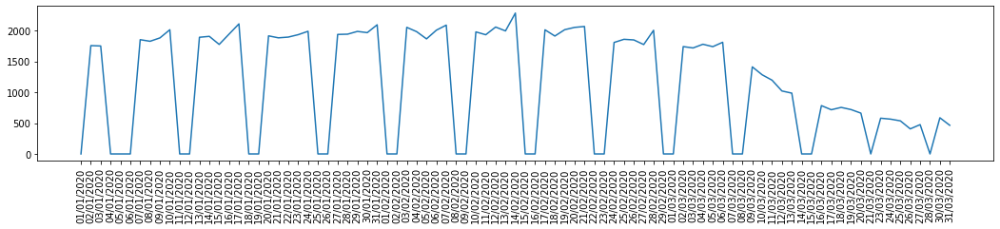

SP 513R fra Traversetolo e confine provinciale


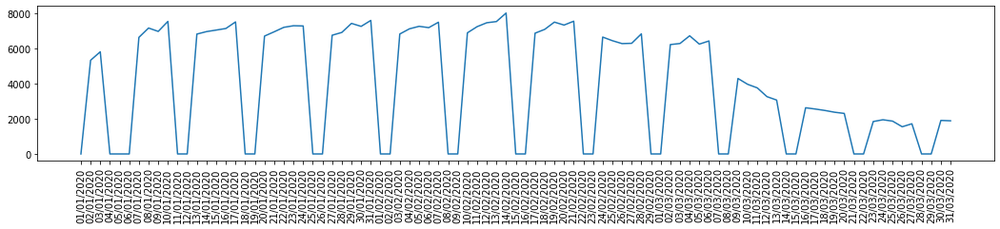

SP 513R tra Parma e Pilastrello


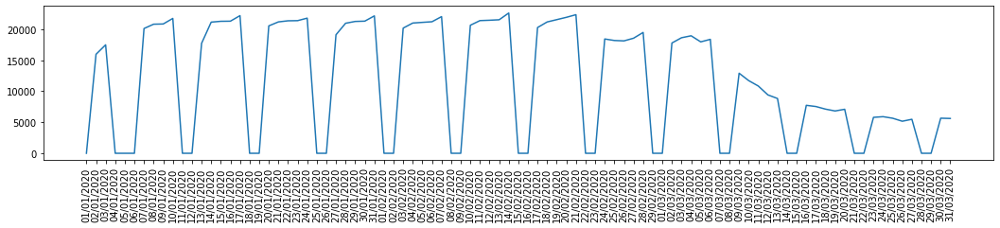

SP 523R da Roccamurata (bivio SP 308R) a Borgo Val di Taro


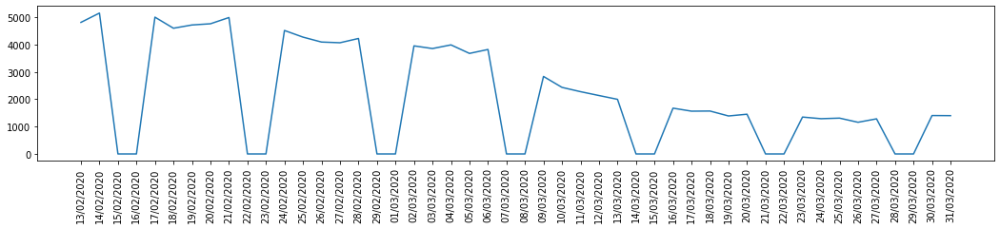

SP 53 fra Codigoro e Marozzo


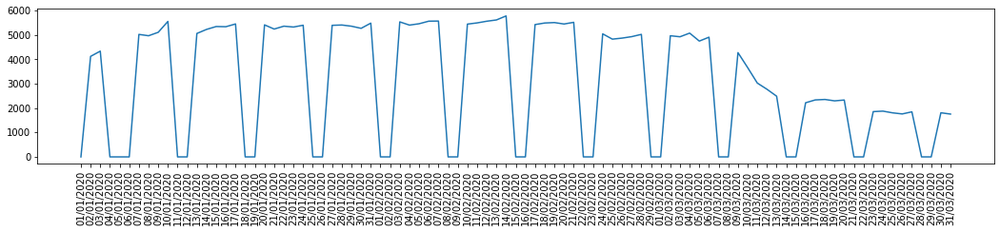

SP 54 fra Pomposa e Codigoro


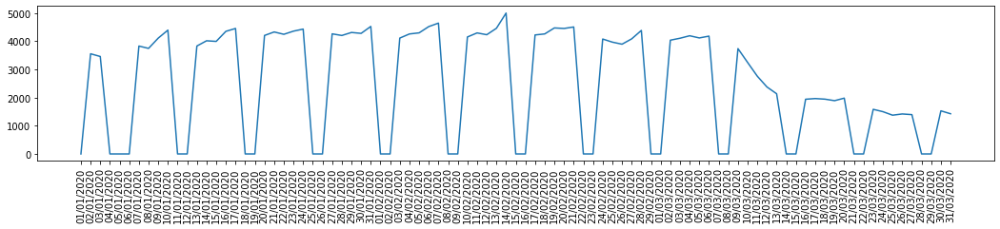

SP 56 tra Forlì e bivio SS67 (Castrocaro Terme)


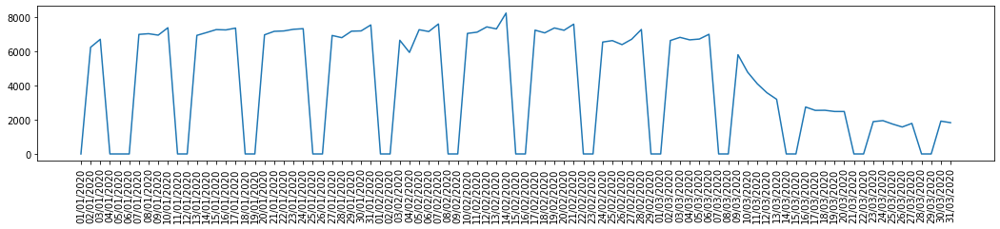

SP 569 da intersezione Pedemontana a Savignano sul Panaro


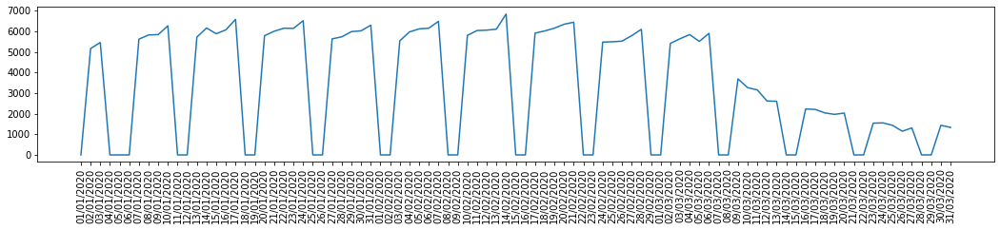

SP 569 tra Innesto tangenziale Bologna e uscita Zola Predosa (Gesso/Rivabella)


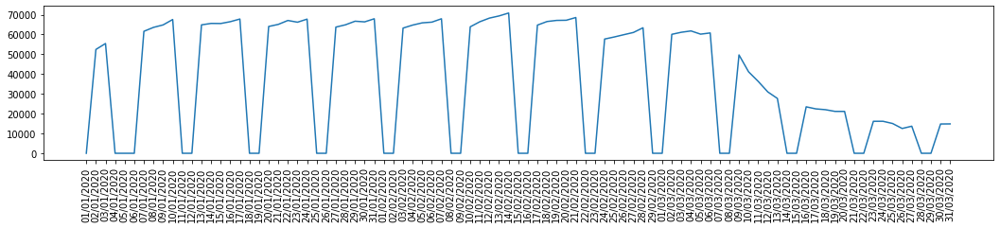

SP 569 tra Pragatto e innesto variante Ponte Ronca


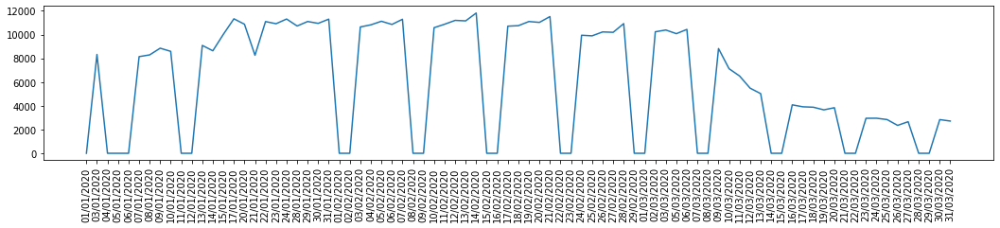

SP 58 tra San Giovanni in Marignano e il confine regionale (Marche)


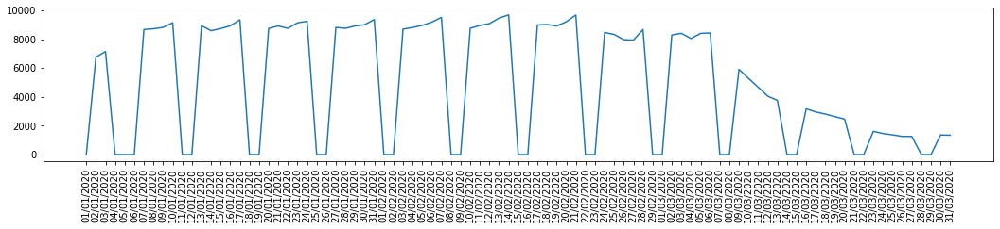

SP 587R dal bivio SP 10R alla A 21Dir


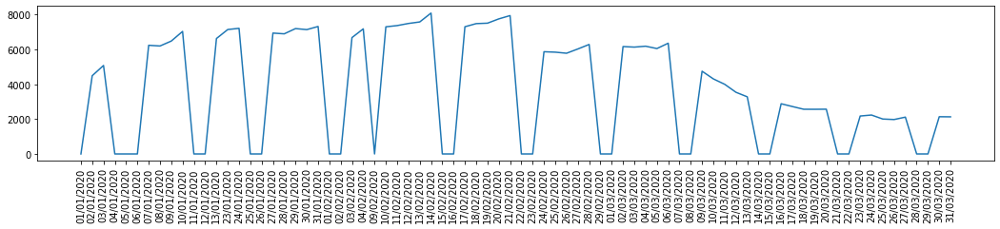

SP 588R da Castione Marchesi (A 1) a Busseto


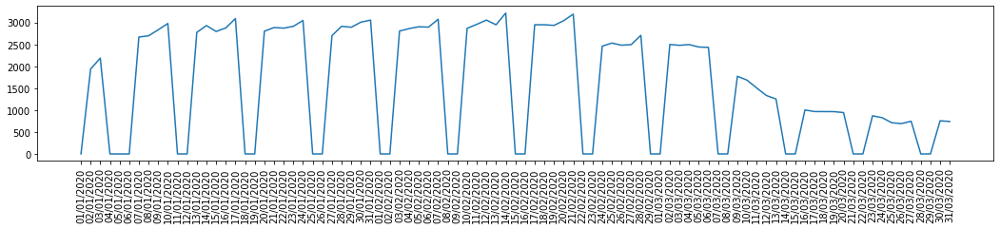

SP 588R dal casello A 21 di Castelvetro Piacentino a Villanova d'Arda


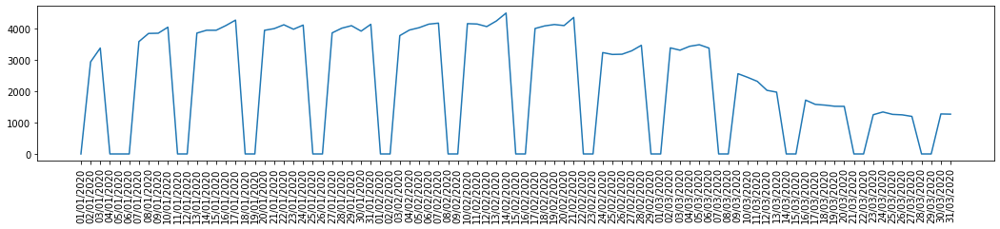

SP 588R fra Villanova d’Arda e confine provinciale


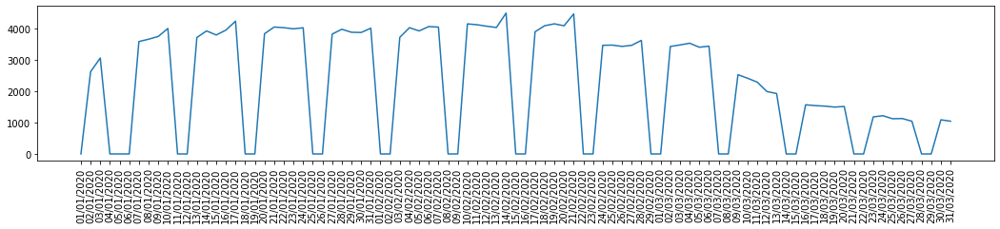

SP 6 fra Cento e Pilastrello


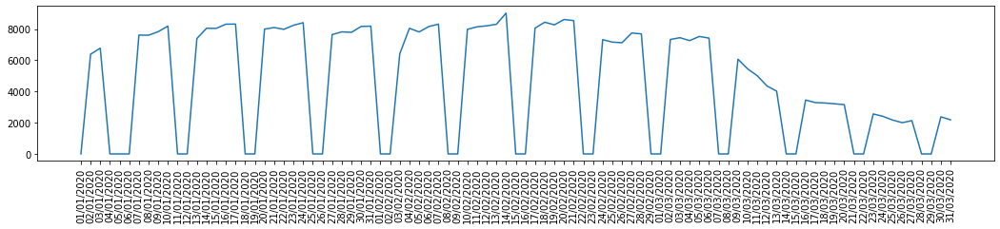

SP 6 tra Budrio e San Martino in Argine


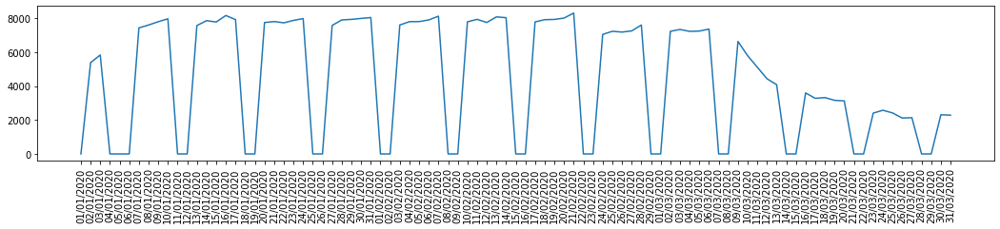

SP 6 tra Budrio e bivio SP 253


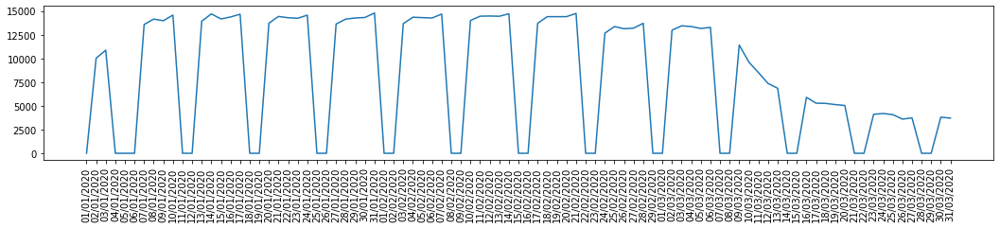

SP 6 tra Piacenza (Tangenziale Sud) e bivio SP 42/ponte fiume Nure in località San Giorgio Piacentino


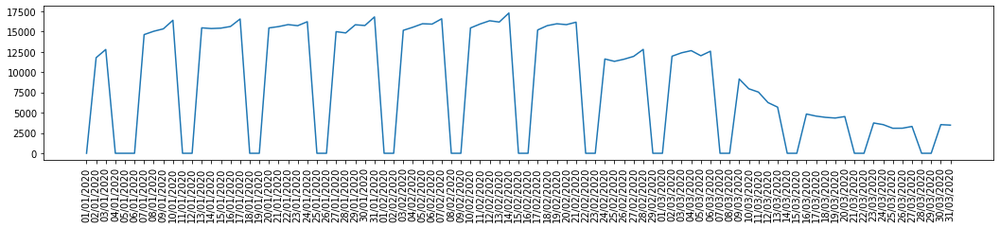

SP 60 tra intersezione SP 68 e SP62


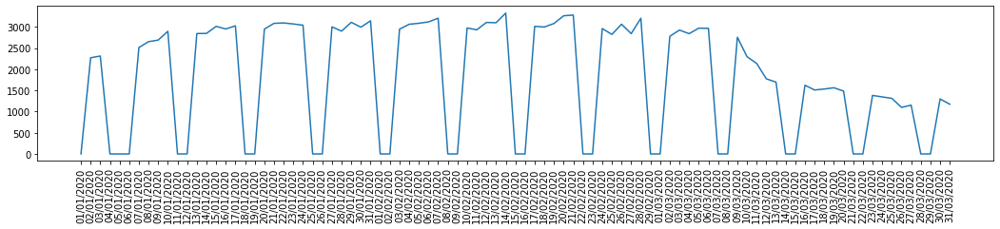

SP 610 tra Imola e Casalfiumanese in località Ca' Miseria


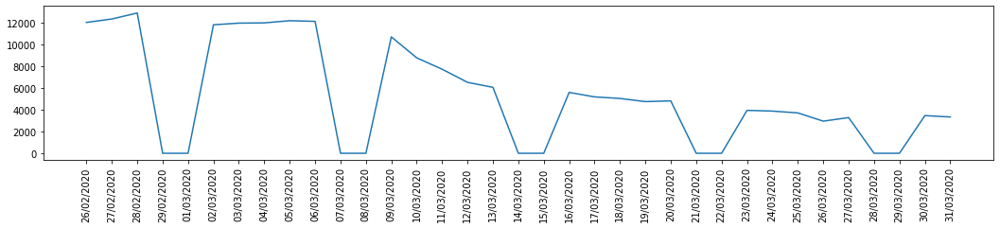

SP 610 tra casello A 1 (Imola) e bivio SP 51 per Castel Guelfo di Bologna


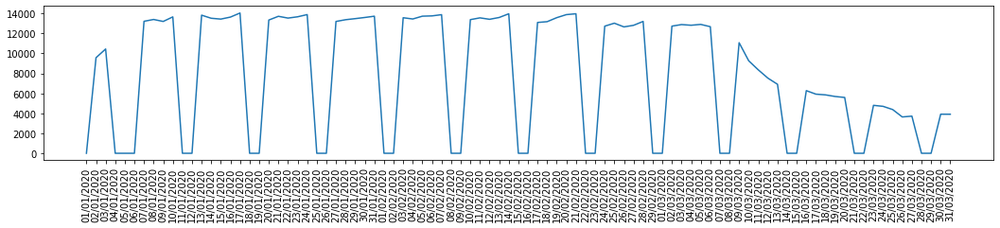

SP 610R fra SP 253R e Conselice


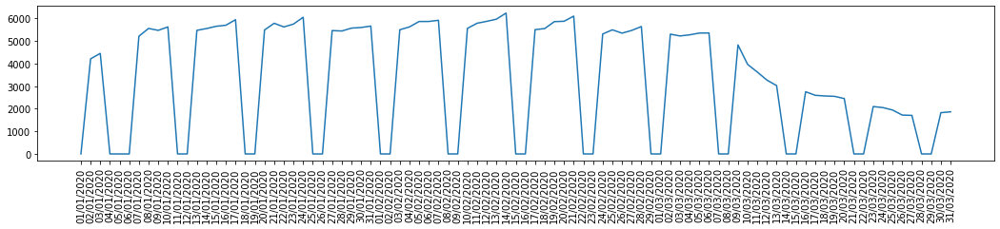

SP 623 tra Modena Sud/casello A 1 e Spilamberto


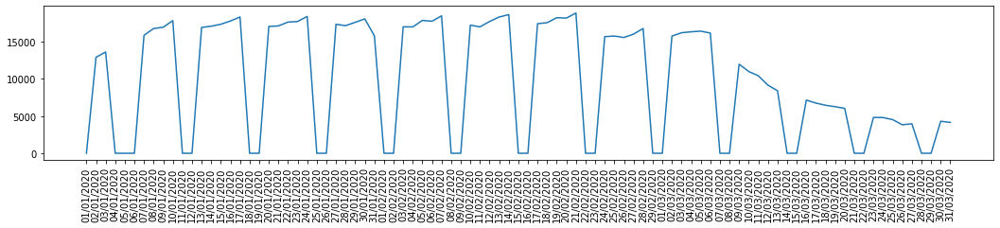

SP 62R tra Brescello (bivio SP 41) e Sorbolo (bivio SP 20)


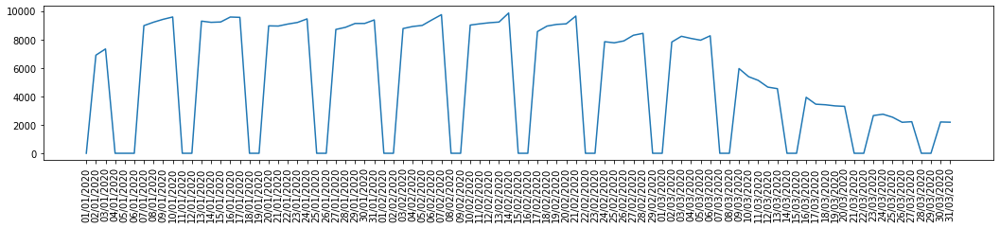

SP 62R tra Parma (viadotto A 1) e Sorbolo


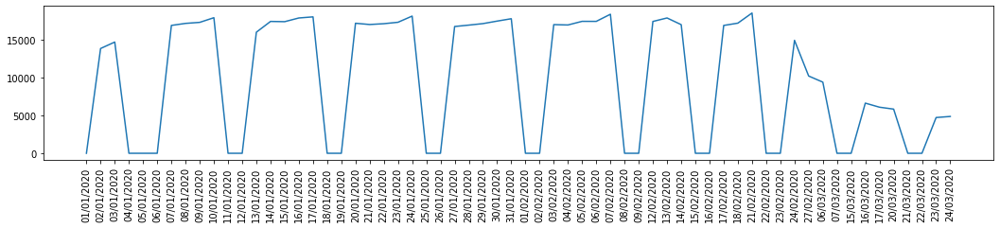

SP 62RVar Cispadana da Boretto (bivio Variante SP 358R) a Gualtieri (bivio SP 63R)


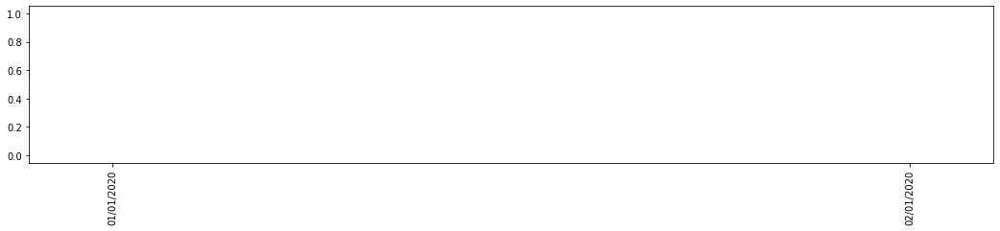

SP 62RVar sulla variante di Luzzara (c/o Codisotto)


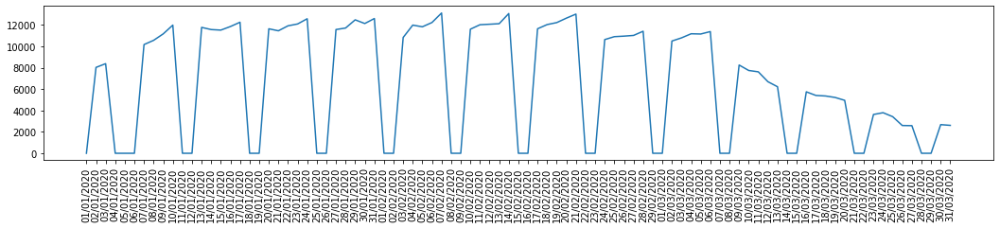

SP 62RVar tra la località San Giacomo (bivio SP 42) ed SP 2 (c/o Tagliata)


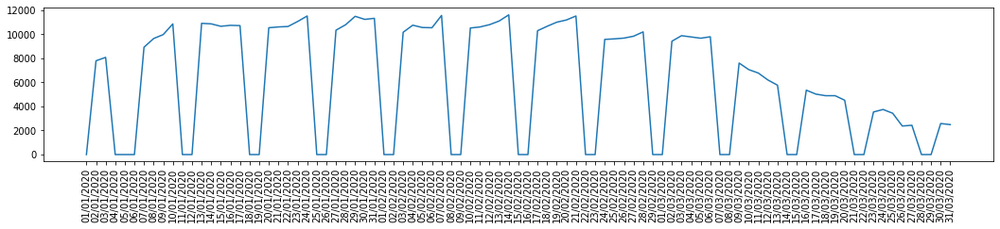

SP 63R tra Sesso e Cadelbosco di Sopra (bivio SP 358R)


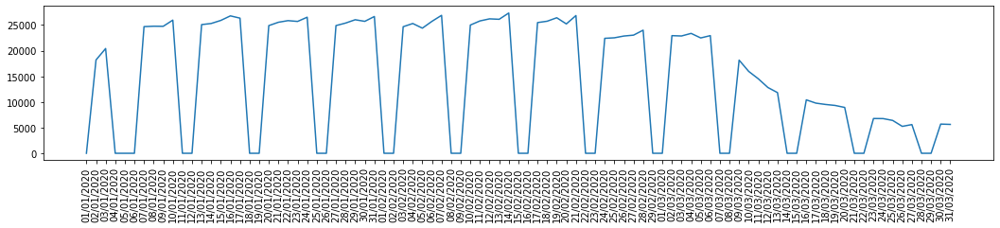

SP 654R fra Ponte dell'Olio e Bettola


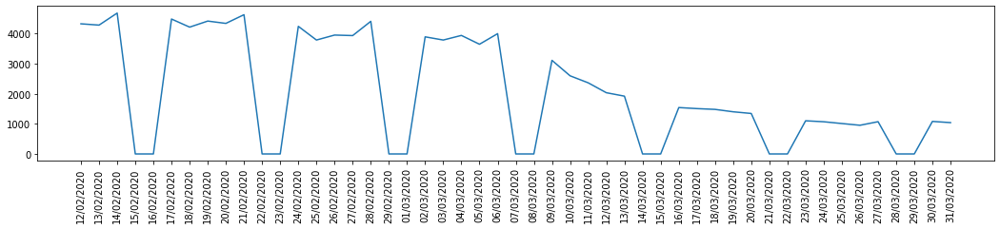

SP 654R tra Piacenza (Tangenziale Sud) e Turro


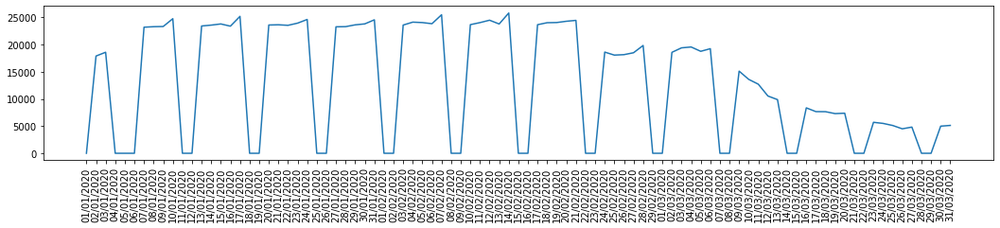

SP 66 fra Cento e Sant'Agostino


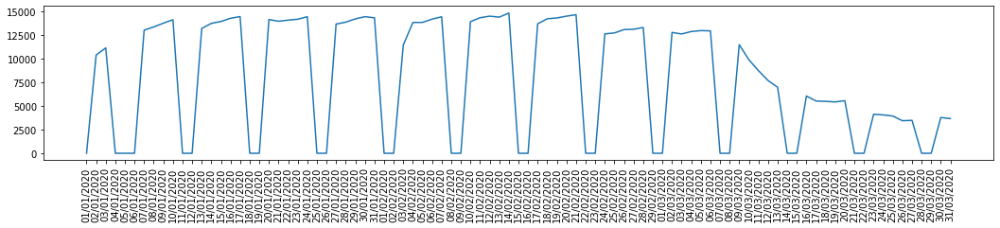

SP 665R dalla località Pilastro a Langhirano


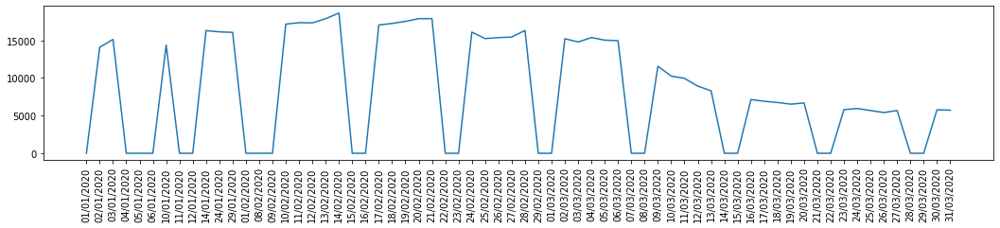

SP 665R tra Parma e Corcagnano


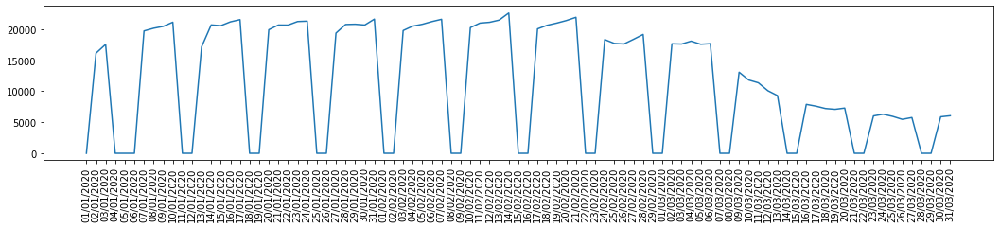

SP 67 fra Calerno e Montecchio Emilia


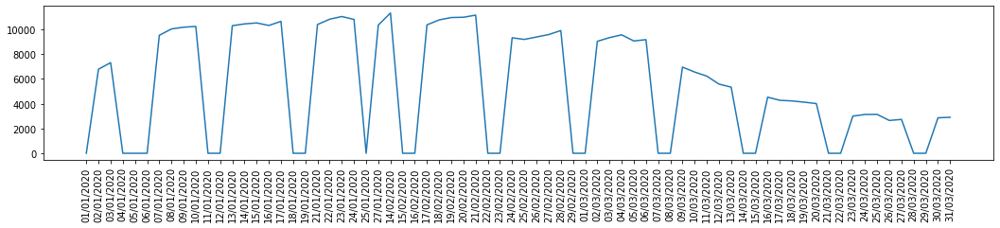

SP 68 ad Ariano Polesine al Confine regionale (Veneto)


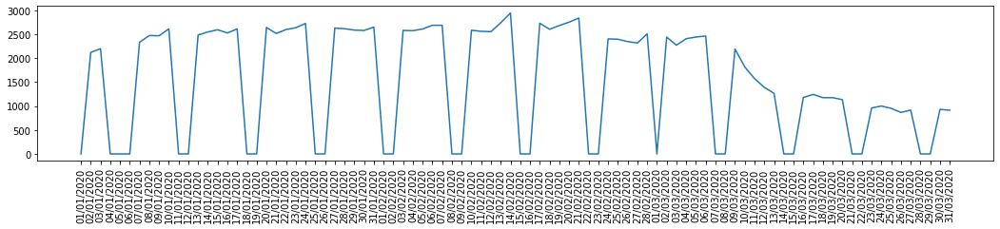

SP 68 tra Portomaggiore e la Superstrada Ferrara-Mare


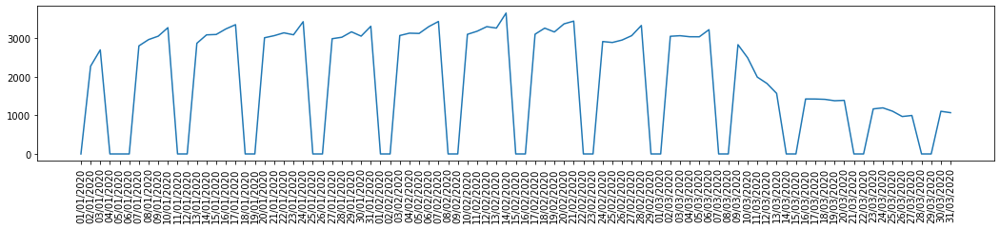

SP 69 in località Pilastri al Confine regionale


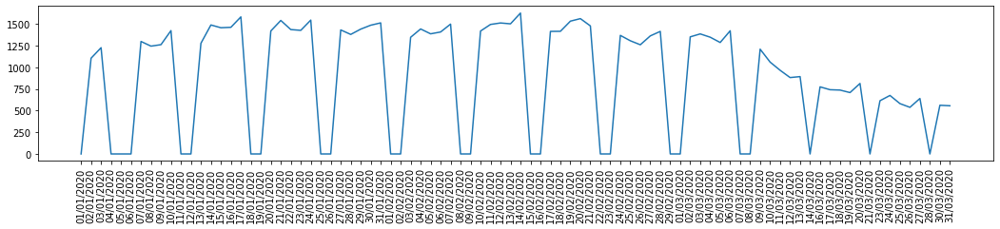

SP 6Bis fra Carpaneto e Castell'Arquato


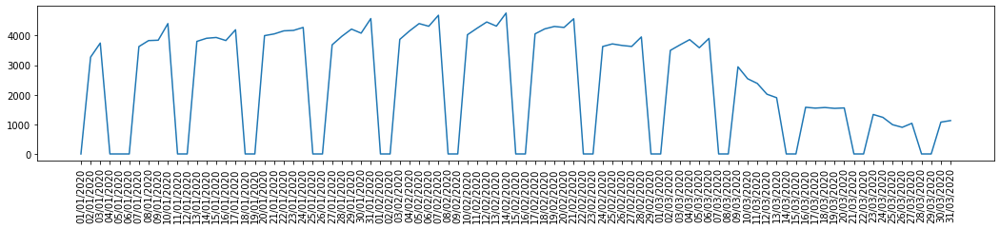

SP 7 dalla intersezione tangenziale sud/ovest di Piacenza a San Nicolò


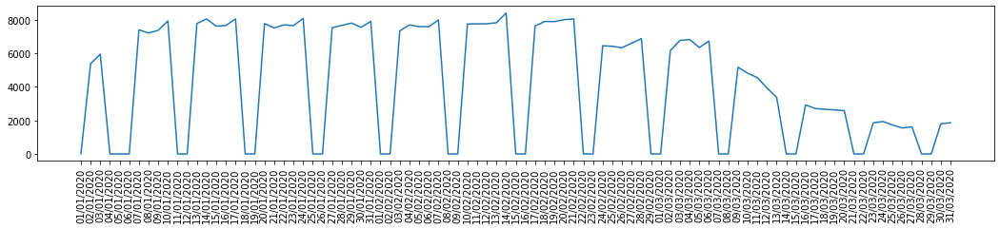

SP 7 dalla località Ca de' Mandorli al bivio per Castel de Britti


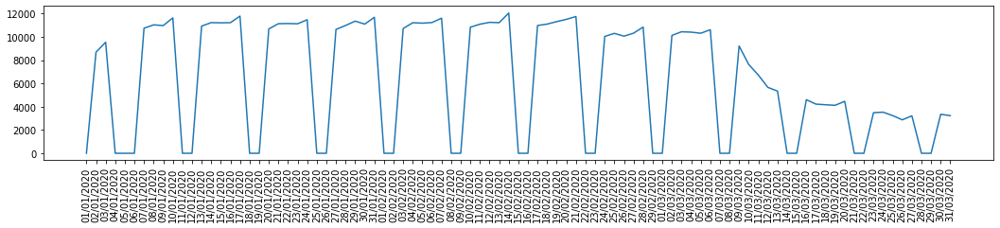

SP 7 fra Viano e Scandiano (bivio SP 37)


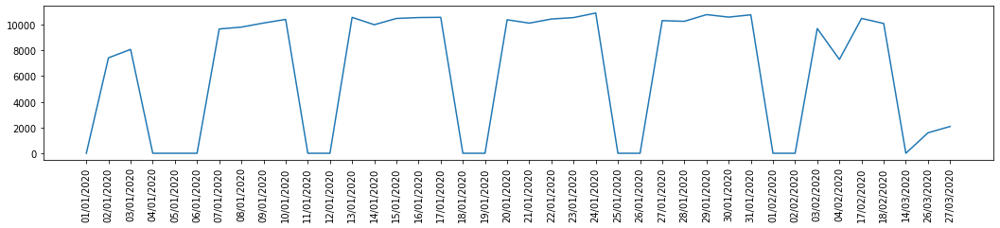

SP 7 in località Calabrina al Confine Provinciale


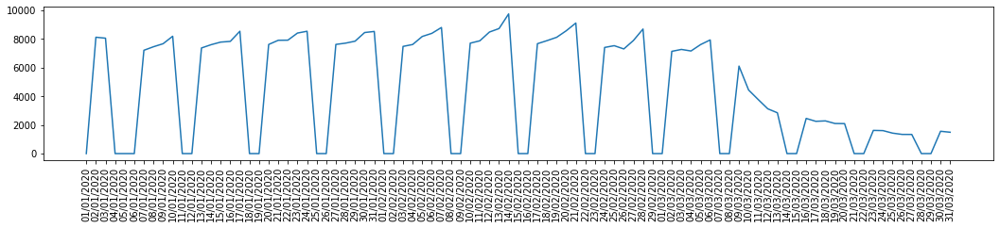

SP 70 Cispadana in località Sant'Agostino/San Carlo


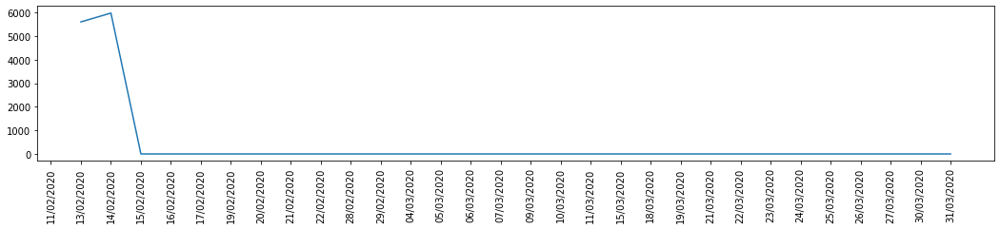

SP 72 tra Parma e Mezzani


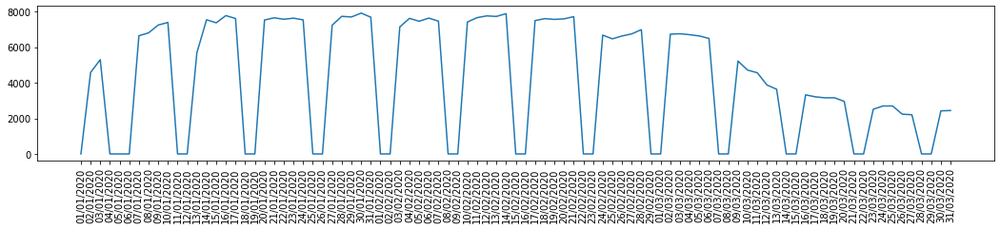

SP 72 tra San Martino in Strada e bivio ex SS 310R (Meldola)


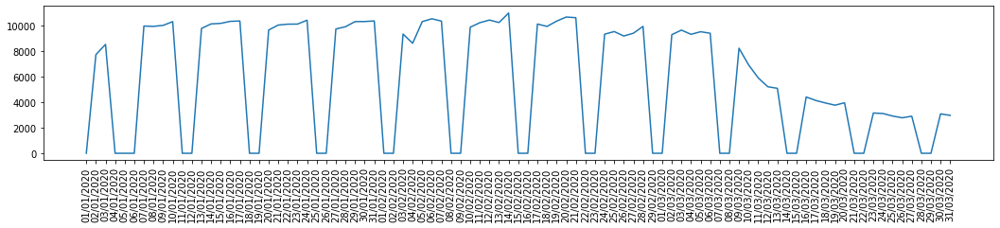

SP 78_1 tra Bazzano e Intersezione SP 27 a Monteveglio


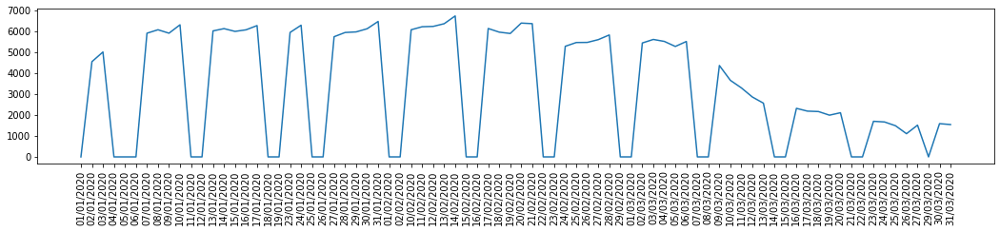

SP 7IBisR dal bivio SSPP 32/33ter alla SS 16


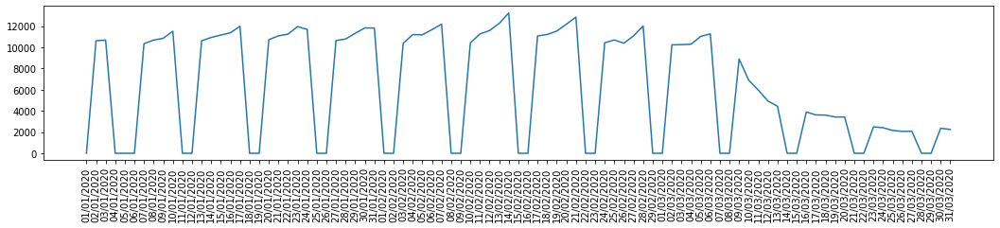

SP 8 da Bagnacavallo al bivio SS 16


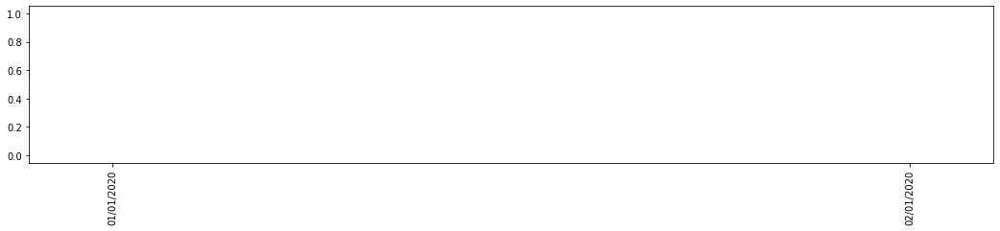

SP 8 dal Casello A 1 (Faenza) a Cotignola


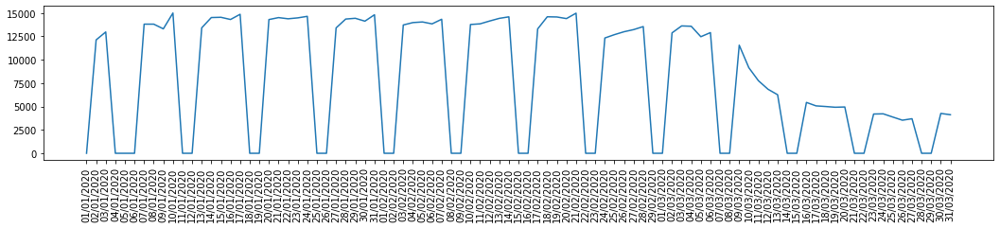

SP 8 tra Cesena e A 14


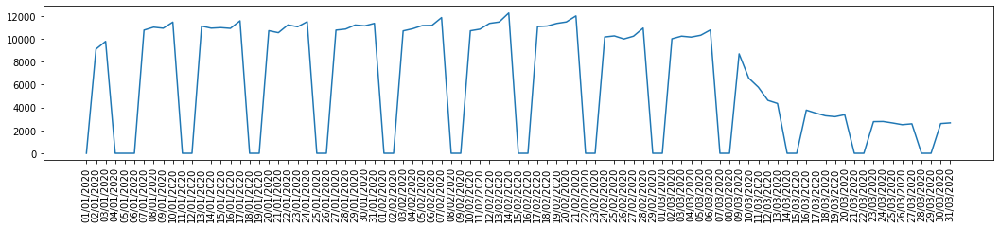

SP 85 tra Rubiera e bivio SP 13MO (c/o Campogalliano)


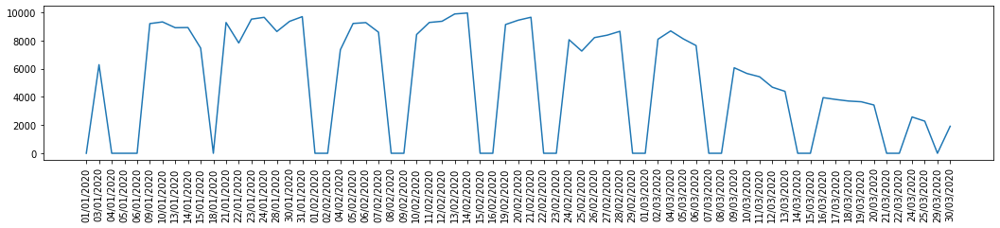

SP 9 fra Colorno e Torrile centro abitato di Bezze


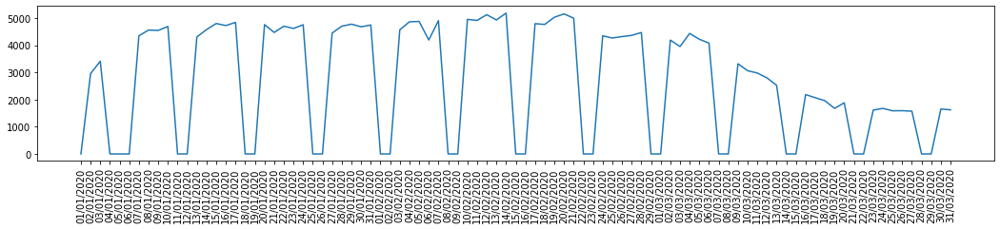

SP 9_1 da Crevalcore alla località Caselle


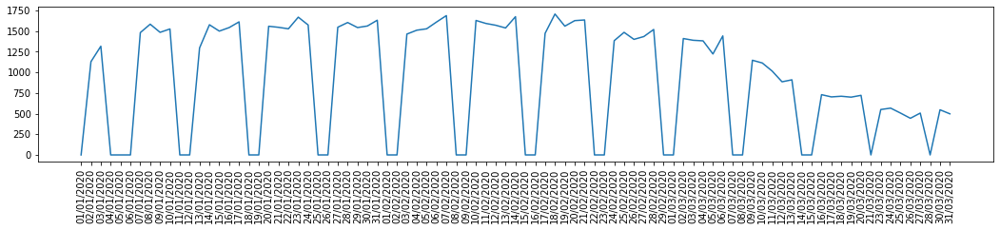

SS 12 a Medolla


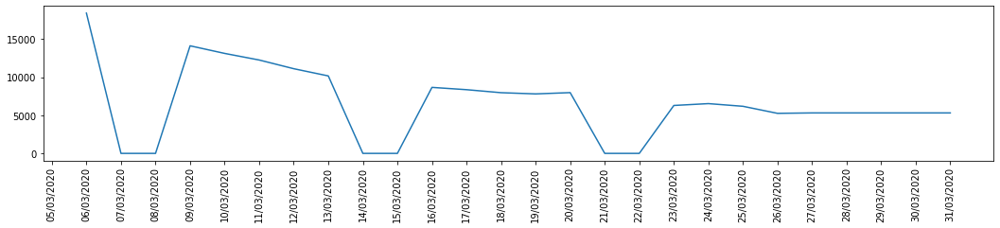

SS 12 tra Fiumalbo e Abetone


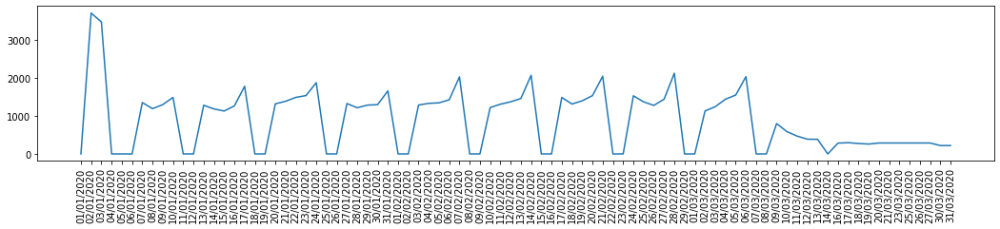

SS 12 tra Modena e Bastiglia


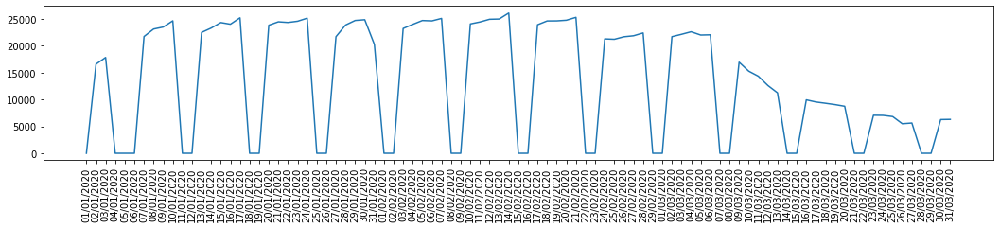

SS 12 tra Montale e Modena


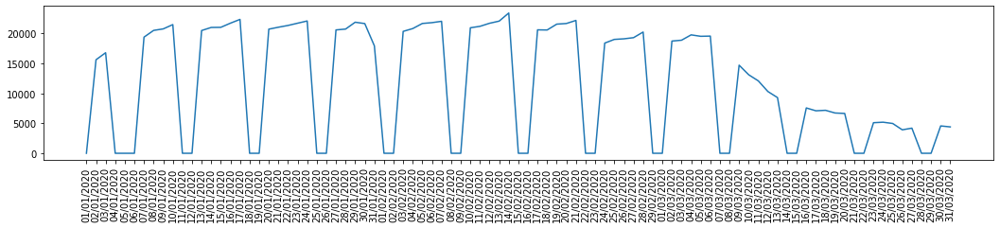

SS 12 tra Pavullo e intersezione SP 31


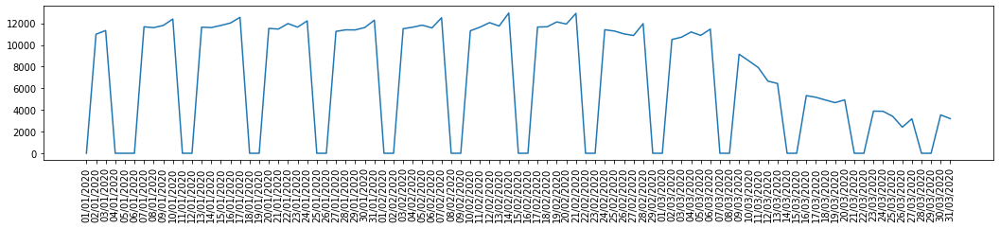

SS 16 al Confine regionale (Marche)


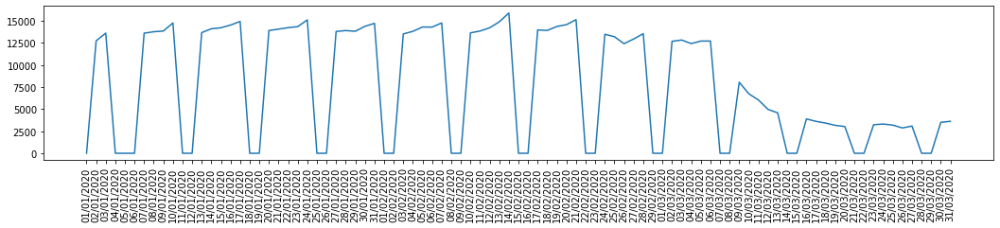

SS 16 dal bivio SP 610R ad Argenta


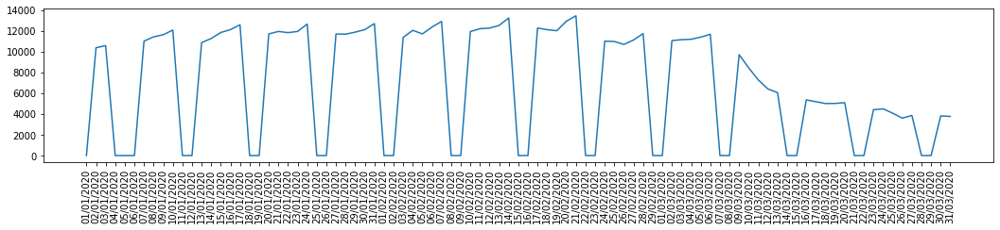

SS 16 tra Cervia e Cesenatico


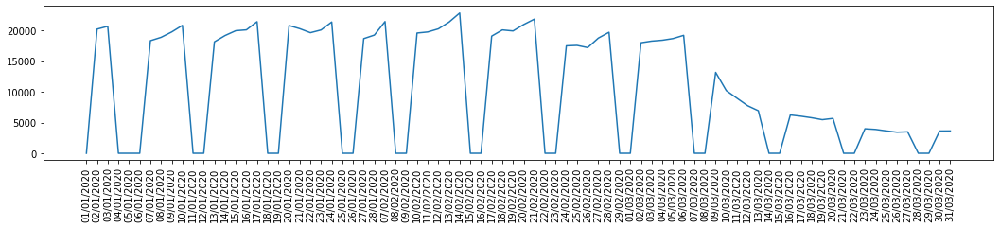

SS 16 tra Riccione e Rimini


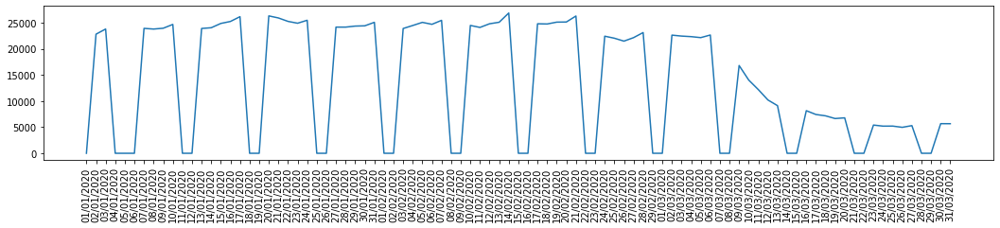

SS 16 tra Rimini e Igea Marina-Viserba


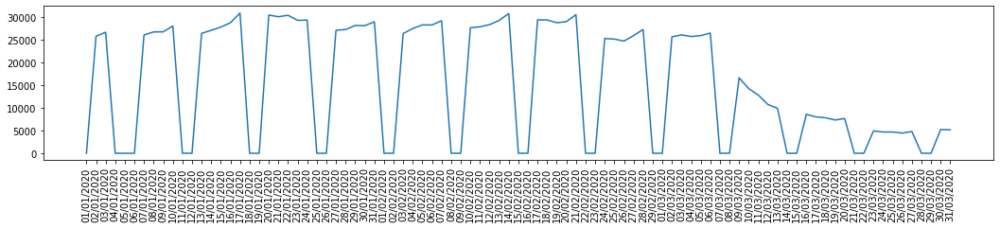

SS 16 tra la tangenziale di Ravenna e la località Camerlona


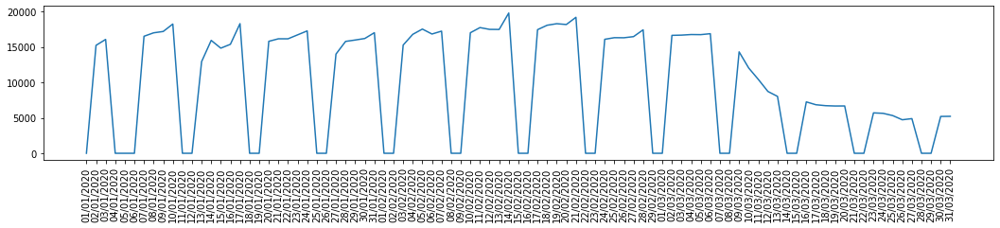

SS 309 a San Giuseppe di Comacchio


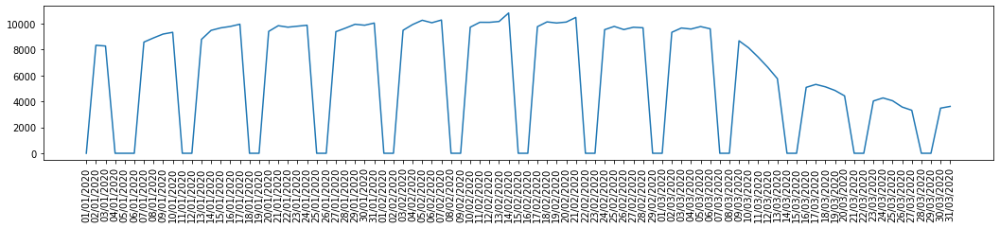

SS 309 presso bivio con SS 309Dir (tangenziale di Ravenna)


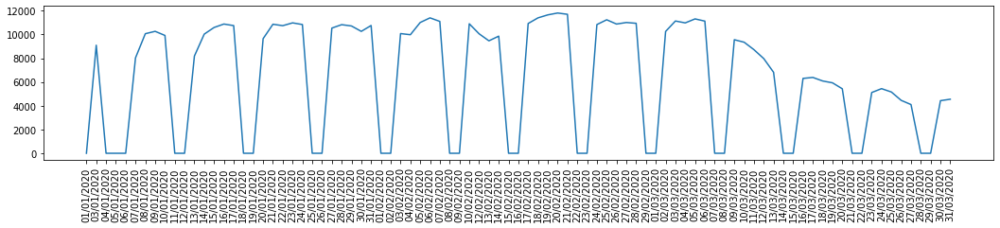

SS 309 tra Comacchio e confini provinciali di Ferrara e Ravenna


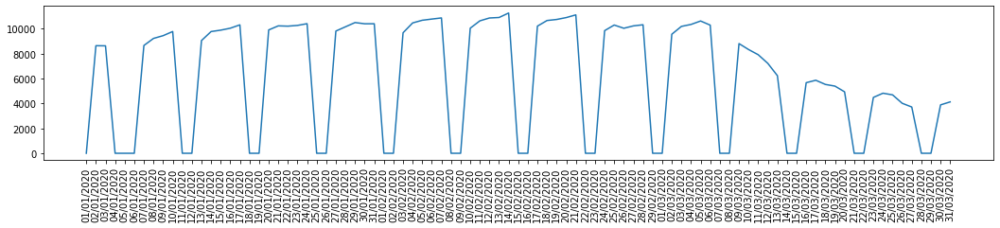

SS 3Bis/E 45 tra Borello e Mercato Saraceno


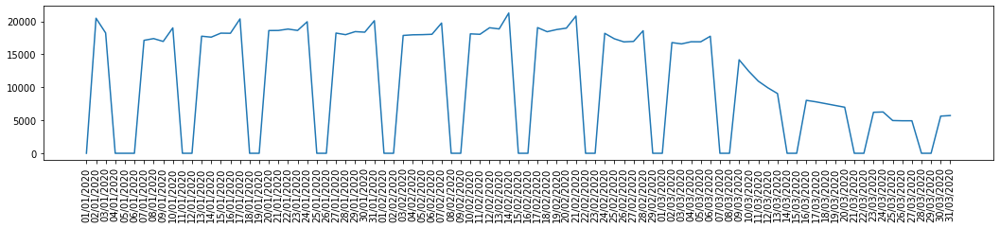

SS 45 tra Ottone e Gorreto


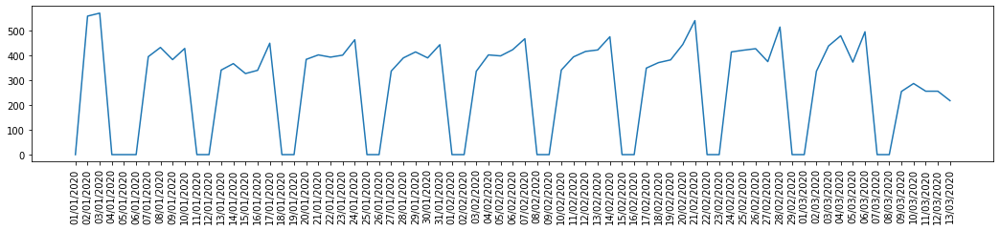

SS 45 tra Piacenza e Settima


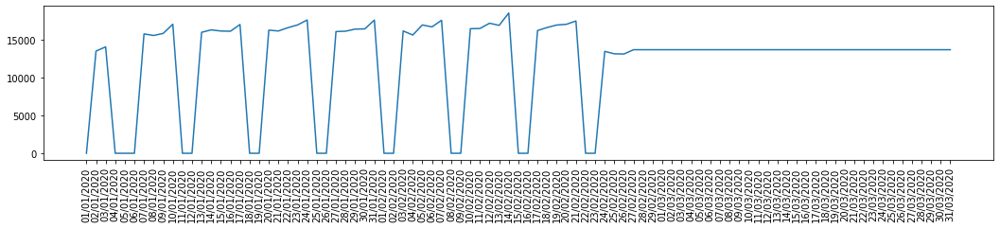

SS 45 tra Rivergaro e Perino


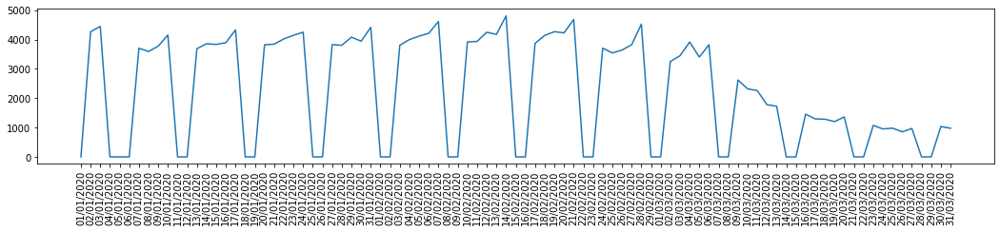

SS 62 tra Fornovo di Taro e Collecchio


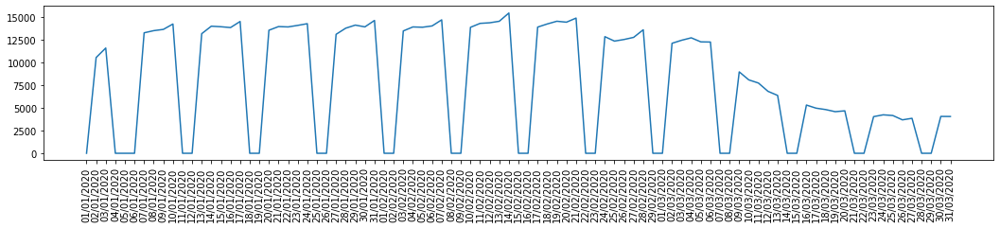

SS 62 tra Parma e Collecchio


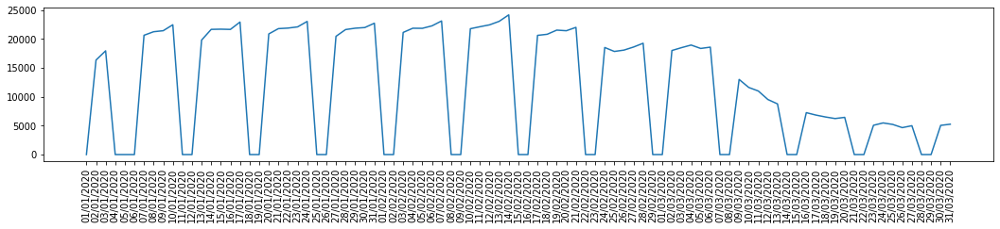

SS 63 località Casina (variante abitato)


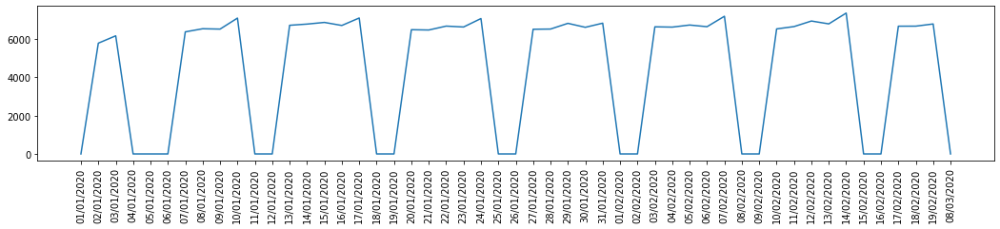

SS 63 tra Casina e Vezzano sul Crostolo


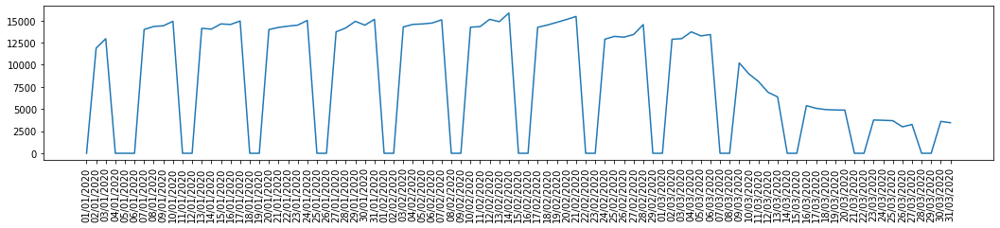

SS 63 tra Collagna e Sassalbo (Passo del Cerreto)


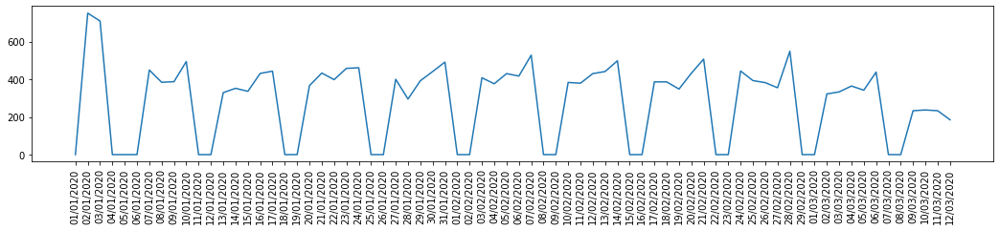

SS 63 tra Reggio Emilia e Puianello


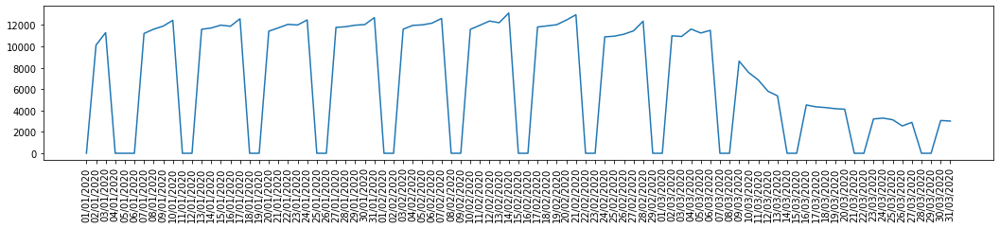

SS 64 ai confini provinciali di Bologna e Ferrara


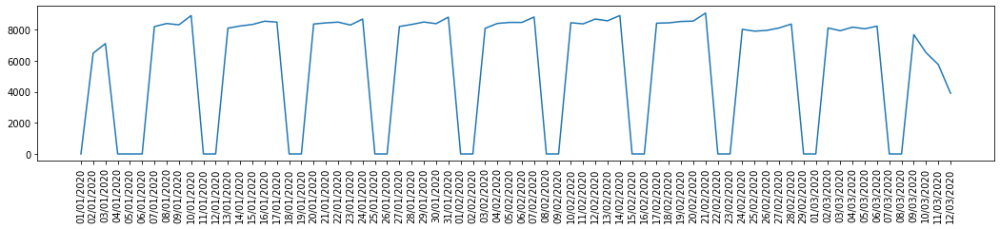

SS 64 tra Bologna e Lovoleto


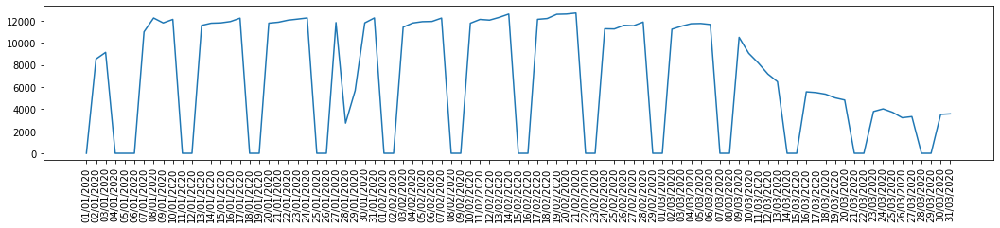

SS 64 tra Porretta Terme e Sambuca Pistoiese


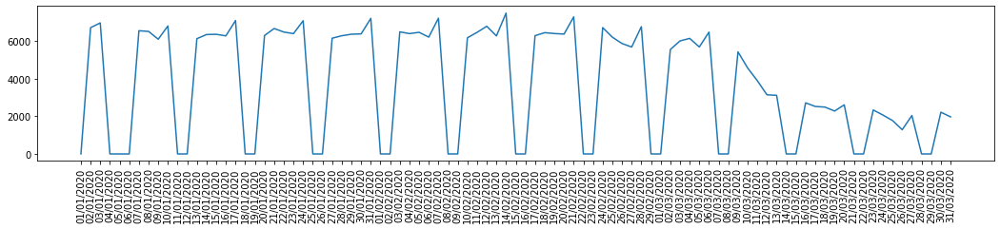

SS 64 variante di Riola di Vergato


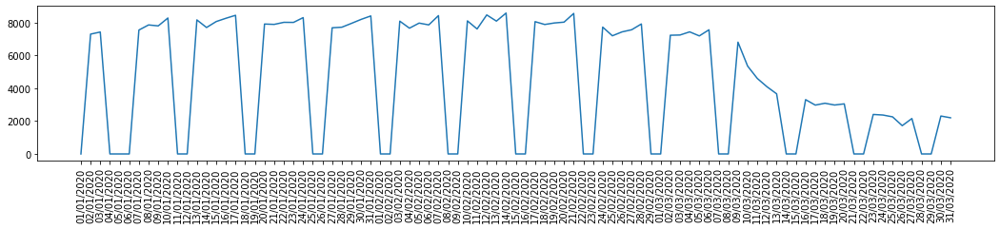

SS 67 tra Dovadola e Rocca San Casciano


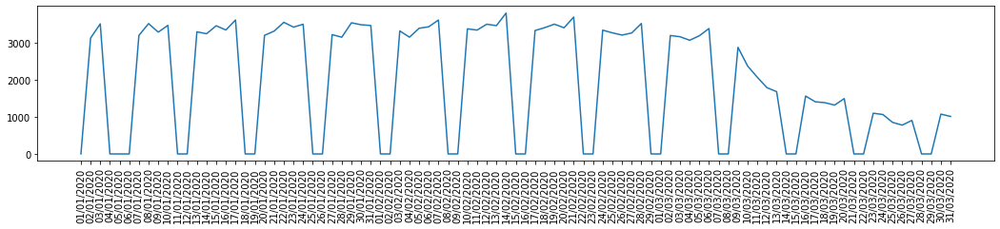

SS 67 tra Rocca San Casciano e Portico San Benedetto


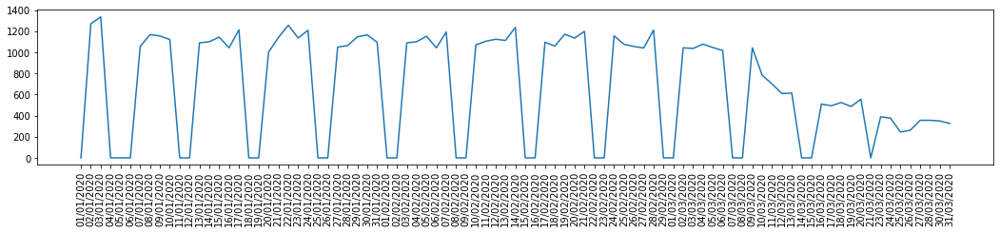

SS 67 tra Rovere e Forlì


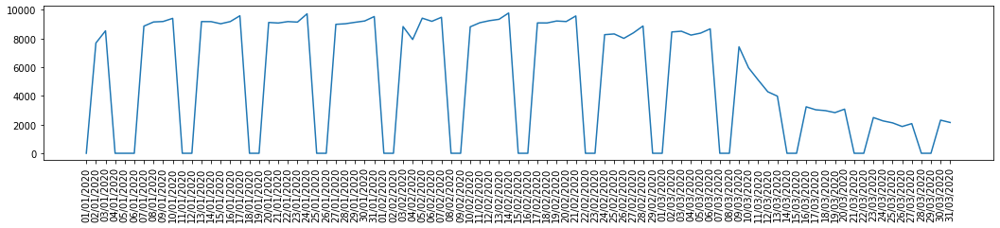

SS 72 tra Rimini e  San Marino


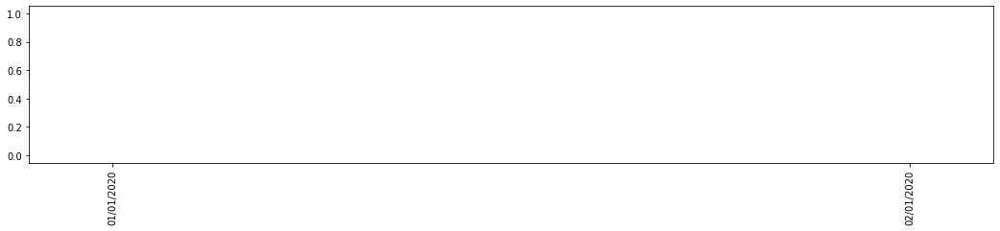

SS 722 Tangenziale nord di Reggio Emilia


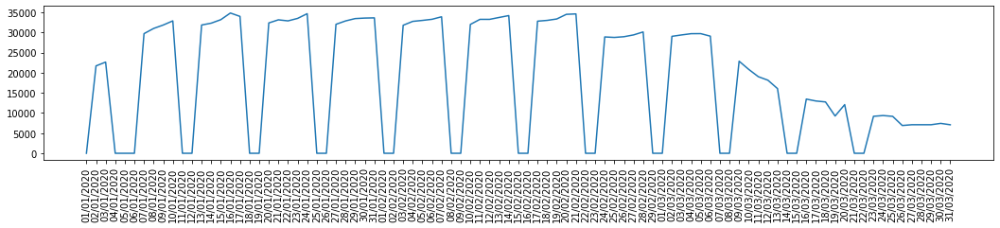

SS 724Dir/tangenziale complanare sud alla A 1 in direzione Bologna - tra intersezione Modena/Sassuolo e intersezione SS12


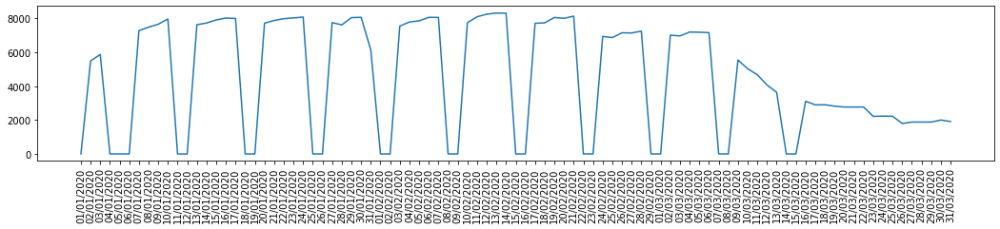

SS 725 (tg sud Piacenza) tra intersezione SS 45 e l'intersezione SP 6


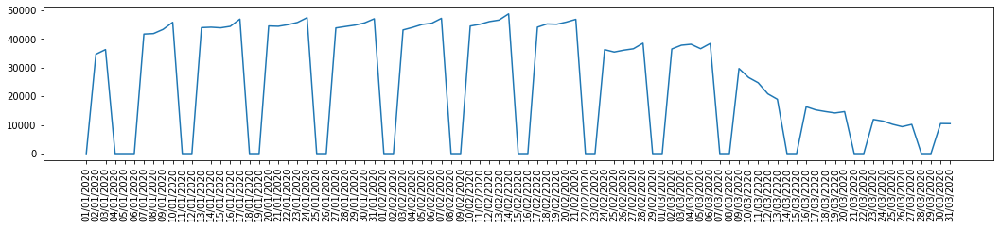

SS 726 (tg Cesena) tra intersezione ex SS 71BIS e l'intersezione SP 304R


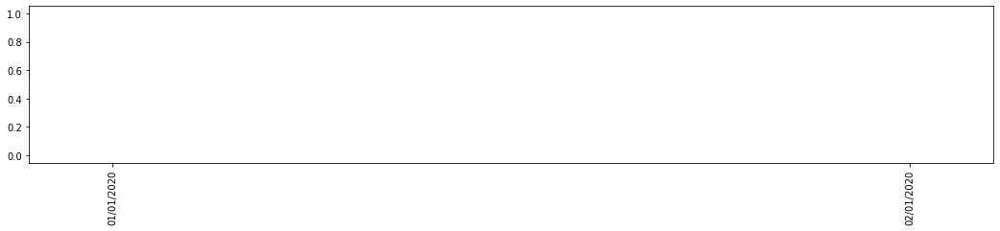

SS 727 (tg Forli') tra intersezione SS 9 e l'intersezione SS 67


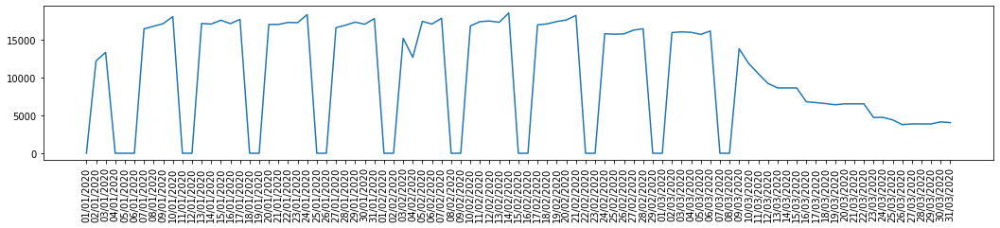

SS 9 da Imola a Castelbolognese (al confine provinciale)


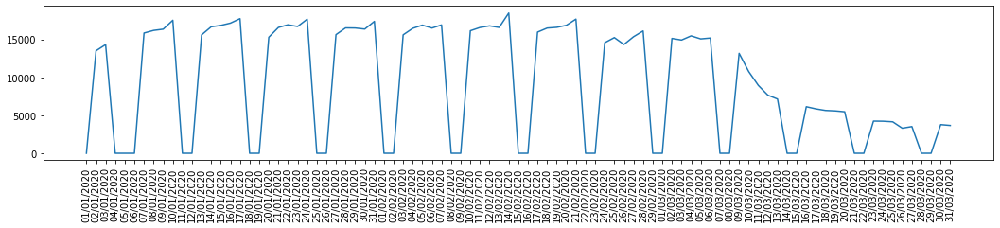

SS 9 tra Anzola dell'Emilia e Bologna


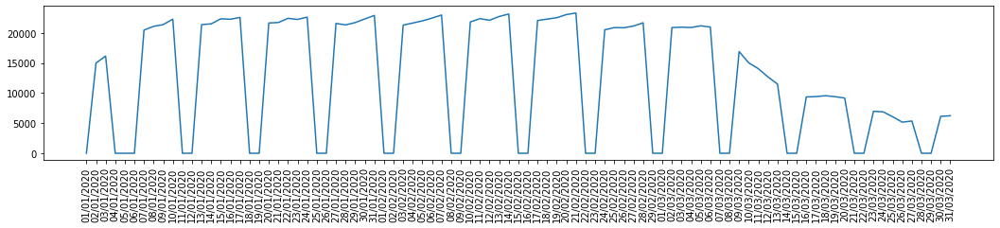

SS 9 tra Castel Bolognese e Faenza


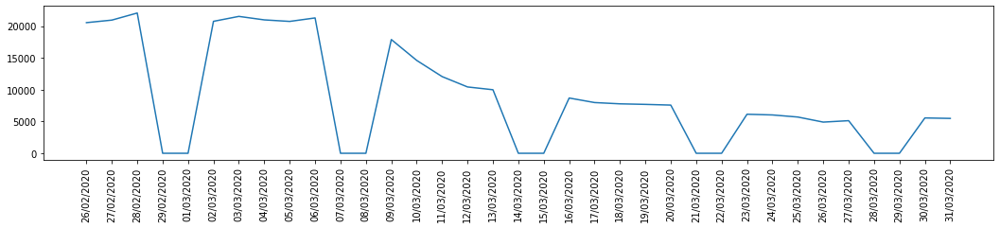

SS 9 tra Castel San Pietro e Imola


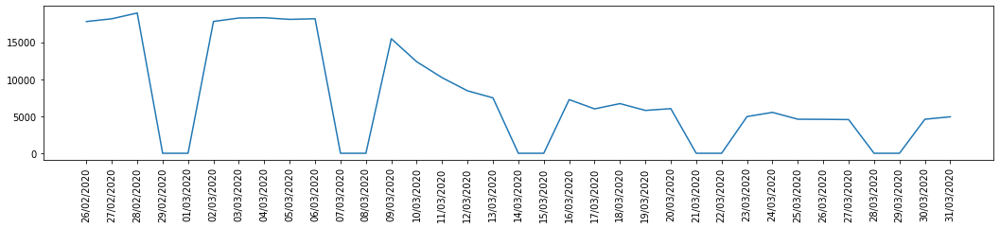

SS 9 tra Cesena e Savignano sul Rubicone


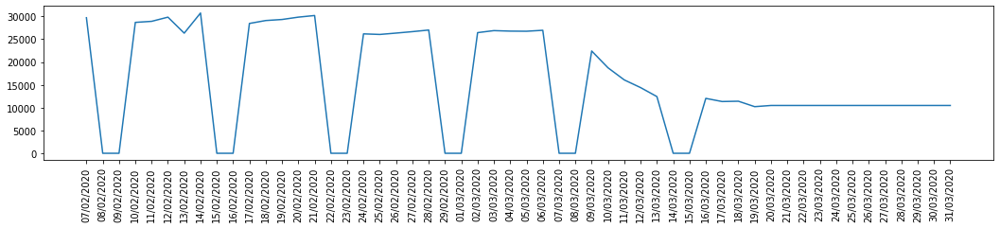

SS 9 tra Fidenza e A 15


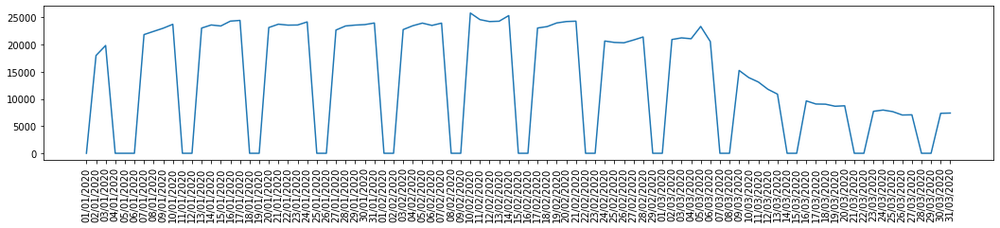

SS 9 tra Fiorenzuola d'Arda e Fidenza al confine provinciale


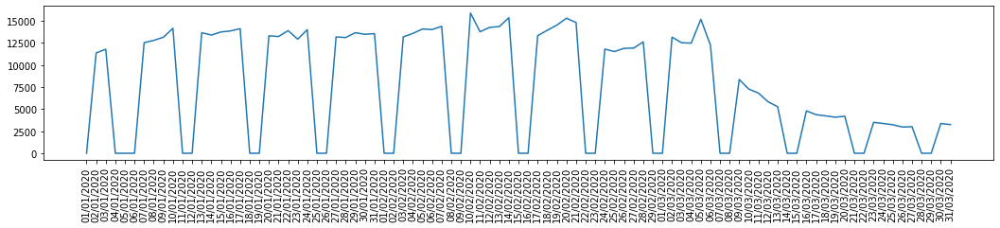

SS 9 tra Fiorenzuola d'Arda e Pontenure


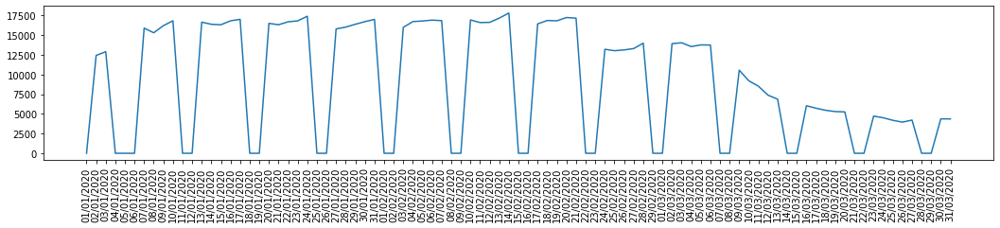

SS 9 tra Forlimpopoli e Cesena


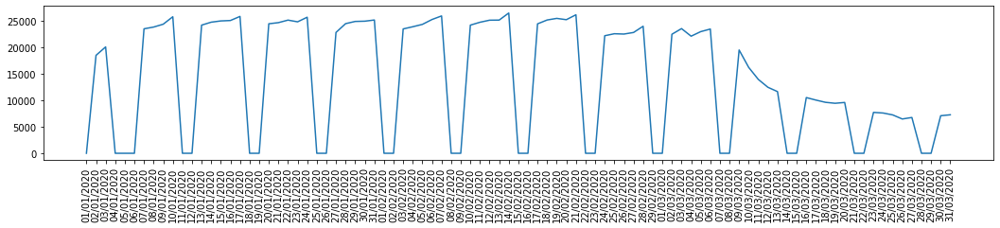

SS 9 tra Masone e Rubiera


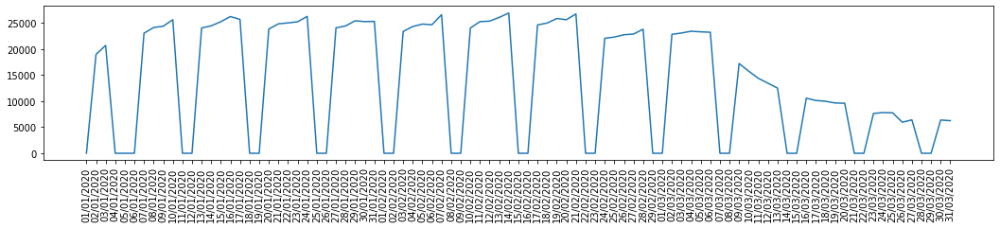

SS 9 tra Piacenza e Pontenure


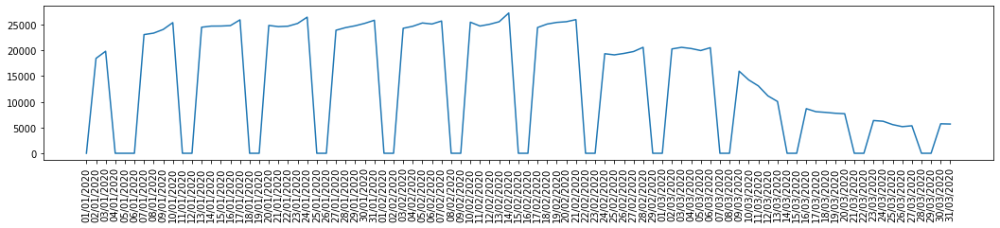

SS 9 tra Rimini e Santa Giustina


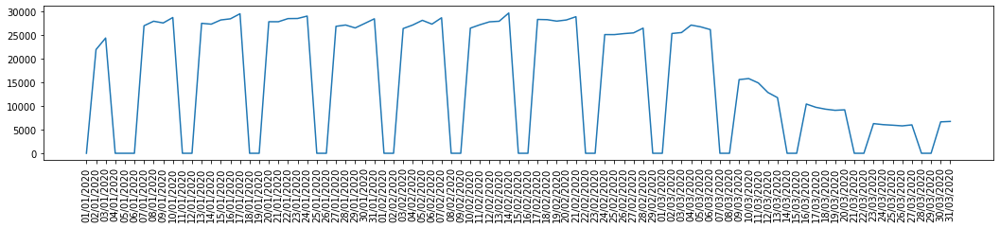

SS 9 tra Ronco e Forlimpopoli


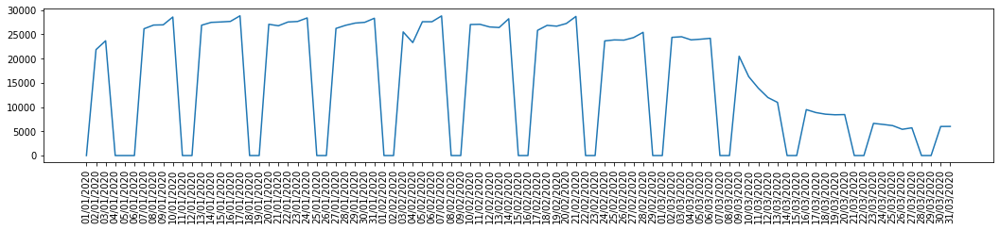

SS 9 tra San Prospero (Case Crostolo) e Sant'Ilario d'Enza


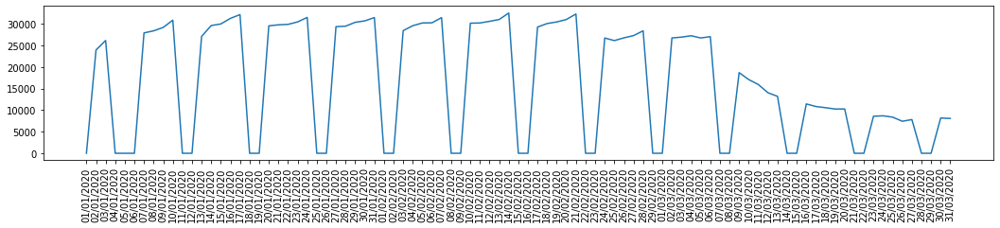

SS 9 tra Sant'Ambrogio e Castelfranco Emilia


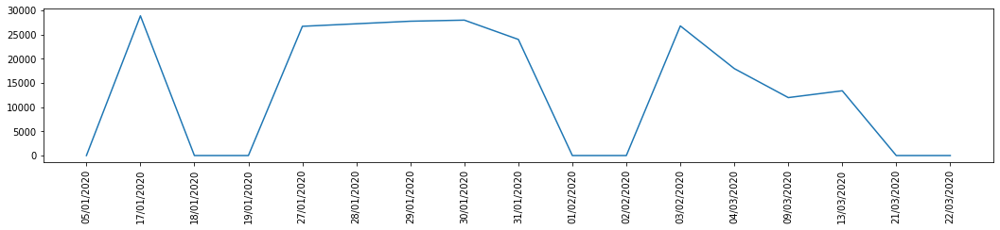

SS 9 tra Savignano sul Rubicone e Santarcangelo di Romagna


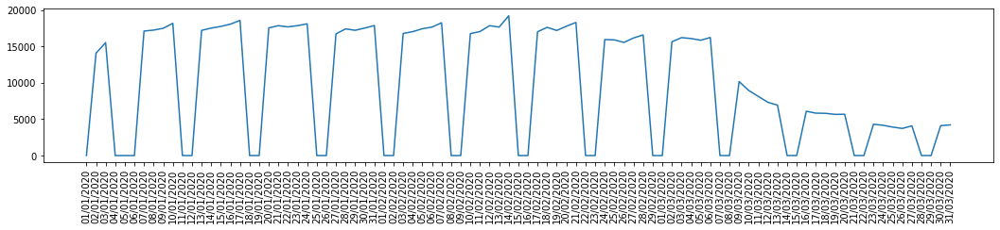

SS 9 tra la tangenziale nord di Reggio Emilia e Sant'Ilario d'Enza


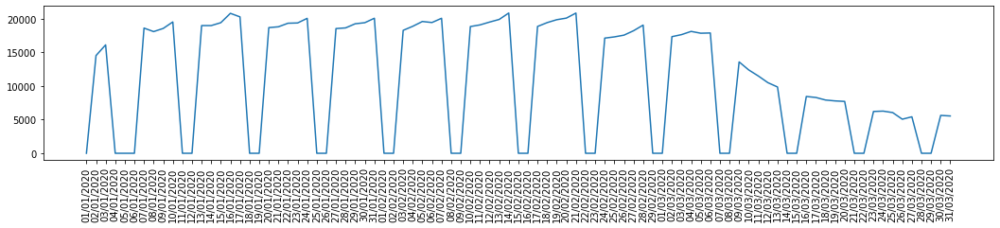

SS 9Var tra Parma e ponte fiume Taro (Tangenziale nord di Parma)


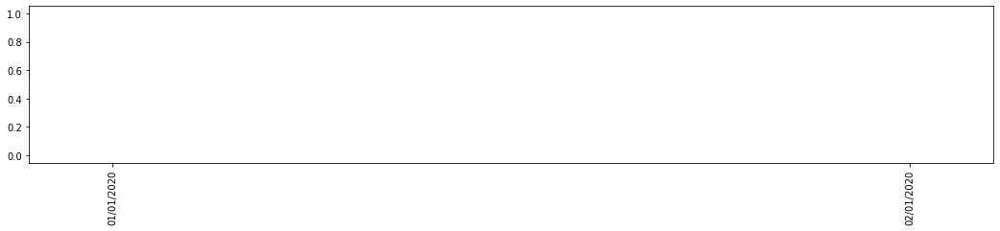

SS 9Var tra la tangenziale nord di Parma (intersezione SP 343R) e l'intersezione SP 62R


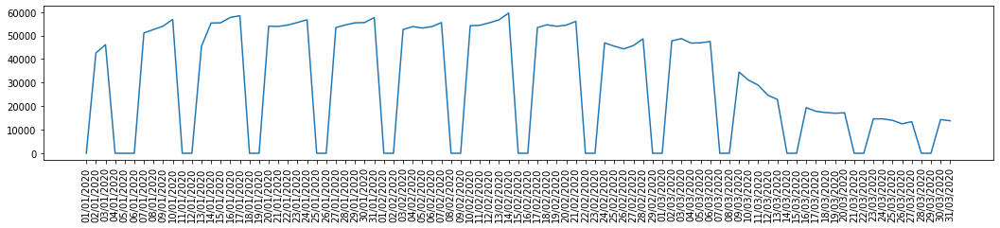

Tra Rastignano e Pian di Macina (SP85 Fondo Valle Savena)


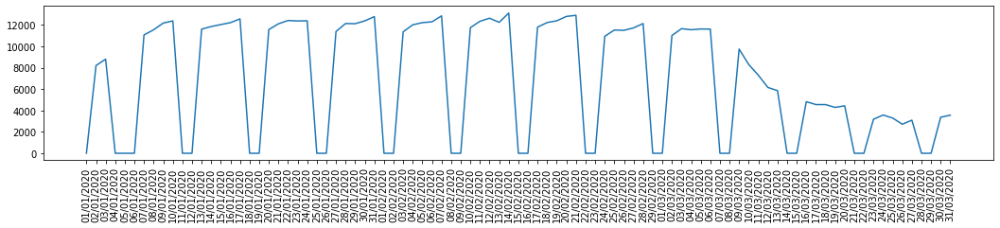

Via Adriatica (ex SS 16) tra Riccione e Misano Adriatico


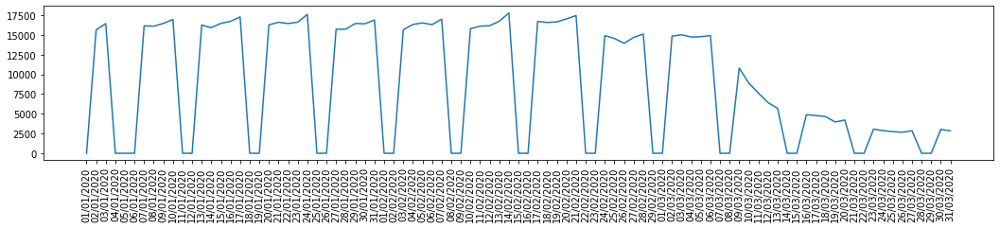

Via Emilia tra San Lazzaro e Idice


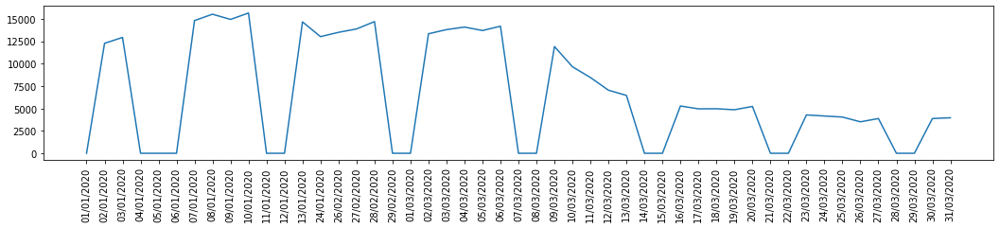

Via Porrettana (ex SS 64) tra Bologna e Pontecchio Marconi


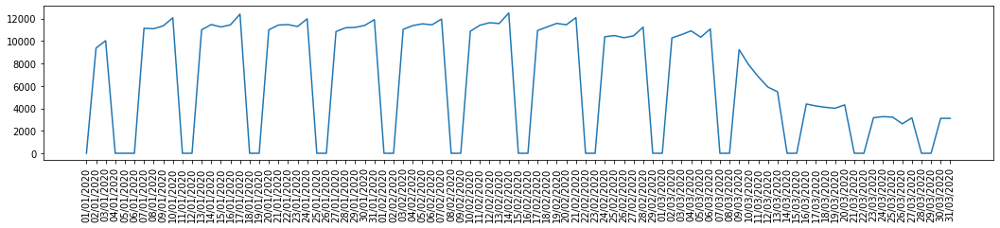

Via San Donato (ex SP 5) tra Granarolo dell'Emilia e Quarto Inferiore


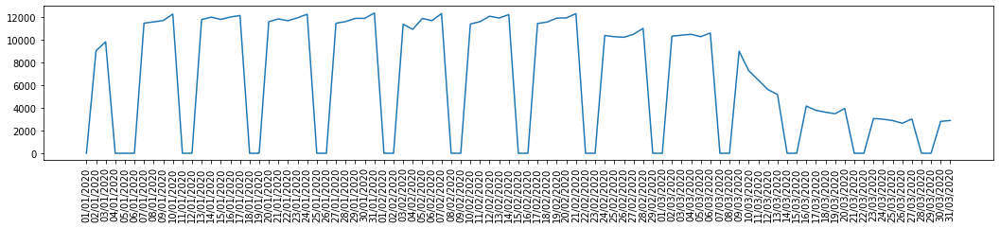

Via San Nicola (ex SP 39) tra bivio per Taneto a Caprara


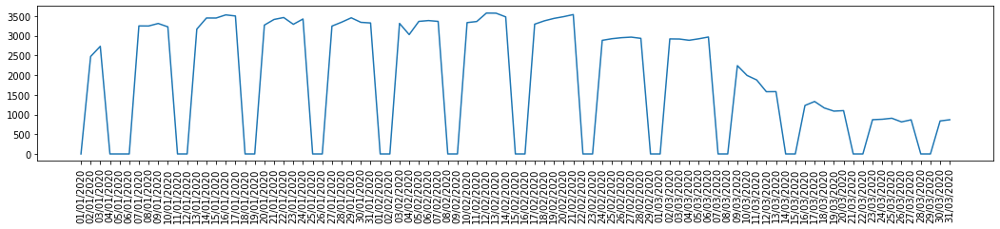

exSP 32 (via Dante Alighieri) da Felino a Pilastro


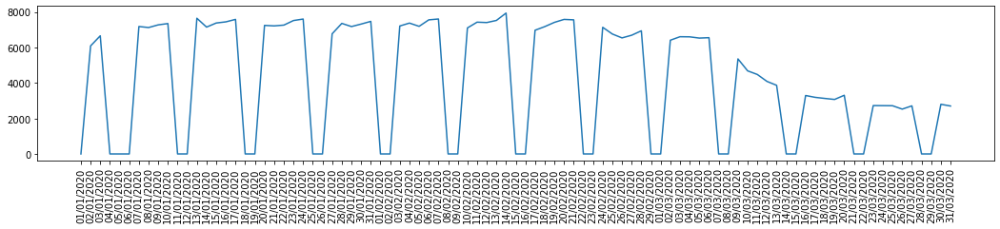

In [69]:
counter = 0
for index, strada in agg_by_Strada:
    print(index)
    counter += 1
    #if counter > 3 : break
    strada = strada.fillna(method='ffill')
    strada = strada.set_index(['Giorno'])
    plt.figure(figsize = (18, 3))
    plt.plot(strada['Transiti - Feriali'])
    plt.xticks(rotation='vertical', fontsize=10)
    plt.show()

#### Visualizzazione trafico transiti per ogni strada durante i giorni festivi 
<p>Per ragioni di spazio si visualizzano solo le prime tre strade. </p>

Asse viario Modena-Sassuolo tra Modena e Baggiovara


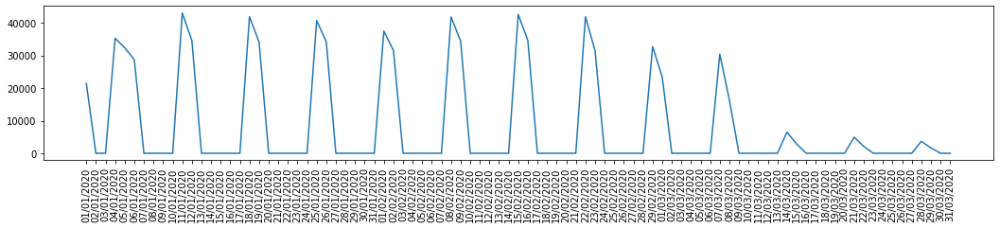

NSA 313 - Prosecuzione tangenziale di Bologna complanare sud alla A 14 nel tratto San Lazzaro/Idice


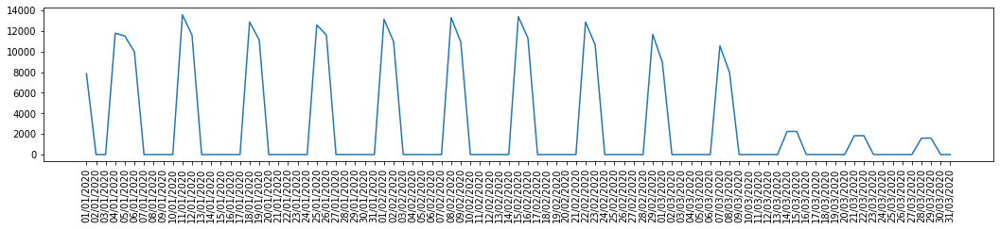

Piazzale Milano (ex SS 9) c/o ponte fiume Po


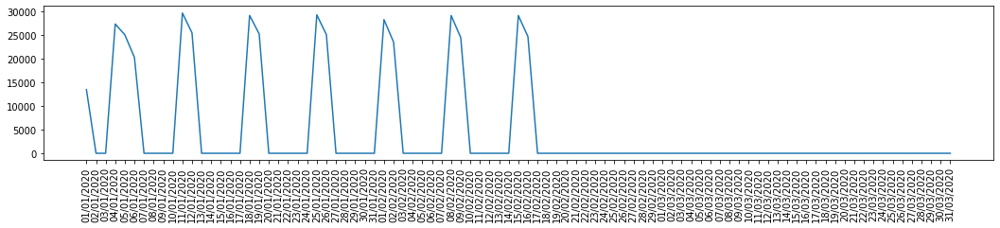

SP 1 da Villafranca di Forlì al confine provinciale


In [70]:
counter = 0
for index, strada in agg_by_Strada:
    print(index)
    counter += 1
    if counter > 3 : break
    strada = strada.fillna(method='ffill')
    strada = strada.set_index(['Giorno'])
    plt.figure(figsize = (18, 3))
    plt.plot(strada['Transiti - Festivi'])
    plt.xticks(rotation='vertical', fontsize=10)
    plt.show()

### Scomposizione Serie Temporale 
<p>La scomposizione STL permette di rappresentare una serie temporale come somma delle sue componenti : </p>

-Trend

-Stagionalità

-Rumore 

Asse viario Modena-Sassuolo tra Modena e Baggiovara


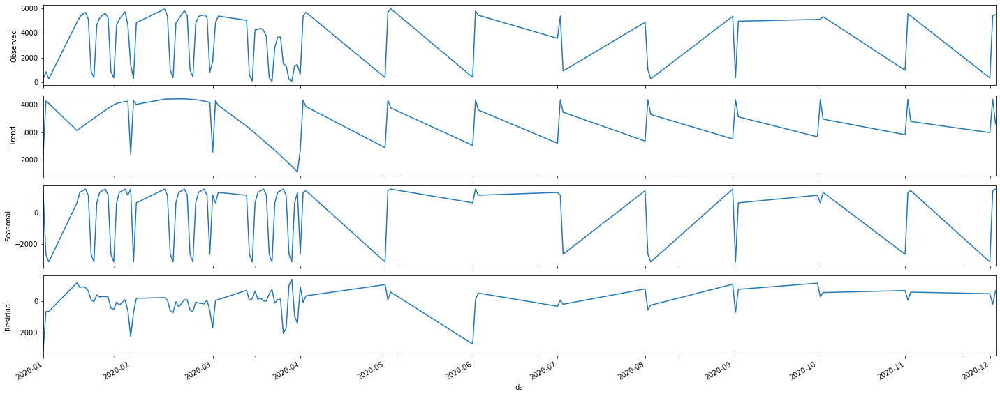

NSA 313 - Prosecuzione tangenziale di Bologna complanare sud alla A 14 nel tratto San Lazzaro/Idice


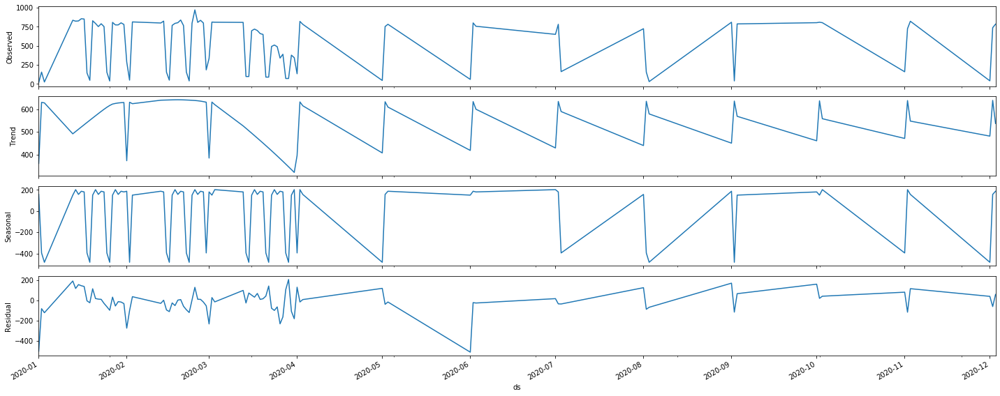

Piazzale Milano (ex SS 9) c/o ponte fiume Po


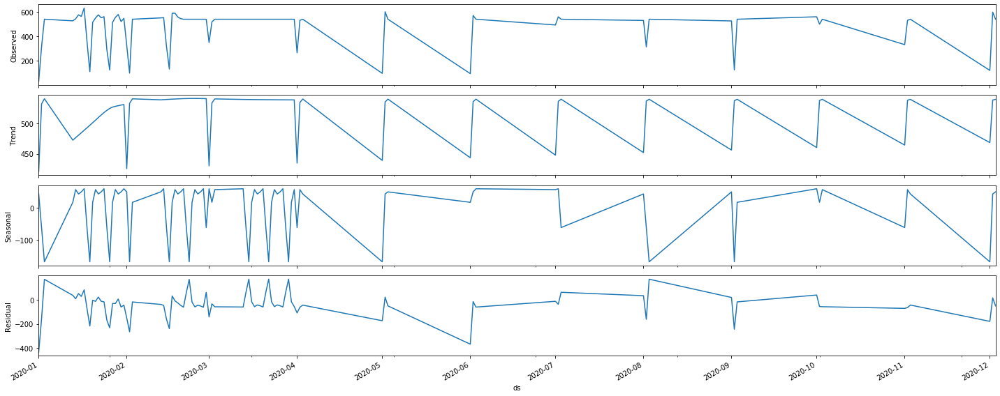

SP 1 da Villafranca di Forlì al confine provinciale


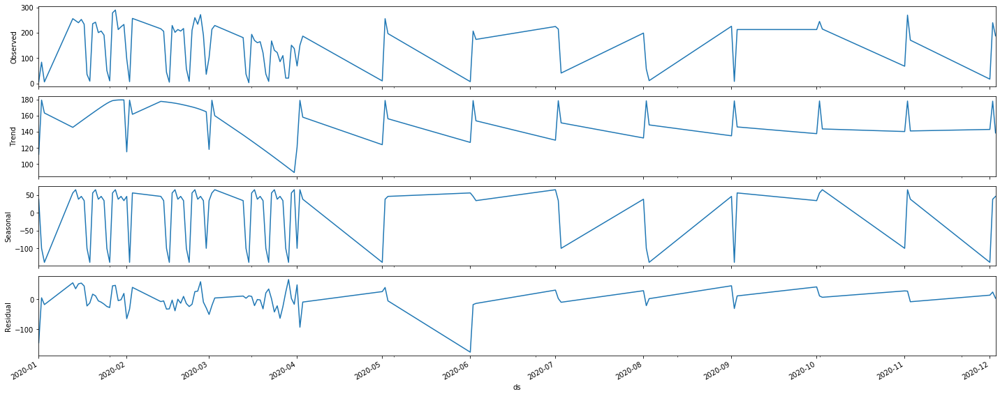

In [71]:
counter = 0
for index, strada in agg_by_Strada:
    counter += 1
    if counter > 4: break
    print(index)
    dates4dec = []
    cell_values = []
    strada = strada.fillna(method='ffill')
    #strada = strada.set_index(['Giorno'])
    for index, row in strada.iterrows():
    
        date = row['Giorno']
        splited = date.split('/')
        day = splited[0]
        month = splited[1]
        year = splited[2]
        
        data_f = day+'-'+month+'-'+year
        
        cell_values.append(float(row['Transiti - Pesanti']))
        dates4dec.append(data_f) 
    
    dict_i = {'ds': dates4dec, 'y':cell_values}
    data4deco = pd.DataFrame(dict_i, index=None, columns=None)  
    data4deco['ds'] = pd.to_datetime(data4deco['ds'])
    data4deco = data4deco.set_index('ds')
    
    decomp = decompose(data4deco['y'], period = 7)

    with plt.rc_context():
        plt.rc("figure", figsize=(20,8))
        decomp.plot()
        plt.show()

### Visualizzazione dati location 
<p> Ogni postazione ha un certo numero e delle coordinate che possono essere visualizzate su una mappa</p>

In [72]:
geo_df = gpd.read_file('MTS/PostazioniSensoriWGS84.shp')
geo_df.head(2)

,NAME,x,y,geometry
0,124,9.668308,45.001248,POINT (9.66831 45.00125)
1,127,9.764245,45.013715,POINT (9.76424 45.01371)


In [73]:
m = folium.Map(location = [44.5011,11.3602], zoom_start=8)

for index, row in geo_df.iterrows():
    x = float(row['x'])
    y = float( row['y'])
    name = row['NAME']
    folium.Marker([y, x], popup='<i>Postazione '+str(name)+'</i>', icon=folium.Icon(color='green')).add_to(m)
display(m)

In [74]:
m = folium.Map(
    location=[44.5011,11.3602],
    tiles='Stamen Toner',
    zoom_start=8
)
for index, row in geo_df.iterrows():
    x = float(row['x'])
    y = float( row['y'])
    name = row['NAME']
    folium.Marker([y, x], popup='<i>Postazione '+str(name)+'</i>', icon=folium.Icon(color='green')).add_to(m)
display(m)

### Analisi medie per i dati aggregati mensilmente del 2020

In [75]:
data_post_mese = pd.read_csv('MTS_2020_Mese.csv', sep = ';')
data_post.head(2)

,AnnoMese,Postazione,Giorno,N Giorno Settimana,Strada,Transiti - Totale,Transiti - Non Classificato,Transiti - Leggeri,Transiti - Pesanti,Transiti - Diurno,Transiti - Notturno,Transiti - Feriali,Transiti - Festivi
0,2020/01,6,01/01/2020,3,SS 12 tra Fiumalbo e Abetone,4573.0,0.0,4560.0,13.0,3451.0,1122.0,0.0,4573.0
1,2020/01,6,02/01/2020,4,SS 12 tra Fiumalbo e Abetone,3709.0,0.0,3664.0,45.0,3226.0,483.0,3709.0,0.0


#### Aggregazione dati per strada 

Asse viario Modena-Sassuolo tra Modena e Baggiovara


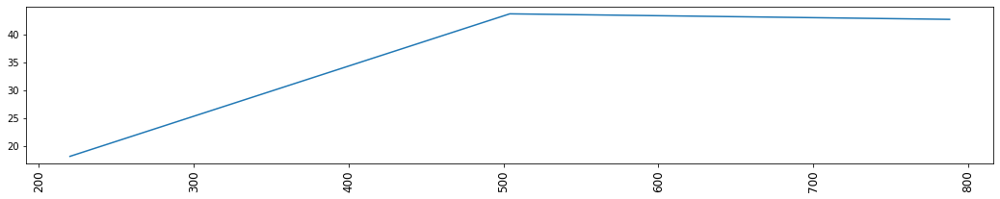

NSA 313 - Prosecuzione tangenziale di Bologna complanare sud alla A 14 nel tratto San Lazzaro/Idice


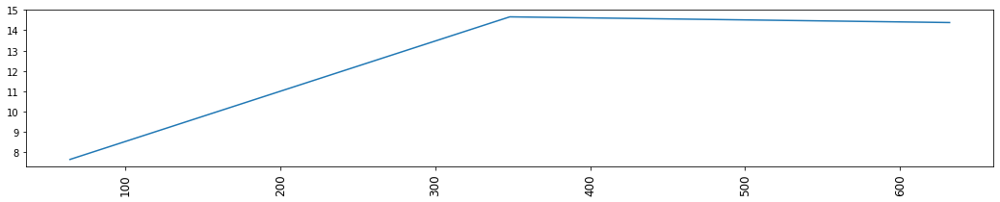

Piazzale Milano (ex SS 9) c/o ponte fiume Po


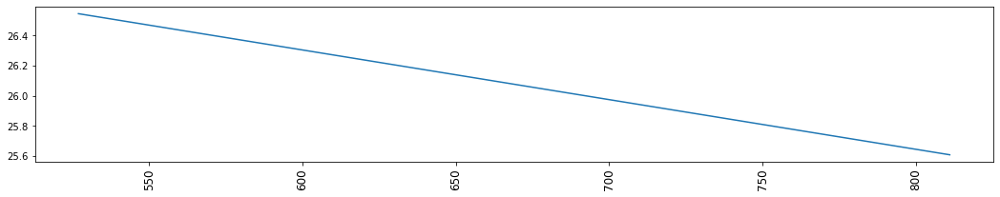

SP 1 da Villafranca di Forlì al confine provinciale


In [76]:
agg_by_strada_mese = data_post_mese.groupby(by = ['Strada']) #['TGM - Totale']
counter = 0
for index, strada in agg_by_strada_mese: 
    print(index)
    counter += 1
    if counter > 3 : break
    strada = strada.fillna(method='ffill')
    plt.figure(figsize = (18, 3))
    plt.plot(strada['TGM - Leggeri'])
    plt.xticks(rotation='vertical', fontsize=12)
    plt.show()